# Ekstraksi Zoning 6 Zona dengan 270 Data

## Import Library 

In [1]:
import os
import cv2
import numpy as np
import math
import pandas as pd
from PIL import Image
from matplotlib import pyplot as plt
from skimage import io, color
import seaborn as sns

## Training

### Preprocessing

#### Load Data Training

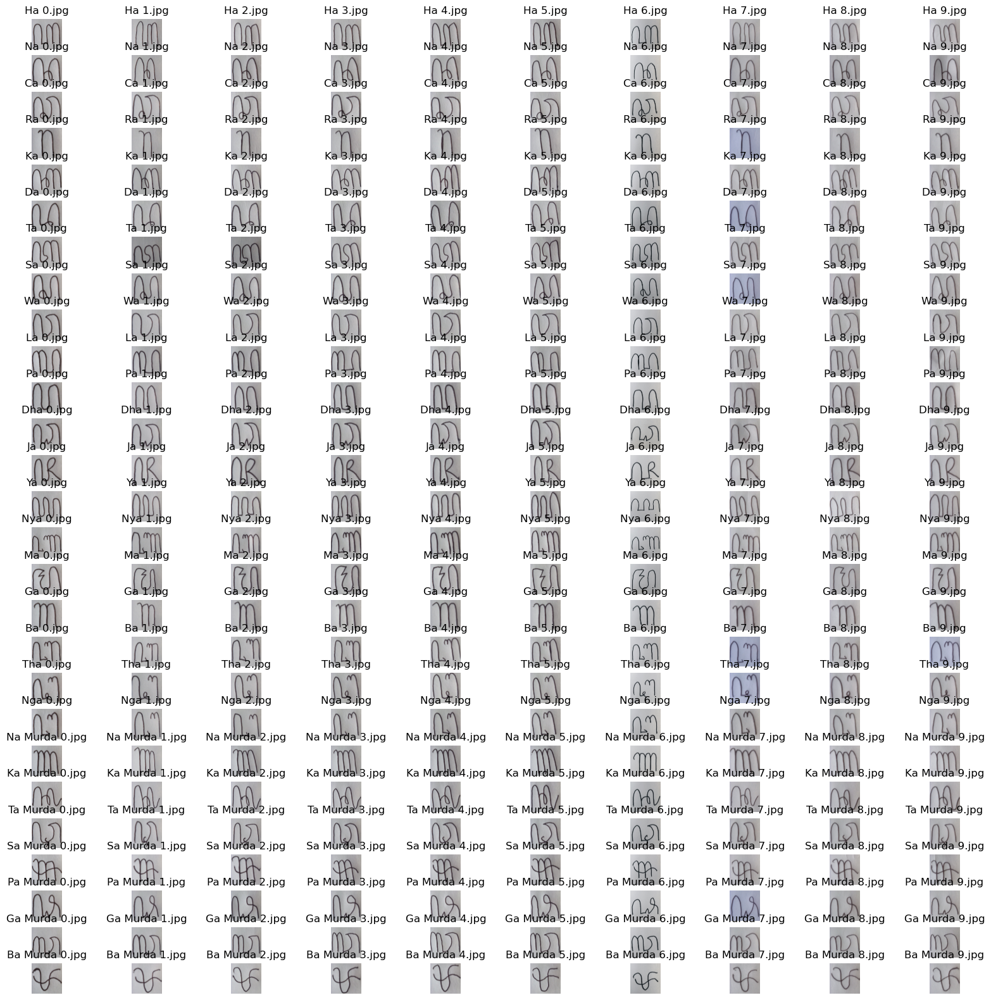

In [2]:
i = 0
k = 0
images = []
name = np.empty(270, dtype=object)
root_folder = 'Data Training 2'
subfolders = ['Ha', 'Na', 'Ca', 'Ra', 'Ka', 'Da', 'Ta', 'Sa', 'Wa', 
              'La', 'Pa', 'Dha', 'Ja','Ya', 'Nya', 'Ma', 'Ga', 'Ba', 
              'Tha', 'Nga', 'Na Murda', 'Ka Murda', 'Ta Murda', 'Sa Murda', 'Pa Murda', 'Ga Murda', 'Ba Murda']
fig, axs = plt.subplots(nrows = 27, ncols = 10, figsize = (20,20))
axs = axs.flatten()

for subfolder in subfolders:
    subfolder_path = os.path.join(root_folder, subfolder)
    
    for file in os.listdir(subfolder_path):
        if file.lower().endswith(('.jpg')):
            image_path = os.path.join(subfolder_path, file)
            image = Image.open(image_path)
            images.append(image)
            axs[i].imshow(image)
            axs[i].axis('off')
            filename = os.path.basename(file)
            name[i] = filename
            axs[i].set_title(filename)
            i += 1
            
plt.show() 

#### Resize Data Training

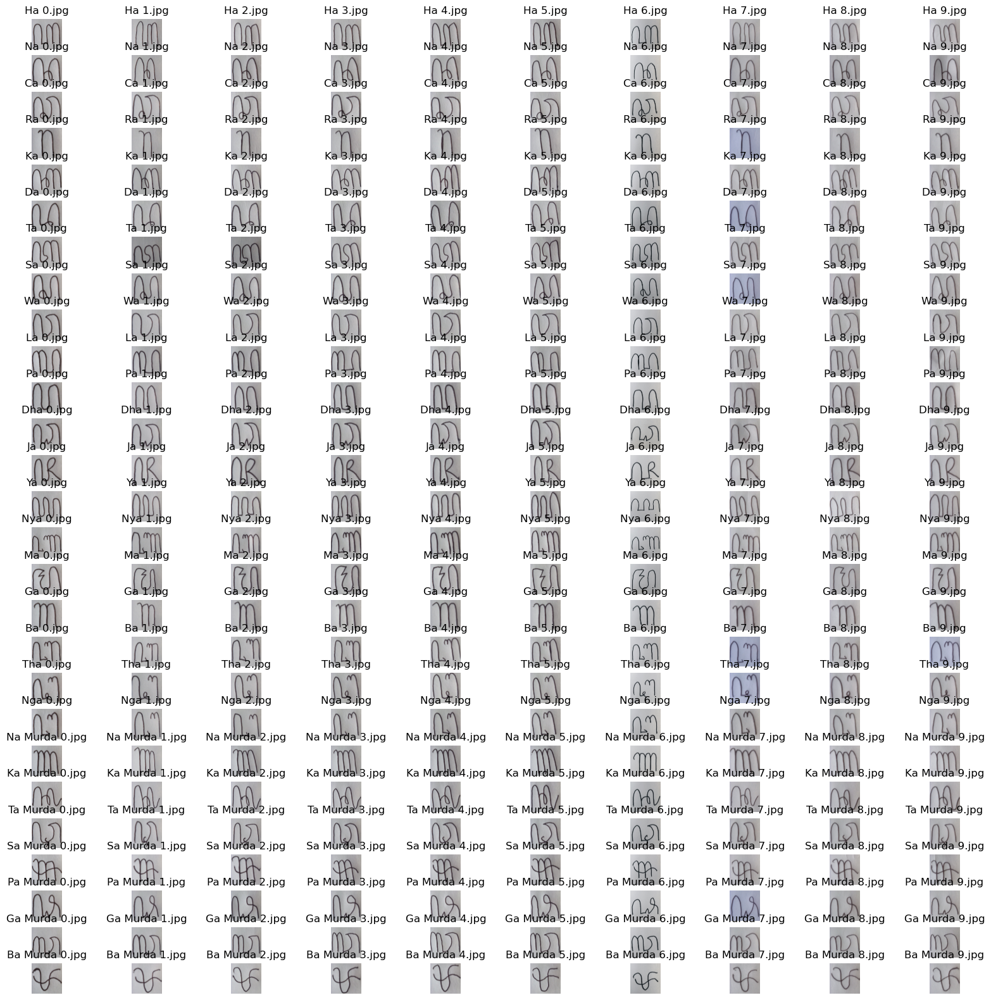

In [3]:
i = 0
resized_images = []
fig, axs = plt.subplots(nrows = 27, ncols = 10, figsize = (20,20))
axs = axs.flatten()

for image in images:
    resized_image = image.resize((120, 120))
    resized_images.append(resized_image)
    axs[i].imshow(image)
    axs[i].axis('off')
    axs[i].set_title(name[i])
    i += 1

plt.show()

#### Grayscale Data Training

In [4]:
grayscale_images = []
for image in resized_images:
    width, height = image.size
    grayscale_img = Image.new("L", (width, height))
        
    for x in range(width):
            
        for y in range(height):
            r, g, b = image.getpixel((x, y))
            brightness = int(0.2989 * r + 0.5870 * g + 0.1140 * b)
            grayscale_img.putpixel((x, y), brightness)
            
    grayscale_images.append(grayscale_img)

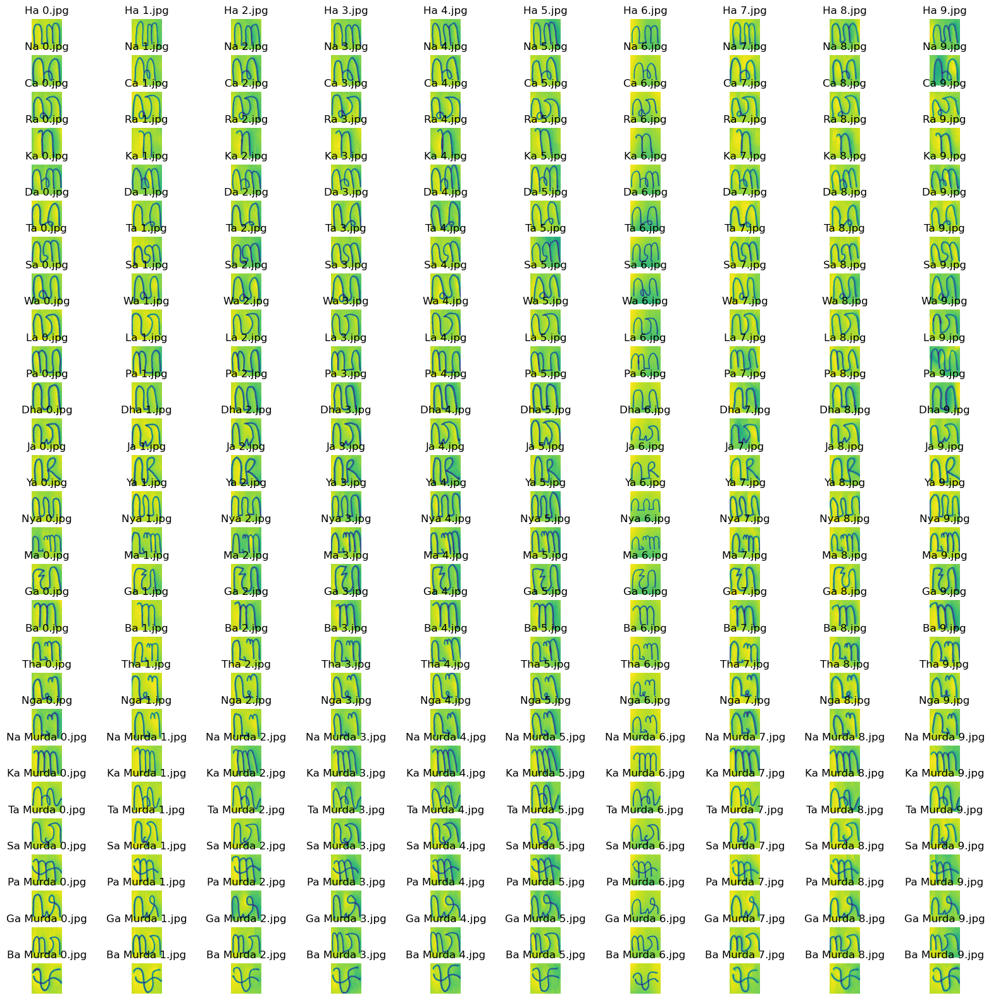

In [5]:
i = 0
fig, axs = plt.subplots(nrows = 27, ncols = 10, figsize = (20,20))
axs = axs.flatten()

for image in grayscale_images:
    axs[i].imshow(image)
    axs[i].axis('off')
    axs[i].set_title(name[i])
    i += 1
    
plt.show()

#### Sauvola Threshold Data Training

In [6]:
k = 0.2
R = 128
threshold_images = []

for image in grayscale_images:
    image = image.rotate(270)
    image = image.transpose(method=Image.FLIP_LEFT_RIGHT)
    img_array = np.array(image)
    width, height = image.size
    binary_img = Image.new("1", (width, height))
        
    for x in range(width):
            
        for y in range(height):
            window = img_array[max(x-15, 0):min(x+15, width), max(y-15, 0):min(y+15, height)]
            mean = np.mean(window)
            stddev = np.std(window)
            threshold = mean * (1 + k * ((stddev / R) - 1))
                
            if img_array[x, y] > threshold:
                binary_img.putpixel((x, y), 0)
            else:
                binary_img.putpixel((x, y), 255)
    
    threshold_images.append(binary_img)

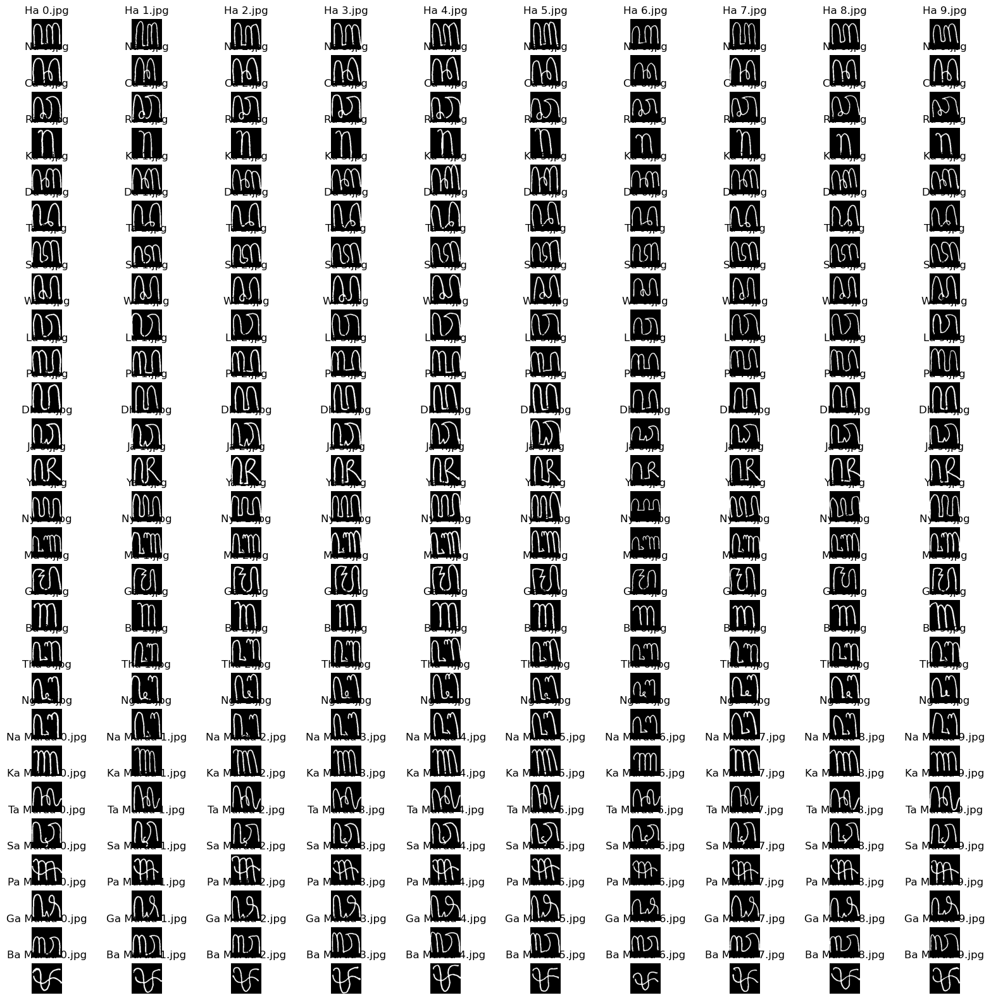

In [7]:
i = 0
fig, axs = plt.subplots(nrows = 27, ncols = 10, figsize = (20,20))
axs = axs.flatten()

for image in threshold_images:
    axs[i].imshow(image)
    axs[i].axis('off')
    axs[i].set_title(name[i])
    i += 1
    
plt.show()

### Ekstraksi Zoning ICZ dan ZCZ 

#### Ekstraksi Zoning

In [8]:
i = 0
k = 0
centroid = np.zeros((len(threshold_images), 14))
array_ekstraksi = np.zeros((len(threshold_images), 12))
array_ngelegena = np.zeros((200, 12))
array_murda =  np.zeros((70, 12))

for image in threshold_images:
    width, height = image.size
    zone_height = height // 6
    zone1 = image.crop((0, 0, width, zone_height))
    zone2 = image.crop((0, zone_height, width, zone_height * 2))
    zone3 = image.crop((0, zone_height * 2, width, zone_height * 3))
    zone4 = image.crop((0, zone_height * 3, width, zone_height * 4))
    zone5 = image.crop((0, zone_height * 4, width, zone_height * 5))
    zone6 = image.crop((0, zone_height * 5, width, height))
    
    img_array = np.array(image)
    img_zone1 = np.array(zone1)
    img_zone2 = np.array(zone2)
    img_zone3 = np.array(zone3)
    img_zone4 = np.array(zone4)
    img_zone5 = np.array(zone5)
    img_zone6 = np.array(zone6)
    total_pixel = np.sum(img_array)
    total_zone1 = np.sum(img_zone1)
    total_zone2 = np.sum(img_zone2)
    total_zone3 = np.sum(img_zone3)
    total_zone4 = np.sum(img_zone4)
    total_zone5 = np.sum(img_zone5)
    total_zone6 = np.sum(img_zone6)
    
    kolom = 0
    baris = 0
    kolom_zone1 = 0
    kolom_zone2 = 0
    kolom_zone3 = 0
    kolom_zone4 = 0
    kolom_zone5 = 0
    kolom_zone6 = 0
    baris_zone1 = 0
    baris_zone2 = 0
    baris_zone3 = 0
    baris_zone4 = 0
    baris_zone5 = 0
    baris_zone6 = 0
    sum_kolom = 0
    sum_baris = 0
    sumkolom_zone1 = 0
    sumkolom_zone2 = 0
    sumkolom_zone3 = 0
    sumkolom_zone4 = 0
    sumkolom_zone5 = 0
    sumkolom_zone6 = 0
    sumbaris_zone1 = 0
    sumbaris_zone2 = 0
    sumbaris_zone3 = 0
    sumbaris_zone4 = 0
    sumbaris_zone5 = 0
    sumbaris_zone6 = 0
    sumiczzone1 = 0
    sumiczzone2 = 0
    sumiczzone3 = 0
    sumiczzone4 = 0
    sumiczzone5 = 0
    sumiczzone6 = 0
    sumzczzone1 = 0
    sumzczzone2 = 0
    sumzczzone3 = 0
    sumzczzone4 = 0
    sumzczzone5 = 0
    sumzczzone6 = 0
    
    for x in range(width):
    
        for y in range(height):
            kolom += img_array[y][x]
            baris += img_array[x][y]
    
        sum_kolom += kolom * (x + 1)  
        sum_baris += baris * (x + 1)
            
        kolom = 0
        baris = 0
        
    for x in range(len(img_zone1)):
            
        for y in range(len(img_zone1[x])):
            baris_zone1 += img_zone1[x][y]
            baris_zone2 += img_zone2[x][y]
            baris_zone3 += img_zone3[x][y]
            baris_zone4 += img_zone4[x][y]
            baris_zone5 += img_zone5[x][y]
            baris_zone6 += img_zone6[x][y]
            
        sumbaris_zone1 += baris_zone1 * (x + 1)
        sumbaris_zone2 += baris_zone2 * (x + 1)
        sumbaris_zone3 += baris_zone3 * (x + 1)
        sumbaris_zone4 += baris_zone4 * (x + 1)
        sumbaris_zone5 += baris_zone5 * (x + 1)
        sumbaris_zone6 += baris_zone6 * (x + 1)

        baris_zone1 = 0
        baris_zone2 = 0
        baris_zone3 = 0
        baris_zone4 = 0
        baris_zone5 = 0
        baris_zone6 = 0
            
    for x in range(len(img_zone1[0])):
            
        for y in range(len(img_zone1)):
            kolom_zone1 += img_zone1[y][x]
            kolom_zone2 += img_zone2[y][x]    
            kolom_zone3 += img_zone3[y][x]
            kolom_zone4 += img_zone4[y][x]
            kolom_zone5 += img_zone5[y][x]
            kolom_zone6 += img_zone6[y][x]
                
        sumkolom_zone1 += kolom_zone1 * (x + 1)  
        sumkolom_zone2 += kolom_zone2 * (x + 1)  
        sumkolom_zone3 += kolom_zone3 * (x + 1)
        sumkolom_zone4 += kolom_zone4 * (x + 1)
        sumkolom_zone5 += kolom_zone5 * (x + 1)
        sumkolom_zone6 += kolom_zone6 * (x + 1)
            
        kolom_zone1 = 0
        kolom_zone2 = 0
        kolom_zone3 = 0
        kolom_zone4 = 0
        kolom_zone5 = 0
        kolom_zone6 = 0
            
    centroid_x = sum_kolom / total_pixel
    centroid_y = sum_baris / total_pixel
        
    centroidx_zone1 = sumkolom_zone1 / total_zone1
    centroidx_zone2 = sumkolom_zone2 / total_zone2
    centroidx_zone3 = sumkolom_zone3 / total_zone3
    centroidx_zone4 = sumkolom_zone4 / total_zone4
    centroidx_zone5 = sumkolom_zone5 / total_zone5
    centroidx_zone6 = sumkolom_zone6 / total_zone6
    
    centroidy_zone1 = sumbaris_zone1 / total_zone1
    centroidy_zone2 = sumbaris_zone2 / total_zone2
    centroidy_zone3 = sumbaris_zone3 / total_zone3
    centroidy_zone4 = sumbaris_zone4 / total_zone4
    centroidy_zone5 = sumbaris_zone5 / total_zone5
    centroidy_zone6 = sumbaris_zone6 / total_zone6
    
    centroid[i] = [centroid_x, centroid_y, centroidx_zone1, centroidx_zone2, centroidx_zone3, centroidx_zone4, centroidx_zone5, centroidx_zone6
                   , centroidy_zone1, centroidy_zone2, centroidy_zone3, centroidy_zone4, centroidy_zone5, centroidy_zone6]
    
    if math.isnan(centroidx_zone1) and math.isnan(centroidy_zone1):
        centroidx_zone1 = 0
        centroidy_zone1 = 0
        
    if math.isnan(centroidx_zone2) and math.isnan(centroidy_zone2):
        centroidx_zone2 = 0
        centroidy_zone2 = 0
        
    if math.isnan(centroidx_zone3) and math.isnan(centroidy_zone3):
        centroidx_zone3 = 0
        centroidy_zone3 = 0
        
    if math.isnan(centroidx_zone4) and math.isnan(centroidy_zone4):
        centroidx_zone4 = 0
        centroidy_zone4 = 0
        
    if math.isnan(centroidx_zone5) and math.isnan(centroidy_zone5):
        centroidx_zone5 = 0
        centroidy_zone5 = 0
        
    if math.isnan(centroidx_zone6) and math.isnan(centroidy_zone6):
        centroidx_zone6 = 0
        centroidy_zone6 = 0
        
    for x in range(len(img_zone1)):
            
        for y in range(len(img_zone1[0])):
            if img_zone1[x][y] == True:
                sumiczzone1 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone1 += math.sqrt(pow(((y+1) - centroidx_zone1), 2) + pow(((x+1) - centroidy_zone1), 2))
                
            if img_zone2[x][y] == True:
                sumiczzone2 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone2 += math.sqrt(pow(((y+1) - centroidx_zone2), 2) + pow(((x+1) - centroidy_zone2), 2))
                
            if img_zone3[x][y] == True:
                sumiczzone3 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone3 += math.sqrt(pow(((y+1) - centroidx_zone3), 2) + pow(((x+1) - centroidy_zone3), 2))
                
            if img_zone4[x][y] == True:
                sumiczzone4 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone4 += math.sqrt(pow(((y+1) - centroidx_zone4), 2) + pow(((x+1) - centroidy_zone4), 2))
                
            if img_zone5[x][y] == True:
                sumiczzone5 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone5 += math.sqrt(pow(((y+1) - centroidx_zone5), 2) + pow(((x+1) - centroidy_zone5), 2))
                
            if img_zone6[x][y] == True:
                sumiczzone6 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone6 += math.sqrt(pow(((y+1) - centroidx_zone6), 2) + pow(((x+1) - centroidy_zone6), 2))
                    
    iczzone1 = sumiczzone1 / total_zone1
    iczzone2 = sumiczzone2 / total_zone2
    iczzone3 = sumiczzone3 / total_zone3
    iczzone4 = sumiczzone4 / total_zone4
    iczzone5 = sumiczzone5 / total_zone5
    iczzone6 = sumiczzone6 / total_zone6
        
    zczzone1 = sumzczzone1 / total_zone1
    zczzone2 = sumzczzone2 / total_zone2
    zczzone3 = sumzczzone3 / total_zone3
    zczzone4 = sumzczzone4 / total_zone4
    zczzone5 = sumzczzone5 / total_zone5
    zczzone6 = sumzczzone6 / total_zone6
    
    if math.isnan(iczzone1) and math.isnan(zczzone1):
        iczzone1 = 0
        zczzone1 = 0
        
    if math.isnan(iczzone2) and math.isnan(zczzone2):
        iczzone2 = 0
        zczzone2 = 0    
     
    if math.isnan(iczzone3) and math.isnan(zczzone3):
        iczzone3 = 0
        zczzone3 = 0
        
    if math.isnan(iczzone4) and math.isnan(zczzone4):
        iczzone4 = 0
        zczzone4 = 0 
        
    if math.isnan(iczzone5) and math.isnan(zczzone5):
        iczzone5 = 0
        zczzone5 = 0
        
    if math.isnan(iczzone6) and math.isnan(zczzone6):
        iczzone6 = 0
        zczzone6 = 0 
    
    array_ekstraksi[i] = [iczzone1, iczzone2, iczzone3, iczzone4, iczzone5, iczzone6
                          , zczzone1, zczzone2, zczzone3, zczzone4, zczzone5, zczzone6]
    
    if i < 200:
        array_ngelegena[i] = [iczzone1, iczzone2, iczzone3, iczzone4, iczzone5, iczzone6
                          , zczzone1, zczzone2, zczzone3, zczzone4, zczzone5, zczzone6]
    else:
        array_murda[k] = [iczzone1, iczzone2, iczzone3, iczzone4, iczzone5, iczzone6
                          , zczzone1, zczzone2, zczzone3, zczzone4, zczzone5, zczzone6]
        k += 1
             
    print("Nama File : ", name[i])
    print("Centroid Citra: ({}, {})".format(centroid_x, centroid_y))
    print("Centroid Zona 1: ({}, {})".format(centroidx_zone1, centroidy_zone1))
    print("Centroid Zona 2: ({}, {})".format(centroidx_zone2, centroidy_zone2))
    print("Centroid Zona 3: ({}, {})".format(centroidx_zone3, centroidy_zone3))
    print("Centroid Zona 4: ({}, {})".format(centroidx_zone4, centroidy_zone4))
    print("Centroid Zona 5: ({}, {})".format(centroidx_zone5, centroidy_zone5))
    print("Centroid Zona 6: ({}, {})".format(centroidx_zone6, centroidy_zone6))
    print("Ekstraksi ICZ: ({}, {}, {}, {}, {}, {})".format(iczzone1, iczzone2, iczzone3, iczzone4, iczzone5, iczzone6))
    print("Ekstraksi ZCZ: ({}, {}, {}, {}, {}, {})".format(zczzone1, zczzone2, zczzone3, zczzone4, zczzone5, zczzone6))
    print("\n")
        
    i += 1
    
df = pd.DataFrame(array_ekstraksi)
df.to_excel('6 Zona(2).xlsx', index=False)

Nama File :  Ha 0.jpg
Centroid Citra: (60.39644693782141, 59.670874240299206)
Centroid Zona 1: (85.98630136986301, 18.424657534246574)
Centroid Zona 2: (59.61879432624114, 9.787234042553191)
Centroid Zona 3: (59.38260869565217, 10.41304347826087)
Centroid Zona 4: (62.550438596491226, 10.546052631578947)
Centroid Zona 5: (61.20522388059702, 11.158582089552239)
Centroid Zona 6: (12.82, 5.42)
Ekstraksi ICZ: (54.10195005117476, 58.95211521132695, 59.54147239435601, 59.604258192019635, 57.722772085425355, 72.37974915133773)
Ekstraksi ZCZ: (15.667351393923747, 28.95557112353913, 30.11098114213666, 30.586828211757275, 27.945821422835884, 4.148554706600149)


Nama File :  Ha 1.jpg
Centroid Citra: (60.41507430997877, 60.5291932059448)
Centroid Zona 1: (56.40880503144654, 15.716981132075471)
Centroid Zona 2: (63.64883720930233, 9.769767441860465)
Centroid Zona 3: (60.682451253481894, 10.512534818941504)
Centroid Zona 4: (59.44134078212291, 10.620111731843576)
Centroid Zona 5: (63.16, 10.56266666

C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2329725144.py:137: RuntimeWarning: invalid value encountered in long_scalars
  centroidx_zone1 = sumkolom_zone1 / total_zone1
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2329725144.py:142: RuntimeWarning: invalid value encountered in long_scalars
  centroidx_zone6 = sumkolom_zone6 / total_zone6
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2329725144.py:144: RuntimeWarning: invalid value encountered in long_scalars
  centroidy_zone1 = sumbaris_zone1 / total_zone1
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2329725144.py:149: RuntimeWarning: invalid value encountered in long_scalars
  centroidy_zone6 = sumbaris_zone6 / total_zone6
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2329725144.py:205: RuntimeWarning: invalid value encountered in long_scalars
  iczzone1 = sumiczzone1 / total_zone1
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2329725144.py:210: RuntimeWarning: invalid value encountered in long_scalars
  iczzone

Nama File :  Ha 6.jpg
Centroid Citra: (62.42988808426596, 61.3798551678736)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (67.16981132075472, 12.91644204851752)
Centroid Zona 3: (61.60313315926893, 10.313315926892951)
Centroid Zona 4: (61.560109289617486, 10.524590163934427)
Centroid Zona 5: (59.6140350877193, 10.080200501253133)
Centroid Zona 6: (0, 0)
Ekstraksi ICZ: (0, 56.57814566697675, 60.67877209568835, 60.817924033449906, 59.96584628829457, 0)
Ekstraksi ZCZ: (0, 25.454383386069075, 29.84302359570584, 30.37738558037442, 27.51878701651546, 0)


Nama File :  Ha 7.jpg
Centroid Citra: (57.18723911747168, 60.06678592725105)
Centroid Zona 1: (49.34920634920635, 17.666666666666668)
Centroid Zona 2: (58.08684210526316, 9.760526315789473)
Centroid Zona 3: (56.62613981762918, 10.483282674772036)
Centroid Zona 4: (57.70977011494253, 10.695402298850574)
Centroid Zona 5: (58.16197183098591, 11.338028169014084)
Centroid Zona 6: (60.61764705882353, 4.0588235294117645)
Ekstraksi ICZ: (49.360008489306

Nama File :  Ca 0.jpg
Centroid Citra: (59.95736793327155, 64.69369786839667)
Centroid Zona 1: (82.98148148148148, 19.24074074074074)
Centroid Zona 2: (57.940074906367045, 9.462546816479401)
Centroid Zona 3: (58.997416020671835, 10.372093023255815)
Centroid Zona 4: (61.3421052631579, 10.58157894736842)
Centroid Zona 5: (57.26481481481481, 10.635185185185184)
Centroid Zona 6: (64.26615969581749, 4.863117870722434)
Ekstraksi ICZ: (51.219175545253805, 63.344253264072606, 65.70630769510319, 66.12775729361219, 62.84569138219449, 68.94320047199915)
Ekstraksi ZCZ: (5.039787197517739, 28.23923802871712, 34.51707471297787, 35.34745058596843, 27.689412926096423, 28.41910554312649)


Nama File :  Ca 1.jpg
Centroid Citra: (53.94900722021661, 61.59476534296029)
Centroid Zona 1: (55.86986301369863, 16.54794520547945)
Centroid Zona 2: (55.93961352657005, 9.33816425120773)
Centroid Zona 3: (55.63768115942029, 10.457971014492754)
Centroid Zona 4: (55.89544235924933, 11.554959785522788)
Centroid Zona 5: 

Nama File :  Ra 3.jpg
Centroid Citra: (56.91449511400651, 58.998371335504885)
Centroid Zona 1: (44.78804347826087, 16.85326086956522)
Centroid Zona 2: (54.097744360902254, 9.281954887218046)
Centroid Zona 3: (59.72538860103627, 10.575129533678757)
Centroid Zona 4: (60.17156862745098, 10.568627450980392)
Centroid Zona 5: (61.57990867579909, 10.547945205479452)
Centroid Zona 6: (61.55555555555556, 8.475308641975309)
Ekstraksi ICZ: (46.821182925570206, 52.25871449591119, 51.49386834697725, 51.90469432824452, 52.292079453518014, 54.14119732345506)
Ekstraksi ZCZ: (16.231602772860224, 15.746835041217597, 18.053497741712388, 19.098924129601862, 19.760923096433068, 19.375412237210945)


Nama File :  Ra 4.jpg
Centroid Citra: (61.396011396011396, 56.537749287749286)
Centroid Zona 1: (53.20502092050209, 13.96234309623431)
Centroid Zona 2: (62.26377952755905, 9.728346456692913)
Centroid Zona 3: (62.0, 10.567049808429118)
Centroid Zona 4: (61.12274368231047, 10.494584837545126)
Centroid Zona 5: (66

Nama File :  Ka 6.jpg
Centroid Citra: (62.68938401048493, 59.870249017038006)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (62.9251497005988, 14.344311377245509)
Centroid Zona 3: (62.56492027334852, 11.35990888382688)
Centroid Zona 4: (62.88125, 10.302083333333334)
Centroid Zona 5: (62.26373626373626, 6.443223443223443)
Centroid Zona 6: (0, 0)
Ekstraksi ICZ: (0, 55.50420868361869, 58.23218344443481, 59.41684331120023, 62.42066880227071, 0)
Ekstraksi ZCZ: (0, 29.70700147380061, 29.293591126317306, 28.944525553889374, 28.133631963775898, 0)


Nama File :  Ka 7.jpg
Centroid Citra: (61.76165501165501, 59.73076923076923)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (61.52272727272727, 10.706818181818182)
Centroid Zona 3: (60.58163265306123, 10.39030612244898)
Centroid Zona 4: (62.06024096385542, 10.032128514056225)
Centroid Zona 5: (63.10443864229765, 8.91644908616188)
Centroid Zona 6: (30.0, 1.0)
Ekstraksi ICZ: (0, 57.29947092421895, 59.031945957256966, 57.74793508642194, 61.559446828867834, 67.95

Nama File :  Ta 0.jpg
Centroid Citra: (58.145161290322584, 58.26416739319965)
Centroid Zona 1: (74.1767955801105, 18.07734806629834)
Centroid Zona 2: (53.92086330935252, 9.408273381294965)
Centroid Zona 3: (56.252771618625275, 10.379157427937916)
Centroid Zona 4: (57.294466403162055, 11.057312252964428)
Centroid Zona 5: (56.812382739212005, 10.932457786116323)
Centroid Zona 6: (79.65671641791045, 2.8656716417910446)
Ekstraksi ICZ: (47.799825459984405, 58.40474271660075, 59.0925870596773, 58.15960568251972, 58.63578301656262, 72.10649123204186)
Ekstraksi ZCZ: (17.125510024864127, 29.225381148167713, 32.16356344729918, 31.03472325318447, 31.09087894843951, 39.26950439163875)


Nama File :  Ta 1.jpg
Centroid Citra: (58.05154118241536, 68.86710459828195)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (71.29230769230769, 17.00769230769231)
Centroid Zona 3: (55.66034155597723, 9.618595825426945)
Centroid Zona 4: (58.982318271119844, 10.81139489194499)
Centroid Zona 5: (60.87872763419483, 10.644135

Nama File :  Sa 3.jpg
Centroid Citra: (60.817295980511574, 64.20178643930167)
Centroid Zona 1: (61.67142857142857, 14.821428571428571)
Centroid Zona 2: (59.971084337349396, 10.503614457831326)
Centroid Zona 3: (62.9119804400978, 10.552567237163814)
Centroid Zona 4: (64.26470588235294, 10.468137254901961)
Centroid Zona 5: (59.01360544217687, 10.768707482993197)
Centroid Zona 6: (57.81267217630854, 6.118457300275482)
Ekstraksi ICZ: (59.029388073498986, 63.823716180053935, 64.32533147770049, 65.47280715770172, 62.59917911684854, 65.78370424509465)
Ekstraksi ZCZ: (31.795587720943967, 32.765526807813806, 32.75419368273034, 34.2074229378592, 28.416474885185373, 26.191296234439346)


Nama File :  Sa 4.jpg
Centroid Citra: (61.04243792325057, 56.393679458239276)
Centroid Zona 1: (62.07065217391305, 13.119565217391305)
Centroid Zona 2: (61.398477157360404, 10.444162436548224)
Centroid Zona 3: (64.08905852417303, 10.511450381679388)
Centroid Zona 4: (64.9976580796253, 11.021077283372366)
Centroid

Nama File :  Wa 7.jpg
Centroid Citra: (58.76987447698745, 57.868898186889815)
Centroid Zona 1: (72.66336633663366, 18.247524752475247)
Centroid Zona 2: (54.282051282051285, 9.347578347578347)
Centroid Zona 3: (58.73421926910299, 10.49501661129568)
Centroid Zona 4: (59.602523659305994, 10.602523659305994)
Centroid Zona 5: (60.351585014409224, 10.82420749279539)
Centroid Zona 6: (21.705882352941178, 2.588235294117647)
Ekstraksi ICZ: (44.712751371175486, 57.186658650986104, 59.03222290372592, 59.34352846113117, 57.889248906819844, 68.44106442224353)
Ekstraksi ZCZ: (11.049870583495442, 27.329059756570796, 32.94901767033262, 33.42595532339828, 29.488104929237128, 14.603444865547724)


Nama File :  Wa 8.jpg
Centroid Citra: (61.982384823848236, 56.729674796747965)
Centroid Zona 1: (68.78915662650603, 17.740963855421686)
Centroid Zona 2: (57.0933734939759, 9.439759036144578)
Centroid Zona 3: (63.079861111111114, 10.666666666666666)
Centroid Zona 4: (62.488958990536275, 10.684542586750789)
Cent

Nama File :  Pa 0.jpg
Centroid Citra: (58.06298600311042, 57.074261275272164)
Centroid Zona 1: (54.90995260663507, 13.722748815165877)
Centroid Zona 2: (56.727650727650726, 10.388773388773389)
Centroid Zona 3: (57.30237580993521, 10.576673866090713)
Centroid Zona 4: (58.856548856548855, 10.546777546777546)
Centroid Zona 5: (58.69484536082474, 10.476288659793815)
Centroid Zona 6: (64.88333333333334, 4.816666666666666)
Ekstraksi ICZ: (54.38278245179358, 58.05056010839745, 58.64710610345084, 58.976404967122306, 59.5558820788, 58.76445481498273)
Ekstraksi ZCZ: (32.060306032994504, 32.022476878695514, 32.809536553118974, 33.344872934844986, 34.13005823978199, 21.525521911786704)


Nama File :  Pa 1.jpg
Centroid Citra: (54.803038239916184, 61.861183865898376)
Centroid Zona 1: (53.872832369942195, 17.24277456647399)
Centroid Zona 2: (54.44278606965174, 10.012437810945274)
Centroid Zona 3: (54.70338983050848, 10.35593220338983)
Centroid Zona 4: (55.98060941828255, 10.584487534626039)
Centroid 

Nama File :  Dha 4.jpg
Centroid Citra: (56.650294695481335, 58.33202357563851)
Centroid Zona 1: (67.58288770053476, 17.02673796791444)
Centroid Zona 2: (50.42857142857143, 9.518907563025211)
Centroid Zona 3: (54.48186528497409, 10.55181347150259)
Centroid Zona 4: (57.69291338582677, 10.506561679790027)
Centroid Zona 5: (59.09705372616985, 10.495667244367418)
Centroid Zona 6: (54.758620689655174, 1.2758620689655173)
Ekstraksi ICZ: (46.01776473214033, 58.64446468365892, 60.30274399304157, 61.08974682069164, 58.16193999384909, 66.91963344339322)
Ekstraksi ZCZ: (13.24009198041894, 29.027676189519365, 34.828958577357305, 35.936406292496905, 28.820710546508785, 29.413703251418838)


Nama File :  Dha 5.jpg
Centroid Citra: (58.23375624759708, 59.45021145713187)
Centroid Zona 1: (55.34581497797357, 14.231277533039648)
Centroid Zona 2: (56.65882352941176, 10.315294117647058)
Centroid Zona 3: (61.51918158567775, 10.49616368286445)
Centroid Zona 4: (62.46252676659529, 11.070663811563168)
Centroid 

Nama File :  Ja 7.jpg
Centroid Citra: (56.32372143634385, 59.801414581066375)
Centroid Zona 1: (56.638297872340424, 17.106382978723403)
Centroid Zona 2: (52.05337078651685, 10.098314606741573)
Centroid Zona 3: (53.24603174603175, 10.806878306878307)
Centroid Zona 4: (56.155913978494624, 10.325268817204302)
Centroid Zona 5: (65.08266129032258, 11.887096774193548)
Centroid Zona 6: (21.791666666666668, 5.041666666666667)
Ekstraksi ICZ: (50.662484994056825, 57.649656173543654, 55.78812020854308, 58.6241082386885, 58.72261674308721, 73.22302098727211)
Ekstraksi ZCZ: (26.68894263174968, 27.185506673958667, 24.96713098287911, 28.985594075661172, 29.550591887971855, 22.729248816016536)


Nama File :  Ja 8.jpg
Centroid Citra: (57.951796271032286, 58.82037289677126)
Centroid Zona 1: (59.98909090909091, 16.243636363636362)
Centroid Zona 2: (57.11058823529412, 10.305882352941177)
Centroid Zona 3: (53.78378378378378, 10.572481572481573)
Centroid Zona 4: (67.58766859344894, 10.086705202312139)
Centr

Nama File :  Nya 0.jpg
Centroid Citra: (62.885731201894615, 62.581409117821195)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (69.84256559766764, 16.08746355685131)
Centroid Zona 3: (60.00411522633745, 9.537037037037036)
Centroid Zona 4: (63.02173913043478, 10.516908212560386)
Centroid Zona 5: (60.54932735426009, 9.804932735426009)
Centroid Zona 6: (0, 0)
Ekstraksi ICZ: (0, 54.86617900472804, 64.44358261716059, 65.21721122961968, 64.09887078489066, 0)
Ekstraksi ZCZ: (0, 23.3912905135303, 33.54681806463187, 37.342883517891345, 34.356197236199975, 0)


Nama File :  Nya 1.jpg
Centroid Citra: (59.81131241714538, 60.96067167476801)
Centroid Zona 1: (13.0, 20.0)
Centroid Zona 2: (56.644444444444446, 10.323611111111111)
Centroid Zona 3: (60.57239819004525, 9.855203619909503)
Centroid Zona 4: (68.60804020100502, 10.467336683417086)
Centroid Zona 5: (66.93861386138614, 10.681188118811882)
Centroid Zona 6: (34.52879581151832, 5.261780104712042)
Ekstraksi ICZ: (62.21584827306184, 59.67873380939129, 63

Nama File :  Ma 3.jpg
Centroid Citra: (66.78643803585346, 59.17770849571317)
Centroid Zona 1: (66.18427518427518, 13.230958230958231)
Centroid Zona 2: (65.8792372881356, 11.654661016949152)
Centroid Zona 3: (65.91257995735607, 9.511727078891258)
Centroid Zona 4: (67.24047619047619, 10.469047619047618)
Centroid Zona 5: (67.70794392523365, 10.742990654205608)
Centroid Zona 6: (68.13243243243244, 7.751351351351351)
Ekstraksi ICZ: (53.7628452778593, 56.926635212365234, 59.00568707612994, 59.78996855760223, 59.31624654979036, 60.84598939561662)
Ekstraksi ZCZ: (26.041904375883885, 29.338467171155624, 29.316950475933094, 33.234908300525895, 32.90340630775002, 27.60230776235878)


Nama File :  Ma 4.jpg
Centroid Citra: (59.8340576847096, 57.386013433425525)
Centroid Zona 1: (59.685057471264365, 12.974712643678162)
Centroid Zona 2: (59.09243697478992, 11.577731092436975)
Centroid Zona 3: (59.99343544857768, 9.603938730853391)
Centroid Zona 4: (61.35507246376812, 10.584541062801932)
Centroid Zona

Nama File :  Ga 7.jpg
Centroid Citra: (58.19352975158868, 60.41421143847487)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (50.89981096408317, 11.147448015122873)
Centroid Zona 3: (58.29365079365079, 10.19047619047619)
Centroid Zona 4: (60.79538904899135, 10.680115273775217)
Centroid Zona 5: (62.3031914893617, 10.694148936170214)
Centroid Zona 6: (71.78217821782178, 3.9702970297029703)
Ekstraksi ICZ: (0, 54.67499555800604, 55.38307179388287, 55.755210197494996, 56.418578070906975, 65.460046849115)
Ekstraksi ZCZ: (0, 20.766640821050753, 20.56171818535926, 22.610925587686538, 23.95573816913107, 29.023828104849485)


Nama File :  Ga 8.jpg
Centroid Citra: (62.272844272844274, 55.5945945945946)
Centroid Zona 1: (30.0, 20.0)
Centroid Zona 2: (54.04745166959578, 9.836555360281196)
Centroid Zona 3: (67.240625, 10.26875)
Centroid Zona 4: (68.98461538461538, 10.68923076923077)
Centroid Zona 5: (66.52272727272727, 9.847402597402597)
Centroid Zona 6: (55.32, 1.76)
Ekstraksi ICZ: (48.06984046686798, 52.

Nama File :  Tha 1.jpg
Centroid Citra: (57.85940803382664, 59.241014799154335)
Centroid Zona 1: (54.99369085173502, 16.094637223974765)
Centroid Zona 2: (56.6375, 9.025)
Centroid Zona 3: (56.72573839662447, 9.9915611814346)
Centroid Zona 4: (58.57875457875458, 11.912087912087912)
Centroid Zona 5: (58.15308641975309, 10.66172839506173)
Centroid Zona 6: (63.05384615384615, 4.515384615384615)
Ekstraksi ICZ: (54.807090083123484, 61.81075345481005, 62.477643613215406, 58.53746886593549, 55.87942356089112, 60.62769820740269)
Ekstraksi ZCZ: (32.73498665558347, 34.40393130724742, 37.58649251044452, 33.001960583562926, 24.138124999724432, 21.45370045657706)


Nama File :  Tha 2.jpg
Centroid Citra: (61.798110392839384, 56.945798110392836)
Centroid Zona 1: (66.26197183098591, 14.11830985915493)
Centroid Zona 2: (58.750656167979, 9.401574803149606)
Centroid Zona 3: (57.13993174061434, 10.552901023890785)
Centroid Zona 4: (60.954054054054055, 11.77027027027027)
Centroid Zona 5: (65.39292364990689, 

Nama File :  Nga 4.jpg
Centroid Citra: (61.62005277044855, 60.72717678100264)
Centroid Zona 1: (59.91549295774648, 18.077464788732396)
Centroid Zona 2: (59.54780876494024, 9.633466135458168)
Centroid Zona 3: (56.61258278145695, 10.443708609271523)
Centroid Zona 4: (58.734177215189874, 10.670886075949367)
Centroid Zona 5: (63.73790322580645, 11.48991935483871)
Centroid Zona 6: (81.00729927007299, 7.226277372262774)
Ekstraksi ICZ: (51.559010420645016, 58.43033361739817, 61.541039995756506, 62.21464605317998, 57.537991766694425, 71.05191001829374)
Ekstraksi ZCZ: (28.553085872814854, 26.74983427249514, 32.506613821722745, 34.124329081842625, 25.840853838593635, 39.88318632122184)


Nama File :  Nga 5.jpg
Centroid Citra: (53.012513034410844, 58.64337851929093)
Centroid Zona 1: (60.401785714285715, 16.696428571428573)
Centroid Zona 2: (50.689727463312366, 9.631027253668764)
Centroid Zona 3: (49.54304635761589, 10.496688741721854)
Centroid Zona 4: (52.9, 10.519354838709678)
Centroid Zona 5: (

Nama File :  Na Murda 7.jpg
Centroid Citra: (62.803056027164686, 55.65365025466893)
Centroid Zona 1: (37.949771689497716, 17.210045662100455)
Centroid Zona 2: (61.322137404580154, 9.241221374045802)
Centroid Zona 3: (64.54809843400447, 10.492170022371365)
Centroid Zona 4: (67.24675324675324, 10.48917748917749)
Centroid Zona 5: (69.60369609856262, 10.698151950718685)
Centroid Zona 6: (65.9186046511628, 3.395348837209302)
Ekstraksi ICZ: (53.8049883338241, 53.76414753624323, 54.58070951840601, 55.257130522948266, 55.911375569590625, 58.12867048567919)
Ekstraksi ZCZ: (24.769414615259237, 24.870585376777395, 28.278714730873023, 29.18323134307246, 30.224631515514123, 23.176435670863214)


Nama File :  Na Murda 8.jpg
Centroid Citra: (63.358543417366946, 59.54808590102708)
Centroid Zona 1: (30.609756097560975, 19.073170731707318)
Centroid Zona 2: (55.314674735249625, 10.376701966717095)
Centroid Zona 3: (64.35498839907193, 10.271461716937354)
Centroid Zona 4: (67.31828978622327, 10.61757719714

Nama File :  Ta Murda 1.jpg
Centroid Citra: (53.29119170984456, 59.3699481865285)
Centroid Zona 1: (53.416666666666664, 17.716666666666665)
Centroid Zona 2: (54.063380281690144, 9.938967136150234)
Centroid Zona 3: (53.5655737704918, 10.532786885245901)
Centroid Zona 4: (53.8235294117647, 11.240196078431373)
Centroid Zona 5: (50.351063829787236, 10.38723404255319)
Centroid Zona 6: (62.2, 7.475)
Ekstraksi ICZ: (48.414962097062634, 56.83188360528993, 58.141000239962175, 57.04836127617576, 54.83164103017687, 52.685268527118865)
Ekstraksi ZCZ: (24.144428863834207, 26.51678739727284, 30.121499922035422, 28.574118087183876, 20.617599182054875, 4.124425642615542)


Nama File :  Ta Murda 2.jpg
Centroid Citra: (56.380610412926394, 62.661280670257334)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (57.85129310344828, 10.424568965517242)
Centroid Zona 3: (58.73652694610779, 10.431137724550899)
Centroid Zona 4: (58.285714285714285, 10.64741641337386)
Centroid Zona 5: (53.00659340659341, 10.50989010989011

Nama File :  Sa Murda 4.jpg
Centroid Citra: (54.64627151051625, 58.86185468451243)
Centroid Zona 1: (52.0, 19.4468085106383)
Centroid Zona 2: (46.42495126705653, 8.668615984405458)
Centroid Zona 3: (60.10787671232877, 11.727739726027398)
Centroid Zona 4: (53.717092337917485, 9.827111984282908)
Centroid Zona 5: (60.383116883116884, 10.805194805194805)
Centroid Zona 6: (53.56488549618321, 5.33587786259542)
Ekstraksi ICZ: (41.53411380659227, 54.829956660334595, 56.382101747306066, 54.18775659492036, 53.19814723800377, 56.70803810786086)
Ekstraksi ZCZ: (12.3596352543444, 19.576918053651813, 27.97712759521867, 20.838011330856265, 20.33548662754512, 17.223540536794907)


Nama File :  Sa Murda 5.jpg
Centroid Citra: (57.05793573515093, 55.03164556962025)
Centroid Zona 1: (47.64848484848485, 18.13939393939394)
Centroid Zona 2: (49.27522935779817, 8.993119266055047)
Centroid Zona 3: (65.96607431340873, 10.69951534733441)
Centroid Zona 4: (51.246284501061574, 9.101910828025478)
Centroid Zona 5: (

Nama File :  Pa Murda 7.jpg
Centroid Citra: (58.432640949554894, 67.65281899109792)
Centroid Zona 1: (24.5, 20.0)
Centroid Zona 2: (47.62145110410095, 10.962145110410095)
Centroid Zona 3: (59.86327077747989, 10.316353887399464)
Centroid Zona 4: (60.28484848484848, 10.690909090909091)
Centroid Zona 5: (63.73673870333988, 10.948919449901767)
Centroid Zona 6: (56.578947368421055, 3.361842105263158)
Ekstraksi ICZ: (58.50679315123689, 64.95635084112413, 67.45368661254567, 69.0263250140984, 65.45405066611129, 68.56652330681776)
Ekstraksi ZCZ: (1.0, 28.277887046755897, 34.03889821034451, 36.989438426593075, 27.584233622257983, 17.04621673904952)


Nama File :  Pa Murda 8.jpg
Centroid Citra: (57.188778492109876, 69.93687901811806)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (51.76470588235294, 13.674509803921568)
Centroid Zona 3: (57.02147971360382, 11.389021479713604)
Centroid Zona 4: (59.78142076502732, 10.390710382513662)
Centroid Zona 5: (61.73930753564155, 11.885947046843178)
Centroid Zona 6

Nama File :  Ba Murda 1.jpg
Centroid Citra: (61.058347775852106, 63.513575967648755)
Centroid Zona 1: (25.5, 19.666666666666668)
Centroid Zona 2: (54.52825552825553, 8.847665847665848)
Centroid Zona 3: (66.25242718446601, 13.446601941747574)
Centroid Zona 4: (60.78929765886288, 10.200668896321071)
Centroid Zona 5: (66.8051282051282, 10.615384615384615)
Centroid Zona 6: (65.83838383838383, 8.909090909090908)
Ekstraksi ICZ: (56.53902114929834, 65.14289085599069, 56.84293225689233, 60.610644771019594, 55.688736979901286, 55.56593338876778)
Ekstraksi ZCZ: (3.4032451356408955, 33.25569377518939, 25.0055382695262, 26.21180176197723, 17.474042628091528, 9.82647676436027)


Nama File :  Ba Murda 2.jpg
Centroid Citra: (56.20650813516896, 59.947434292866085)
Centroid Zona 1: (23.453333333333333, 18.266666666666666)
Centroid Zona 2: (60.77049180327869, 8.275956284153006)
Centroid Zona 3: (56.427374301675975, 13.371508379888269)
Centroid Zona 4: (55.095338983050844, 9.73728813559322)
Centroid Zona

In [9]:
df = pd.read_excel("6 Zona(2).xlsx")
df

,0,1,2,3,4,5,6,7,8,9,10,11
0,54.101950,58.952115,59.541472,59.604258,57.722772,72.379749,15.667351,28.955571,30.110981,30.586828,27.945821,4.148555
1,52.284775,56.818205,56.997007,57.630161,57.851167,62.170075,25.479021,22.893622,25.061947,26.469008,26.125876,21.574642
2,55.597049,59.996727,60.934215,61.018450,61.048602,66.855933,7.386872,26.972784,28.664202,28.908593,29.036835,26.262340
3,55.379287,59.327768,60.437811,61.106923,61.654281,67.849609,4.242892,27.637127,29.755139,30.871951,32.118671,29.466461
4,54.521324,58.455025,59.091629,59.953818,59.975363,62.763062,33.619423,26.484330,28.736888,29.832310,29.945658,19.776371
...,...,...,...,...,...,...,...,...,...,...,...,...
265,53.854369,59.721956,56.380254,53.635182,50.424934,52.289534,36.417745,29.398787,28.076284,15.212857,16.545883,8.785872
266,0.000000,59.284903,63.564266,63.106766,60.275752,63.403692,0.000000,19.227958,20.881713,24.397547,13.410923,4.641012
267,52.313934,60.555807,56.085206,59.580799,53.504853,55.692427,5.625723,28.884441,24.236238,25.293065,14.855243,8.438265
268,51.152141,57.348852,54.750420,55.543042,46.744741,54.900608,4.844526,29.845969,29.253907,23.907344,12.535767,2.854925


#### Kelas Tiap Data 

In [10]:
ngelegena = np.empty(200, dtype=object)
murda = np.empty(70, dtype=object)
k = 0

for i in range(len(name)):
    if i >= 200:
        name[i] = name[i][:8]
        murda[k] = name[i][:8]
        k += 1
    elif 110 <= i <= 119 or 140 <= i <= 149 or 180 <= i <= 199:
        name[i] = name[i][:3]
        ngelegena[i] = name[i][:3]
    else:
        name[i] = name[i][:2]
        ngelegena[i] = name[i][:2]
        
print(name)

['Ha' 'Ha' 'Ha' 'Ha' 'Ha' 'Ha' 'Ha' 'Ha' 'Ha' 'Ha' 'Na' 'Na' 'Na' 'Na'
 'Na' 'Na' 'Na' 'Na' 'Na' 'Na' 'Ca' 'Ca' 'Ca' 'Ca' 'Ca' 'Ca' 'Ca' 'Ca'
 'Ca' 'Ca' 'Ra' 'Ra' 'Ra' 'Ra' 'Ra' 'Ra' 'Ra' 'Ra' 'Ra' 'Ra' 'Ka' 'Ka'
 'Ka' 'Ka' 'Ka' 'Ka' 'Ka' 'Ka' 'Ka' 'Ka' 'Da' 'Da' 'Da' 'Da' 'Da' 'Da'
 'Da' 'Da' 'Da' 'Da' 'Ta' 'Ta' 'Ta' 'Ta' 'Ta' 'Ta' 'Ta' 'Ta' 'Ta' 'Ta'
 'Sa' 'Sa' 'Sa' 'Sa' 'Sa' 'Sa' 'Sa' 'Sa' 'Sa' 'Sa' 'Wa' 'Wa' 'Wa' 'Wa'
 'Wa' 'Wa' 'Wa' 'Wa' 'Wa' 'Wa' 'La' 'La' 'La' 'La' 'La' 'La' 'La' 'La'
 'La' 'La' 'Pa' 'Pa' 'Pa' 'Pa' 'Pa' 'Pa' 'Pa' 'Pa' 'Pa' 'Pa' 'Dha' 'Dha'
 'Dha' 'Dha' 'Dha' 'Dha' 'Dha' 'Dha' 'Dha' 'Dha' 'Ja' 'Ja' 'Ja' 'Ja' 'Ja'
 'Ja' 'Ja' 'Ja' 'Ja' 'Ja' 'Ya' 'Ya' 'Ya' 'Ya' 'Ya' 'Ya' 'Ya' 'Ya' 'Ya'
 'Ya' 'Nya' 'Nya' 'Nya' 'Nya' 'Nya' 'Nya' 'Nya' 'Nya' 'Nya' 'Nya' 'Ma'
 'Ma' 'Ma' 'Ma' 'Ma' 'Ma' 'Ma' 'Ma' 'Ma' 'Ma' 'Ga' 'Ga' 'Ga' 'Ga' 'Ga'
 'Ga' 'Ga' 'Ga' 'Ga' 'Ga' 'Ba' 'Ba' 'Ba' 'Ba' 'Ba' 'Ba' 'Ba' 'Ba' 'Ba'
 'Ba' 'Tha' 'Tha' 'Tha' 'Tha' 'Tha' 'Tha' 'Tha' 'Tha' 'Tha' 'Tha' 'Nga'


### Training SVM 

#### Membangun Model Kelas untuk Binary Class

In [11]:
model = np.column_stack((array_ekstraksi, name))

for i in range (len(model)):
    if i >= 200:
        model[i][12] = -1
    else:
        model[i][12] = 1 

print(model)

[[54.10195005117476 58.95211521132695 59.54147239435601 ...
  27.945821422835884 4.148554706600149 1]
 [52.28477511275957 56.81820475295144 56.997006727549774 ...
  26.125875584495738 21.574642340856307 1]
 [55.59704867285184 59.996726560805264 60.93421485226223 ...
  29.03683479979312 26.262339724984336 1]
 ...
 [52.31393358025489 60.555807241372 56.08520628344594 ...
  14.855242751724267 8.438265066790457 -1]
 [51.152140723876364 57.34885212437722 54.75041998432921 ...
  12.535767025050987 2.8549246708530274 -1]
 [55.71509265282341 59.81329367049762 52.88975803652108 ...
  15.367835016751185 7.24225936088223 -1]]


#### Membangun Model Kelas untuk MultiClass

In [12]:
model_ha = np.column_stack((array_ngelegena, ngelegena))
model_na = np.column_stack((array_ngelegena, ngelegena))
model_ca = np.column_stack((array_ngelegena, ngelegena))
model_ra = np.column_stack((array_ngelegena, ngelegena))
model_ka = np.column_stack((array_ngelegena, ngelegena))
model_da = np.column_stack((array_ngelegena, ngelegena))
model_ta = np.column_stack((array_ngelegena, ngelegena))
model_sa = np.column_stack((array_ngelegena, ngelegena))
model_wa = np.column_stack((array_ngelegena, ngelegena))
model_la = np.column_stack((array_ngelegena, ngelegena))
model_pa = np.column_stack((array_ngelegena, ngelegena))
model_dha = np.column_stack((array_ngelegena, ngelegena))
model_ja = np.column_stack((array_ngelegena, ngelegena))
model_ya = np.column_stack((array_ngelegena, ngelegena))
model_nya = np.column_stack((array_ngelegena, ngelegena))
model_ma = np.column_stack((array_ngelegena, ngelegena))
model_ga = np.column_stack((array_ngelegena, ngelegena))
model_ba = np.column_stack((array_ngelegena, ngelegena))
model_tha = np.column_stack((array_ngelegena, ngelegena))
model_nga = np.column_stack((array_ngelegena, ngelegena))
model_namurda = np.column_stack((array_murda, murda))
model_kamurda = np.column_stack((array_murda, murda))
model_tamurda = np.column_stack((array_murda, murda))
model_samurda = np.column_stack((array_murda, murda))
model_pamurda = np.column_stack((array_murda, murda))
model_gamurda = np.column_stack((array_murda, murda))
model_bamurda = np.column_stack((array_murda, murda))
print(model_namurda)

[[51.91149176225978 57.981791635332236 57.60154222068596 58.3151309404073
  58.52965419547458 62.56984037341824 15.520002145059925
  22.723699053661875 24.286076508704994 26.039441716265923
  26.45337840217082 25.606372272470036 'Na Murda']
 [49.18340338281958 52.33401458407494 52.242949296442085
  51.564251041386925 51.96689991723479 55.51379463176255
  14.413595420997732 18.746313648931633 19.99621424228312
  19.701975807478497 19.891472827527394 18.80853826263852 'Na Murda']
 [51.258751294876824 55.811899063633746 55.30525900674718
  55.837509336447546 56.31568520252162 60.0935323035184
  24.664251134186255 20.50484042582556 22.773738920072393
  23.74406502503614 24.8185684590465 23.934022369516104 'Na Murda']
 [49.76217060646994 56.58349408114838 55.20053588758782
  55.307986897097614 55.80623832190454 60.758821244040575
  27.023421631386896 21.697952480129036 23.446323191823534
  23.775847713036278 23.815348410755057 26.09421510578525 'Na Murda']
 [48.28986200832744 55.05552493062

In [13]:
for i in range(len(model_ha)):
    if model_ha[i][12] == 'Ha':
        model_ha[i][12] = 1
    else:
        model_ha[i][12] = -1

for i in range(len(model_na)):
    if model_na[i][12] == 'Na':
        model_na[i][12] = 1
    else:
        model_na[i][12] = -1
                         
for i in range(len(model_ca)):
    if model_ca[i][12] == 'Ca':
        model_ca[i][12] = 1
    else:
        model_ca[i][12] = -1

for i in range(len(model_ra)):
    if model_ra[i][12] == 'Ra':
        model_ra[i][12] = 1
    else:
        model_ra[i][12] = -1
        
for i in range(len(model_ka)):
    if model_ka[i][12] == 'Ka':
        model_ka[i][12] = 1
    else:
        model_ka[i][12] = -1

for i in range(len(model_da)):
    if model_da[i][12] == 'Da':
        model_da[i][12] = 1
    else:
        model_da[i][12] = -1
        
for i in range(len(model_ta)):
    if model_ta[i][12] == 'Ta':
        model_ta[i][12] = 1
    else:
        model_ta[i][12] = -1

for i in range(len(model_sa)):
    if model_sa[i][12] == 'Sa':
        model_sa[i][12] = 1
    else:
        model_sa[i][12] = -1        
        
for i in range(len(model_wa)):
    if model_wa[i][12] == 'Wa':
        model_wa[i][12] = 1
    else:
        model_wa[i][12] = -1

for i in range(len(model_la)):
    if model_la[i][12] == 'La':
        model_la[i][12] = 1
    else:
        model_la[i][12] = -1
                         
for i in range(len(model_pa)):
    if model_pa[i][12] == 'Pa':
        model_pa[i][12] = 1
    else:
        model_pa[i][12] = -1

for i in range(len(model_dha)):
    if model_dha[i][12] == 'Dha':
        model_dha[i][12] = 1
    else:
        model_dha[i][12] = -1
        
for i in range (len(model_ja)):
    if model_ja[i][12] == 'Ja':
        model_ja[i][12] = 1
    else:
        model_ja[i][12] = -1

for i in range(len(model_ya)):
    if model_ya[i][12] == 'Ya':
        model_ya[i][12] = 1
    else:
        model_ya[i][12] = -1
        
for i in range(len(model_nya)):
    if model_nya[i][12] == 'Nya':
        model_nya[i][12] = 1
    else:
        model_nya[i][12] = -1

for i in range(len(model_ma)):
    if model_ma[i][12] == 'Ma':
        model_ma[i][12] = 1
    else:
        model_ma[i][12] = -1
        
for i in range(len(model_ga)):
    if model_ga[i][12] == 'Ga':
        model_ga[i][12] = 1
    else:
        model_ga[i][12] = -1

for i in range(len(model_ba)):
    if model_ba[i][12] == 'Ba':
        model_ba[i][12] = 1
    else:
        model_ba[i][12] = -1
                         
for i in range(len(model_tha)):
    if model_tha[i][12] == 'Tha':
        model_tha[i][12] = 1
    else:
        model_tha[i][12] = -1

for i in range(len(model_nga)):
    if model_nga[i][12] == 'Nga':
        model_nga[i][12] = 1
    else:
        model_nga[i][12] = -1
        
for i in range(len(model_namurda)):
    if model_namurda[i][12] == 'Na Murda':
        model_namurda[i][12] = 1
    else:
        model_namurda[i][12] = -1

for i in range(len(model_kamurda)):
    if model_kamurda[i][12] == 'Ka Murda':
        model_kamurda[i][12] = 1
    else:
        model_kamurda[i][12] = -1
        
for i in range(len(model_tamurda)):
    if model_tamurda[i][12] == 'Ta Murda':
        model_tamurda[i][12] = 1
    else:
        model_tamurda[i][12] = -1

for i in range(len(model_samurda)):
    if model_samurda[i][12] == 'Sa Murda':
        model_samurda[i][12] = 1
    else:
        model_samurda[i][12] = -1
        
for i in range(len(model_pamurda)):
    if model_pamurda[i][12] == 'Pa Murda':
        model_pamurda[i][12] = 1
    else:
        model_pamurda[i][12] = -1

for i in range(len(model_gamurda)):
    if model_gamurda[i][12] == 'Ga Murda':
        model_gamurda[i][12] = 1
    else:
        model_gamurda[i][12] = -1
                         
for i in range(len(model_bamurda)):
    if model_bamurda[i][12] == 'Ba Murda':
        model_bamurda[i][12] = 1
    else:
        model_bamurda[i][12] = -1     

print(model_ha)

[[54.10195005117476 58.95211521132695 59.54147239435601 ...
  27.945821422835884 4.148554706600149 1]
 [52.28477511275957 56.81820475295144 56.997006727549774 ...
  26.125875584495738 21.574642340856307 1]
 [55.59704867285184 59.996726560805264 60.93421485226223 ...
  29.03683479979312 26.262339724984336 1]
 ...
 [45.445958874572185 55.6148320186335 58.617316559657056 ...
  26.000764207625718 36.04563884182641 -1]
 [48.572876638592746 59.97422323605464 62.74798539244611 ...
  25.279924486536903 26.97981150076104 -1]
 [50.990486721949495 56.043648804022254 59.52995557471213 ...
  24.400700913775395 1.8454910851152484 -1]]


#### Kernel RBF untuk Binary Class

In [14]:
sigma = 2.1

def kernel_rbf(array_ekstraksi):
    array_rbf = np.zeros((len(array_ekstraksi), len(array_ekstraksi)))
    for i in range (len(array_rbf)):
        for j in range (len(array_rbf[i])):
            array_rbf[i, j] = math.exp(-(pow((array_ekstraksi[i][0] - array_ekstraksi[j][0]), 2)
                                        + pow((array_ekstraksi[i][1] - array_ekstraksi[j][1]), 2)
                                        + pow((array_ekstraksi[i][2] - array_ekstraksi[j][2]), 2)
                                        + pow((array_ekstraksi[i][3] - array_ekstraksi[j][3]), 2)
                                        + pow((array_ekstraksi[i][4] - array_ekstraksi[j][4]), 2)
                                        + pow((array_ekstraksi[i][5] - array_ekstraksi[j][5]), 2)
                                        + pow((array_ekstraksi[i][6] - array_ekstraksi[j][6]), 2)
                                        + pow((array_ekstraksi[i][7] - array_ekstraksi[j][7]), 2)
                                        + pow((array_ekstraksi[i][8] - array_ekstraksi[j][8]), 2)
                                        + pow((array_ekstraksi[i][9] - array_ekstraksi[j][9]), 2)
                                        + pow((array_ekstraksi[i][10] - array_ekstraksi[j][10]), 2)
                                        + pow((array_ekstraksi[i][11] - array_ekstraksi[j][11]), 2)) / (2 * pow(sigma, 2)))
    return array_rbf

rbf = kernel_rbf(array_ekstraksi)
print(rbf)

[[1.00000000e+00 1.63513356e-30 4.42398140e-31 ... 1.41745239e-33
  5.12353621e-44 2.65228612e-48]
 [1.63513356e-30 1.00000000e+00 4.79863544e-24 ... 1.14512253e-40
  7.96345556e-61 3.11188558e-31]
 [4.42398140e-31 4.79863544e-24 1.00000000e+00 ... 5.85657123e-39
  7.09569460e-65 1.39753008e-78]
 ...
 [1.41745239e-33 1.14512253e-40 5.85657123e-39 ... 1.00000000e+00
  1.11124755e-07 1.61100758e-38]
 [5.12353621e-44 7.96345556e-61 7.09569460e-65 ... 1.11124755e-07
  1.00000000e+00 6.89477530e-45]
 [2.65228612e-48 3.11188558e-31 1.39753008e-78 ... 1.61100758e-38
  6.89477530e-45 1.00000000e+00]]


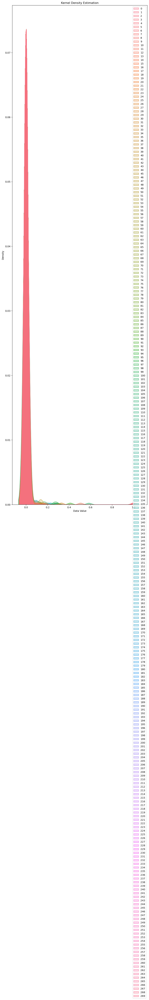

In [15]:
plt.figure(figsize=(10, 37))
sns.kdeplot(rbf, fill=True)
plt.title('Kernel Density Estimation')
plt.xlabel('Data Value')
plt.ylabel('Density')
plt.show()

#### Kernel RBF untuk Multiclass Ngelegena

In [16]:
sigma_ngelegena = 2

def ngelegena(array_ngelegena):
    array_rbf = np.zeros((len(array_ngelegena), len(array_ngelegena)))
    for i in range (len(array_rbf)):
        for j in range (len(array_rbf[i])):
            array_rbf[i, j] = math.exp(-(pow((array_ngelegena[i][0] - array_ngelegena[j][0]), 2)
                                        + pow((array_ngelegena[i][1] - array_ngelegena[j][1]), 2)
                                        + pow((array_ngelegena[i][2] - array_ngelegena[j][2]), 2)
                                        + pow((array_ngelegena[i][3] - array_ngelegena[j][3]), 2)
                                        + pow((array_ngelegena[i][4] - array_ngelegena[j][4]), 2)
                                        + pow((array_ngelegena[i][5] - array_ngelegena[j][5]), 2)
                                        + pow((array_ngelegena[i][6] - array_ngelegena[j][6]), 2)
                                        + pow((array_ngelegena[i][7] - array_ngelegena[j][7]), 2)
                                        + pow((array_ngelegena[i][8] - array_ngelegena[j][8]), 2)
                                        + pow((array_ngelegena[i][9] - array_ngelegena[j][9]), 2)
                                        + pow((array_ngelegena[i][10] - array_ngelegena[j][10]), 2)
                                        + pow((array_ngelegena[i][11] - array_ngelegena[j][11]), 2)) / (2 * pow(sigma_ngelegena, 2)))
    return array_rbf

rbf_ngelegena = ngelegena(array_ngelegena)
print(rbf_ngelegena)

[[1.00000000e+00 1.44691306e-33 3.42380605e-34 ... 3.13571499e-63
  1.02289088e-36 1.57117717e-10]
 [1.44691306e-33 1.00000000e+00 1.95403495e-26 ... 1.80633161e-30
  2.05216452e-28 4.35754427e-34]
 [3.42380605e-34 1.95403495e-26 1.00000000e+00 ... 4.91199104e-23
  1.59446910e-05 2.56410889e-61]
 ...
 [3.13571499e-63 1.80633161e-30 4.91199104e-23 ... 1.00000000e+00
  2.50707345e-14 4.00569132e-72]
 [1.02289088e-36 2.05216452e-28 1.59446910e-05 ... 2.50707345e-14
  1.00000000e+00 1.04867535e-57]
 [1.57117717e-10 4.35754427e-34 2.56410889e-61 ... 4.00569132e-72
  1.04867535e-57 1.00000000e+00]]


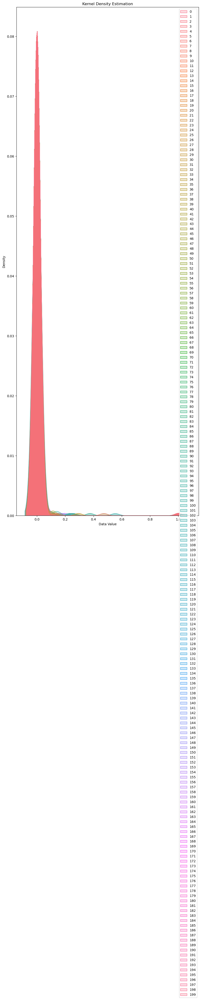

In [17]:
plt.figure(figsize=(10, 28))
sns.kdeplot(rbf_ngelegena, fill=True)
plt.title('Kernel Density Estimation')
plt.xlabel('Data Value')
plt.ylabel('Density')
plt.show()

#### Kernel RBF untuk Multiclass Murda

In [18]:
sigma_huruf = 3

def murda(array_murda):
    array_rbf = np.zeros((len(array_murda), len(array_murda)))
    for i in range (len(array_rbf)):
        for j in range (len(array_rbf[i])):
            array_rbf[i, j] = math.exp(-(pow((array_murda[i][0] - array_murda[j][0]), 2)
                                        + pow((array_murda[i][1] - array_murda[j][1]), 2)
                                        + pow((array_murda[i][2] - array_murda[j][2]), 2)
                                        + pow((array_murda[i][3] - array_murda[j][3]), 2)
                                        + pow((array_murda[i][4] - array_murda[j][4]), 2)
                                        + pow((array_murda[i][5] - array_murda[j][5]), 2)
                                        + pow((array_murda[i][6] - array_murda[j][6]), 2)
                                        + pow((array_murda[i][7] - array_murda[j][7]), 2)
                                        + pow((array_murda[i][8] - array_murda[j][8]), 2)
                                        + pow((array_murda[i][9] - array_murda[j][9]), 2)
                                        + pow((array_murda[i][10] - array_murda[j][10]), 2)
                                        + pow((array_murda[i][11] - array_murda[j][11]), 2)) / (2 * pow(sigma_huruf, 2)))
    return array_rbf

rbf_murda = murda(array_murda)
print(rbf_murda)

[[1.00000000e+00 1.09619646e-09 7.65669043e-04 ... 2.20543511e-16
  9.62845585e-28 3.72334768e-25]
 [1.09619646e-09 1.00000000e+00 3.67546182e-07 ... 2.69258606e-13
  9.46893146e-18 6.48874134e-22]
 [7.65669043e-04 3.67546182e-07 1.00000000e+00 ... 4.80668417e-21
  1.30309638e-30 1.36267527e-17]
 ...
 [2.20543511e-16 2.69258606e-13 4.80668417e-21 ... 1.00000000e+00
  3.91243648e-04 3.03024551e-19]
 [9.62845585e-28 9.46893146e-18 1.30309638e-30 ... 3.91243648e-04
  1.00000000e+00 2.29548711e-22]
 [3.72334768e-25 6.48874134e-22 1.36267527e-17 ... 3.03024551e-19
  2.29548711e-22 1.00000000e+00]]


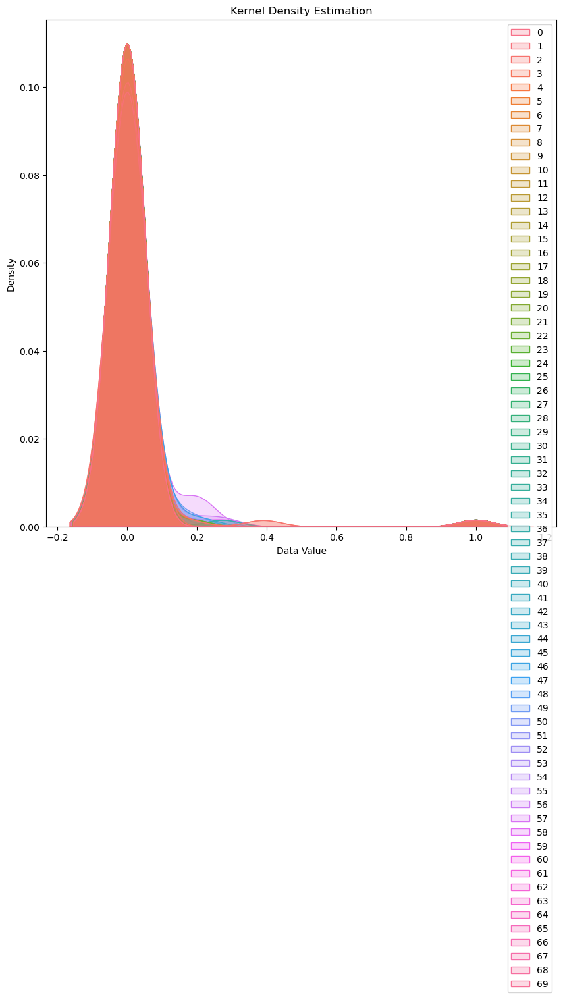

In [19]:
plt.figure(figsize=(10, 10))
sns.kdeplot(rbf_murda, fill=True)
plt.title('Kernel Density Estimation')
plt.xlabel('Data Value')
plt.ylabel('Density')
plt.show()

#### Matriks Hessian

In [20]:
hessian = np.zeros((len(rbf), len(rbf)))
hessian_ha = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_na = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_ca = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_ra = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_ka = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_da = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_ta = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_sa = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_wa = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_la = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_pa = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_dha = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_ja = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_ya = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_nya = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_ma = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_ga = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_ba = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_tha = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_nga = np.zeros((len(rbf_ngelegena), len(rbf_ngelegena)))
hessian_namurda = np.zeros((len(rbf_murda), len(rbf_murda)))
hessian_kamurda = np.zeros((len(rbf_murda), len(rbf_murda)))
hessian_tamurda = np.zeros((len(rbf_murda), len(rbf_murda)))
hessian_samurda = np.zeros((len(rbf_murda), len(rbf_murda)))
hessian_pamurda = np.zeros((len(rbf_murda), len(rbf_murda)))
hessian_gamurda = np.zeros((len(rbf_murda), len(rbf_murda)))
hessian_bamurda = np.zeros((len(rbf_murda), len(rbf_murda)))

In [21]:
lamda = 28

lamda_murda = 50

lamda_jenis = 20

for i in range(len(rbf)):
    for j in range(len(rbf)):
        hessian[i, j] = model[j][12] * model[i][12] * (rbf[i][j] + (pow(lamda_jenis, 2)))
        
for i in range(len(rbf_ngelegena)):
    for j in range(len(rbf_ngelegena)):
        hessian_ha[i, j] = model_ha[j][12] * model_ha[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_na[i, j] = model_na[j][12] * model_na[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_ca[i, j] = model_ca[j][12] * model_ca[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_ra[i, j] = model_ra[j][12] * model_ra[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_ka[i, j] = model_ka[j][12] * model_ka[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_da[i, j] = model_da[j][12] * model_da[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_ta[i, j] = model_ta[j][12] * model_ta[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))       
        hessian_sa[i, j] = model_sa[j][12] * model_sa[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_wa[i, j] = model_wa[j][12] * model_wa[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_la[i, j] = model_la[j][12] * model_la[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_pa[i, j] = model_pa[j][12] * model_pa[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_dha[i, j] = model_dha[j][12] * model_dha[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_ja[i, j] = model_ja[j][12] * model_ja[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_ya[i, j] = model_ya[j][12] * model_ya[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_nya[i, j] = model_nya[j][12] * model_nya[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_ma[i, j] = model_ma[j][12] * model_ma[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_ga[i, j] = model_ga[j][12] * model_ga[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_ba[i, j] = model_ba[j][12] * model_ba[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_tha[i, j] = model_tha[j][12] * model_tha[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        hessian_nga[i, j] = model_nga[j][12] * model_nga[i][12] * (rbf_ngelegena[i][j] + (pow(lamda, 2)))
        
for i in range(len(rbf_murda)):
    for j in range(len(rbf_murda)):
        hessian_namurda[i, j] = model_namurda[j][12] * model_namurda[i][12] * (rbf_murda[i][j] + (pow(lamda_murda, 2)))
        hessian_kamurda[i, j] = model_kamurda[j][12] * model_kamurda[i][12] * (rbf_murda[i][j] + (pow(lamda_murda, 2)))
        hessian_tamurda[i, j] = model_tamurda[j][12] * model_tamurda[i][12] * (rbf_murda[i][j] + (pow(lamda_murda, 2)))
        hessian_samurda[i, j] = model_samurda[j][12] * model_samurda[i][12] * (rbf_murda[i][j] + (pow(lamda_murda, 2)))  
        hessian_pamurda[i, j] = model_pamurda[j][12] * model_pamurda[i][12] * (rbf_murda[i][j] + (pow(lamda_murda, 2)))
        hessian_gamurda[i, j] = model_gamurda[j][12] * model_gamurda[i][12] * (rbf_murda[i][j] + (pow(lamda_murda, 2)))  
        hessian_bamurda[i, j] = model_bamurda[j][12] * model_bamurda[i][12] * (rbf_murda[i][j] + (pow(lamda_murda, 2)))  

print(hessian)

[[ 401.          400.          400.         ... -400.
  -400.         -400.        ]
 [ 400.          401.          400.         ... -400.
  -400.         -400.        ]
 [ 400.          400.          401.         ... -400.
  -400.         -400.        ]
 ...
 [-400.         -400.         -400.         ...  401.
   400.00000011  400.        ]
 [-400.         -400.         -400.         ...  400.00000011
   401.          400.        ]
 [-400.         -400.         -400.         ...  400.
   400.          401.        ]]


#### Mencari Nilai Ei, Delta Alpha dan Ai 

In [22]:
C_murda = 1
gamma_murda = 0.0001
epsilon_murda = 0.01

C = 1
gamma = 0.0001
epsilon = 0.01

C_jenis = 2
gamma_jenis = 0.0001
epsilon_jenis = 0.01

alpha = [0] * len(hessian)
delta_alpha = [0] * len(hessian)
temp_alpha = [0] * len(hessian)
ei = np.zeros(len(hessian))

alpha_ha = [0] * len(hessian_ha)
delta_alpha_ha = [0] * len(hessian_ha)
temp_alpha_ha = [0] * len(hessian_ha)
ei_ha = np.zeros(len(hessian_ha))

alpha_na = [0] * len(hessian_ha)
delta_alpha_na = [0] * len(hessian_ha)
temp_alpha_na = [0] * len(hessian_ha)
ei_na = np.zeros(len(hessian_ha))

alpha_ca = [0] * len(hessian_ha)
delta_alpha_ca = [0] * len(hessian_ha)
temp_alpha_ca = [0] * len(hessian_ha)
ei_ca = np.zeros(len(hessian_ha))

alpha_ra = [0] * len(hessian_ha)
delta_alpha_ra = [0] * len(hessian_ha)
temp_alpha_ra = [0] * len(hessian_ha)
ei_ra = np.zeros(len(hessian_ha))

alpha_ka = [0] * len(hessian_ha)
delta_alpha_ka = [0] * len(hessian_ha)
temp_alpha_ka = [0] * len(hessian_ha)
ei_ka = np.zeros(len(hessian_ha))

alpha_da = [0] * len(hessian_ha)
delta_alpha_da = [0] * len(hessian_ha)
temp_alpha_da = [0] * len(hessian_ha)
ei_da = np.zeros(len(hessian_ha))

alpha_ta = [0] * len(hessian_ha)
delta_alpha_ta = [0] * len(hessian_ha)
temp_alpha_ta = [0] * len(hessian_ha)
ei_ta = np.zeros(len(hessian_ha))

alpha_sa = [0] * len(hessian_ha)
delta_alpha_sa = [0] * len(hessian_ha)
temp_alpha_sa = [0] * len(hessian_ha)
ei_sa = np.zeros(len(hessian_ha))

alpha_wa = [0] * len(hessian_ha)
delta_alpha_wa = [0] * len(hessian_ha)
temp_alpha_wa = [0] * len(hessian_ha)
ei_wa = np.zeros(len(hessian_ha))

alpha_la = [0] * len(hessian_ha)
delta_alpha_la = [0] * len(hessian_ha)
temp_alpha_la = [0] * len(hessian_ha)
ei_la = np.zeros(len(hessian_ha))

alpha_pa = [0] * len(hessian_ha)
delta_alpha_pa = [0] * len(hessian_ha)
temp_alpha_pa = [0] * len(hessian_ha)
ei_pa = np.zeros(len(hessian_ha))

alpha_dha = [0] * len(hessian_ha)
delta_alpha_dha = [0] * len(hessian_ha)
temp_alpha_dha = [0] * len(hessian_ha)
ei_dha = np.zeros(len(hessian_ha))

alpha_ja = [0] * len(hessian_ha)
delta_alpha_ja = [0] * len(hessian_ha)
temp_alpha_ja = [0] * len(hessian_ha)
ei_ja = np.zeros(len(hessian_ha))

alpha_ya = [0] * len(hessian_ha)
delta_alpha_ya = [0] * len(hessian_ha)
temp_alpha_ya = [0] * len(hessian_ha)
ei_ya = np.zeros(len(hessian_ha))

alpha_nya = [0] * len(hessian_ha)
delta_alpha_nya = [0] * len(hessian_ha)
temp_alpha_nya = [0] * len(hessian_ha)
ei_nya = np.zeros(len(hessian_ha))

alpha_ma = [0] * len(hessian_ha)
delta_alpha_ma = [0] * len(hessian_ha)
temp_alpha_ma = [0] * len(hessian_ha)
ei_ma = np.zeros(len(hessian_ha))

alpha_ga = [0] * len(hessian_ha)
delta_alpha_ga = [0] * len(hessian_ha)
temp_alpha_ga = [0] * len(hessian_ha)
ei_ga = np.zeros(len(hessian_ha))

alpha_ba = [0] * len(hessian_ha)
delta_alpha_ba = [0] * len(hessian_ha)
temp_alpha_ba = [0] * len(hessian_ha)
ei_ba = np.zeros(len(hessian_ha))

alpha_tha = [0] * len(hessian_ha)
delta_alpha_tha = [0] * len(hessian_ha)
temp_alpha_tha = [0] * len(hessian_ha)
ei_tha = np.zeros(len(hessian_ha))

alpha_nga = [0] * len(hessian_ha)
delta_alpha_nga = [0] * len(hessian_ha)
temp_alpha_nga = [0] * len(hessian_ha)
ei_nga = np.zeros(len(hessian_ha))

alpha_namurda = [0] * len(hessian_namurda)
delta_alpha_namurda = [0] * len(hessian_namurda)
temp_alpha_namurda = [0] * len(hessian_namurda)
ei_namurda = np.zeros(len(hessian_namurda))

alpha_kamurda = [0] * len(hessian_namurda)
delta_alpha_kamurda = [0] * len(hessian_namurda)
temp_alpha_kamurda = [0] * len(hessian_namurda)
ei_kamurda = np.zeros(len(hessian_namurda))

alpha_tamurda = [0] * len(hessian_namurda)
delta_alpha_tamurda = [0] * len(hessian_namurda)
temp_alpha_tamurda = [0] * len(hessian_namurda)
ei_tamurda = np.zeros(len(hessian_namurda))

alpha_samurda = [0] * len(hessian_namurda)
delta_alpha_samurda = [0] * len(hessian_namurda)
temp_alpha_samurda = [0] * len(hessian_namurda)
ei_samurda = np.zeros(len(hessian_namurda))

alpha_pamurda = [0] * len(hessian_namurda)
delta_alpha_pamurda = [0] * len(hessian_namurda)
temp_alpha_pamurda = [0] * len(hessian_namurda)
ei_pamurda = np.zeros(len(hessian_namurda))

alpha_gamurda = [0] * len(hessian_namurda)
delta_alpha_gamurda = [0] * len(hessian_namurda)
temp_alpha_gamurda = [0] * len(hessian_namurda)
ei_gamurda = np.zeros(len(hessian_namurda))

alpha_bamurda = [0] * len(hessian_namurda)
delta_alpha_bamurda = [0] * len(hessian_namurda)
temp_alpha_bamurda = [0] * len(hessian_namurda)
ei_bamurda = np.zeros(len(hessian_namurda))

In [23]:
iterasi = 0

while iterasi < 20:
    if delta_alpha[iterasi] <= epsilon_jenis:
        for i in range(len(hessian)):
            for j in range(len(hessian)):
                ei[i] += (temp_alpha[j] * hessian[i][j])

            delta_alpha[i] = min(max((gamma_jenis * (1 - ei[i])), alpha[i]), C_jenis - alpha[i])
            alpha[i] = alpha[i] + delta_alpha[i]

        for i in range(len(alpha)):
            temp_alpha[i] = alpha[i]
        iterasi += 1
    else:
        break
        
while iterasi < 20:
    if delta_alpha_ha[iterasi] <= epsilon:
        for i in range(len(hessian_ha)):
            for j in range(len(hessian_ha)):
                ei_ha[i] += (temp_alpha_ha[j] * hessian_ha[i][j])

            delta_alpha_ha[i] = min(max((gamma * (1 - ei_ha[i])), alpha_ha[i]), C - alpha_ha[i])
            alpha_ha[i] = alpha_ha[i] + delta_alpha_ha[i]

        for i in range(len(alpha_ha)):
            temp_alpha_ha[i] = alpha_ha[i]
        iterasi += 1
    else:
        break

iterasi = 0
while iterasi < 20:
    if delta_alpha_na[iterasi] <= epsilon:
        for i in range(len(hessian_na)):
            for j in range(len(hessian_na)):
                ei_na[i] += (temp_alpha_na[j] * hessian_na[i][j])

            delta_alpha_na[i] = min(max((gamma * (1 - ei_na[i])), alpha_na[i]), C - alpha_na[i])
            alpha_na[i] = alpha_na[i] + delta_alpha_na[i]
        
        for i in range(len(alpha_na)):
            temp_alpha_na[i] = alpha_na[i]
        iterasi += 1
    else:
        break
    
iterasi = 0
while iterasi < 20:
    if delta_alpha_ca[iterasi] <= epsilon:
        for i in range(len(hessian_ca)):
            for j in range(len(hessian_ca)):
                ei_ca[i] += (temp_alpha_ca[j] * hessian_ca[i][j])

            delta_alpha_ca[i] = min(max((gamma * (1 - ei_ca[i])), alpha_ca[i]), C - alpha_ca[i])
            alpha_ca[i] = alpha_ca[i] + delta_alpha_ca[i]
        
        for i in range(len(alpha_ca)):
            temp_alpha_ca[i] = alpha_ca[i]
        iterasi += 1
    else:
        break

iterasi = 0
while iterasi < 20:
    if delta_alpha_ra[iterasi] <= epsilon:
        for i in range(len(hessian_ra)):
            for j in range(len(hessian_ra)):
                ei_ra[i] += (temp_alpha_ra[j] * hessian_ra[i][j])

            delta_alpha_ra[i] = min(max((gamma * (1 - ei_ra[i])), alpha_ra[i]), C - alpha_ra[i])
            alpha_ra[i] = alpha_ra[i] + delta_alpha_ra[i]

        for i in range(len(alpha_ra)):
            temp_alpha_ra[i] = alpha_ra[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_ka[iterasi] <= epsilon:
        for i in range(len(hessian_ka)):
            for j in range(len(hessian_ka)):
                ei_ka[i] += (temp_alpha_ka[j] * hessian_ka[i][j])

            delta_alpha_ka[i] = min(max((gamma * (1 - ei_ka[i])), alpha_ka[i]), C - alpha_ka[i])
            alpha_ka[i] = alpha_ka[i] + delta_alpha_ka[i]

        for i in range(len(alpha_ka)):
            temp_alpha_ka[i] = alpha_ka[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_da[iterasi] <= epsilon:
        for i in range(len(hessian_da)):
            for j in range(len(hessian_da)):
                ei_da[i] += (temp_alpha_da[j] * hessian_da[i][j])

            delta_alpha_da[i] = min(max((gamma * (1 - ei_da[i])), alpha_da[i]), C - alpha_da[i])
            alpha_da[i] = alpha_da[i] + delta_alpha_da[i]

        for i in range(len(alpha_da)):
            temp_alpha_da[i] = alpha_da[i]
        iterasi += 1
    else:
        break

iterasi = 0
while iterasi < 20:
    if delta_alpha_ta[iterasi] <= epsilon:
        for i in range(len(hessian_ta)):
            for j in range(len(hessian_ta)):
                ei_ta[i] += (temp_alpha_ta[j] * hessian_ta[i][j])

            delta_alpha_ta[i] = min(max((gamma * (1 - ei_ta[i])), alpha_ta[i]), C - alpha_ta[i])
            alpha_ta[i] = alpha_ta[i] + delta_alpha_ta[i]

        for i in range(len(alpha_ta)):
            temp_alpha_ta[i] = alpha_ta[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_sa[iterasi] <= epsilon:
        for i in range(len(hessian_sa)):
            for j in range(len(hessian_sa)):
                ei_sa[i] += (temp_alpha_sa[j] * hessian_sa[i][j])

            delta_alpha_sa[i] = min(max((gamma * (1 - ei_sa[i])), alpha_sa[i]), C - alpha_sa[i])
            alpha_sa[i] = alpha_sa[i] + delta_alpha_sa[i]

        for i in range(len(alpha_sa)):
            temp_alpha_sa[i] = alpha_sa[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_wa[iterasi] <= epsilon:
        for i in range(len(hessian_wa)):
            for j in range(len(hessian_wa)):
                ei_wa[i] += (temp_alpha_wa[j] * hessian_wa[i][j])

            delta_alpha_wa[i] = min(max((gamma * (1 - ei_wa[i])), alpha_wa[i]), C - alpha_wa[i])
            alpha_wa[i] = alpha_wa[i] + delta_alpha_wa[i]

        for i in range(len(alpha_wa)):
            temp_alpha_wa[i] = alpha_wa[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_la[iterasi] <= epsilon:
        for i in range(len(hessian_la)):
            for j in range(len(hessian_la)):
                ei_la[i] += (temp_alpha_la[j] * hessian_la[i][j])

            delta_alpha_la[i] = min(max((gamma * (1 - ei_la[i])), alpha_la[i]), C - alpha_la[i])
            alpha_la[i] = alpha_la[i] + delta_alpha_la[i]

        for i in range(len(alpha_la)):
            temp_alpha_la[i] = alpha_la[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_pa[iterasi] <= epsilon:
        for i in range(len(hessian_pa)):
            for j in range(len(hessian_pa)):
                ei_pa[i] += (temp_alpha_pa[j] * hessian_pa[i][j])

            delta_alpha_pa[i] = min(max((gamma * (1 - ei_pa[i])), alpha_pa[i]), C - alpha_pa[i])
            alpha_pa[i] = alpha_pa[i] + delta_alpha_pa[i]

        for i in range(len(alpha_pa)):
            temp_alpha_pa[i] = alpha_pa[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_dha[iterasi] <= epsilon:
        for i in range(len(hessian_dha)):
            for j in range(len(hessian_dha)):
                ei_dha[i] += (temp_alpha_dha[j] * hessian_dha[i][j])

            delta_alpha_dha[i] = min(max((gamma * (1 - ei_dha[i])), alpha_dha[i]), C - alpha_dha[i])
            alpha_dha[i] = alpha_dha[i] + delta_alpha_dha[i]

        for i in range(len(alpha_dha)):
            temp_alpha_dha[i] = alpha_dha[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_ja[iterasi] <= epsilon:
        for i in range(len(hessian_ja)):
            for j in range(len(hessian_ja)):
                ei_ja[i] += (temp_alpha_ja[j] * hessian_ja[i][j])

            delta_alpha_ja[i] = min(max((gamma * (1 - ei_ja[i])), alpha_ja[i]), C - alpha_ja[i])
            alpha_ja[i] = alpha_ja[i] + delta_alpha_ja[i]

        for i in range(len(alpha_ja)):
            temp_alpha_ja[i] = alpha_ja[i]
        iterasi += 1
    else:
        break

iterasi = 0
while iterasi < 20:
    if delta_alpha_ya[iterasi] <= epsilon:
        for i in range(len(hessian_ya)):
            for j in range(len(hessian_ya)):
                ei_ya[i] += (temp_alpha_ya[j] * hessian_ya[i][j])

            delta_alpha_ya[i] = min(max((gamma * (1 - ei_ya[i])), alpha_ya[i]), C - alpha_ya[i])
            alpha_ya[i] = alpha_ya[i] + delta_alpha_ya[i]

        for i in range(len(alpha_ya)):
            temp_alpha_ya[i] = alpha_ya[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_nya[iterasi] <= epsilon:
        for i in range(len(hessian_nya)):
            for j in range(len(hessian_nya)):
                ei_nya[i] += (temp_alpha_nya[j] * hessian_nya[i][j])

            delta_alpha_nya[i] = min(max((gamma * (1 - ei_nya[i])), alpha_nya[i]), C - alpha_nya[i])
            alpha_nya[i] = alpha_nya[i] + delta_alpha_nya[i]

        for i in range(len(alpha_nya)):
            temp_alpha_nya[i] = alpha_nya[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_ma[iterasi] <= epsilon:
        for i in range(len(hessian_ma)):
            for j in range(len(hessian_ma)):
                ei_ma[i] += (temp_alpha_ma[j] * hessian_ma[i][j])

            delta_alpha_ma[i] = min(max((gamma * (1 - ei_ma[i])), alpha_ma[i]), C - alpha_ma[i])
            alpha_ma[i] = alpha_ma[i] + delta_alpha_ma[i]

        for i in range(len(alpha_ma)):
            temp_alpha_ma[i] = alpha_ma[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_ga[iterasi] <= epsilon:
        for i in range(len(hessian_ga)):
            for j in range(len(hessian_ga)):
                ei_ga[i] += (temp_alpha_ga[j] * hessian_ga[i][j])

            delta_alpha_ga[i] = min(max((gamma * (1 - ei_ga[i])), alpha_ga[i]), C - alpha_ga[i])
            alpha_ga[i] = alpha_ga[i] + delta_alpha_ga[i]

        for i in range(len(alpha_ga)):
            temp_alpha_ga[i] = alpha_ga[i]
        iterasi += 1
    else:
        break
    
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_ba[iterasi] <= epsilon:
        for i in range(len(hessian_ba)):
            for j in range(len(hessian_ba)):
                ei_ba[i] += (temp_alpha_ba[j] * hessian_ba[i][j])

            delta_alpha_ba[i] = min(max((gamma * (1 - ei_ba[i])), alpha_ba[i]), C - alpha_ba[i])
            alpha_ba[i] = alpha_ba[i] + delta_alpha_ba[i]

        for i in range(len(alpha_ba)):
            temp_alpha_ba[i] = alpha_ba[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_tha[iterasi] <= epsilon:
        for i in range(len(hessian_tha)):
            for j in range(len(hessian_tha)):
                ei_tha[i] += (temp_alpha_tha[j] * hessian_tha[i][j])

            delta_alpha_tha[i] = min(max((gamma * (1 - ei_tha[i])), alpha_tha[i]), C - alpha_tha[i])
            alpha_tha[i] = alpha_tha[i] + delta_alpha_tha[i]

        for i in range(len(alpha_tha)):
            temp_alpha_tha[i] = alpha_tha[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_nga[iterasi] <= epsilon:
        for i in range(len(hessian_nga)):
            for j in range(len(hessian_nga)):
                ei_nga[i] += (temp_alpha_nga[j] * hessian_nga[i][j])

            delta_alpha_nga[i] = min(max((gamma * (1 - ei_nga[i])), alpha_nga[i]), C - alpha_nga[i])
            alpha_nga[i] = alpha_nga[i] + delta_alpha_nga[i]

        for i in range(len(alpha_nga)):
            temp_alpha_nga[i] = alpha_nga[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_namurda[iterasi] <= epsilon_murda:
        for i in range(len(hessian_namurda)):
            for j in range(len(hessian_namurda)):
                ei_namurda[i] += (temp_alpha_namurda[j] * hessian_namurda[i][j])

            delta_alpha_namurda[i] = min(max((gamma_murda * (1 - ei_namurda[i])), alpha_namurda[i]), C_murda - alpha_namurda[i])
            alpha_namurda[i] = alpha_namurda[i] + delta_alpha_namurda[i]

        for i in range(len(alpha_namurda)):
            temp_alpha_namurda[i] = alpha_namurda[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_kamurda[iterasi] <= epsilon_murda:
        for i in range(len(hessian_kamurda)):
            for j in range(len(hessian_kamurda)):
                ei_kamurda[i] += (temp_alpha_kamurda[j] * hessian_kamurda[i][j])

            delta_alpha_kamurda[i] = min(max((gamma_murda * (1 - ei_kamurda[i])), alpha_kamurda[i]), C_murda - alpha_kamurda[i])
            alpha_kamurda[i] = alpha_kamurda[i] + delta_alpha_kamurda[i]

        for i in range(len(alpha_kamurda)):
            temp_alpha_kamurda[i] = alpha_kamurda[i]
        iterasi += 1
    else:
        break
    
iterasi = 0
while iterasi < 20:
    if delta_alpha_tamurda[iterasi] <= epsilon_murda:
        for i in range(len(hessian_tamurda)):
            for j in range(len(hessian_tamurda)):
                ei_tamurda[i] += (temp_alpha_tamurda[j] * hessian_tamurda[i][j])

            delta_alpha_tamurda[i] = min(max((gamma_murda * (1 - ei_tamurda[i])), alpha_tamurda[i]), C_murda - alpha_tamurda[i])
            alpha_tamurda[i] = alpha_tamurda[i] + delta_alpha_tamurda[i]

        for i in range(len(alpha_tamurda)):
            temp_alpha_tamurda[i] = alpha_tamurda[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_samurda[iterasi] <= epsilon_murda:
        for i in range(len(hessian_samurda)):
            for j in range(len(hessian_samurda)):
                ei_samurda[i] += (temp_alpha_samurda[j] * hessian_samurda[i][j])

            delta_alpha_samurda[i] = min(max((gamma_murda * (1 - ei_samurda[i])), alpha_samurda[i]), C_murda - alpha_samurda[i])
            alpha_samurda[i] = alpha_samurda[i] + delta_alpha_samurda[i]

        for i in range(len(alpha_samurda)):
            temp_alpha_samurda[i] = alpha_samurda[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_pamurda[iterasi] <= epsilon_murda:
        for i in range(len(hessian_pamurda)):
            for j in range(len(hessian_pamurda)):
                ei_pamurda[i] += (temp_alpha_pamurda[j] * hessian_pamurda[i][j])

            delta_alpha_pamurda[i] = min(max((gamma_murda * (1 - ei_pamurda[i])), alpha_pamurda[i]), C_murda - alpha_pamurda[i])
            alpha_pamurda[i] = alpha_pamurda[i] + delta_alpha_pamurda[i]

        for i in range(len(alpha_pamurda)):
            temp_alpha_pamurda[i] = alpha_pamurda[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_gamurda[iterasi] <= epsilon_murda:
        for i in range(len(hessian_gamurda)):
            for j in range(len(hessian_gamurda)):
                ei_gamurda[i] += (temp_alpha_gamurda[j] * hessian_gamurda[i][j])

            delta_alpha_gamurda[i] = min(max((gamma_murda * (1 - ei_gamurda[i])), alpha_gamurda[i]), C_murda - alpha_gamurda[i])
            alpha_gamurda[i]  = alpha_gamurda[i] + delta_alpha_gamurda[i]

        for i in range(len(alpha_gamurda)):
            temp_alpha_gamurda[i] = alpha_gamurda[i]
        iterasi += 1
    else:
        break
        
iterasi = 0
while iterasi < 20:
    if delta_alpha_bamurda[iterasi] <= epsilon_murda:
        for i in range(len(hessian_bamurda)):
            for j in range(len(hessian_bamurda)):
                ei_bamurda[i] += (temp_alpha_bamurda[j] * hessian_bamurda[i][j])

            delta_alpha_bamurda[i] = min(max((gamma_murda * (1 - ei_bamurda[i])), alpha_bamurda[i]), C_murda - alpha_bamurda[i])
            alpha_bamurda[i] = alpha_bamurda[i] + delta_alpha_bamurda[i]

        for i in range(len(alpha_bamurda)):
            temp_alpha_bamurda[i] = alpha_bamurda[i]
        iterasi += 1
    else:
        break

print("Ei BINARY \n", ei, "\n")
print("Ai BINARY \n", alpha, "\n")
print("DELTA ALPHA BINARY \n", delta_alpha, "\n")
print("Ei HA \n", ei_ha, "\n")
print("Ai HA \n", alpha_ha, "\n")
print("DELTA ALPHA HA \n", delta_alpha_ha, "\n")
print("Ei NA MURDA \n", ei_namurda, "\n")
print("Ai NA MURDA \n", alpha_namurda, "\n")
print("DELTA ALPHA NA MURDA \n", delta_alpha_namurda)

Ei BINARY 
 [ 465.73513734  465.74564497  465.73579438  465.73570705  465.7351949
  465.73514418  465.75562165  465.73524633  465.73513712  465.73513711
  465.73574439  465.73188955  465.73577979  465.73513612  465.73570357
  465.73569346  465.73513778  465.73564364  465.74093883  465.74243821
  465.73514138  465.73536335  465.73514415  465.73514378  465.7351381
  465.7350899   465.7353912   465.73531861  465.73516679  465.73528941
  465.73502985  465.73522688  465.74818134  465.73200484  465.7458033
  465.73513711  465.7377656   465.7519084   465.73519976  465.73771938
  465.73807102  465.73513711  465.73665736  465.73809402  465.73514149
  465.73513896  465.73367926  465.73548302  465.73513711  465.73513711
  465.73517208  465.73517075  465.73513778  465.7351657   465.73513714
  465.73519158  465.73513883  465.73526487  465.73530527  465.7350807
  465.73515703  465.73515291  465.73638955  465.73019914  465.73519255
  465.73521206  465.75849811  465.7351371   465.7351449   465.7374354

#### Mencari Nilai Bobot Max Positif dan Max Negatif dari Array Ai

In [24]:
positif = [0] * len(model)
negatif = [0] * len(model)

positif_ha = [0] * len(model_ha)
negatif_ha = [0] * len(model_ha)
positif_na = [0] * len(model_ha)
negatif_na = [0] * len(model_ha)
positif_ca = [0] * len(model_ha)
negatif_ca = [0] * len(model_ha)
positif_ra = [0] * len(model_ha)
negatif_ra = [0] * len(model_ha)
positif_ka = [0] * len(model_ha)
negatif_ka = [0] * len(model_ha)
positif_da = [0] * len(model_ha)
negatif_da = [0] * len(model_ha)
positif_ta = [0] * len(model_ha)
negatif_ta = [0] * len(model_ha)
positif_sa = [0] * len(model_ha)
negatif_sa = [0] * len(model_ha)
positif_wa = [0] * len(model_ha)
negatif_wa = [0] * len(model_ha)
positif_la = [0] * len(model_ha)
negatif_la = [0] * len(model_ha)
positif_pa = [0] * len(model_ha)
negatif_pa = [0] * len(model_ha)
positif_dha = [0] * len(model_ha)
negatif_dha = [0] * len(model_ha)
positif_ja = [0] * len(model_ha)
negatif_ja = [0] * len(model_ha)
positif_ya = [0] * len(model_ha)
negatif_ya = [0] * len(model_ha)
positif_nya = [0] * len(model_ha)
negatif_nya = [0] * len(model_ha)
positif_ma = [0] * len(model_ha)
negatif_ma = [0] * len(model_ha)
positif_ga = [0] * len(model_ha)
negatif_ga = [0] * len(model_ha)
positif_ba = [0] * len(model_ha)
negatif_ba = [0] * len(model_ha)
positif_tha = [0] * len(model_ha)
negatif_tha = [0] * len(model_ha)
positif_nga = [0] * len(model_ha)
negatif_nga = [0] * len(model_ha)

positif_namurda = [0] * len(model_namurda)
negatif_namurda = [0] * len(model_namurda)
positif_kamurda = [0] * len(model_namurda)
negatif_kamurda = [0] * len(model_namurda)
positif_tamurda = [0] * len(model_namurda)
negatif_tamurda = [0] * len(model_namurda)
positif_samurda = [0] * len(model_namurda)
negatif_samurda = [0] * len(model_namurda)
positif_pamurda = [0] * len(model_namurda)
negatif_pamurda = [0] * len(model_namurda)
positif_gamurda = [0] * len(model_namurda)
negatif_gamurda = [0] * len(model_namurda)
positif_bamurda = [0] * len(model_namurda)
negatif_bamurda = [0] * len(model_namurda)

In [25]:
for i in range(len(model)):
    if model[i][12] == 1:
        positif[i] = alpha[i]
    else :
        negatif[i] = alpha[i]

for i in range(len(model_ha)):
    if model_ha[i][12] == 1:
        positif_ha[i] = alpha_ha[i]
    else :
        negatif_ha[i] = alpha_ha[i]
        
for i in range(len(model_ha)):
    if model_na[i][12] == 1:
        positif_na[i] = alpha_na[i]
    else :
        negatif_na[i] = alpha_na[i]
        
for i in range(len(model_ha)):
    if model_ca[i][12] == 1:
        positif_ca[i] = alpha_ca[i]
    else :
        negatif_ca[i] = alpha_ca[i]
        
for i in range(len(model_ha)):
    if model_ra[i][12] == 1:
        positif_ra[i] = alpha_ra[i]
    else :
        negatif_ra[i] = alpha_ra[i]
        
for i in range(len(model_ha)):
    if model_ka[i][12] == 1:
        positif_ka[i] = alpha_ka[i]
    else :
        negatif_ka[i] = alpha_ka[i]
        
for i in range(len(model_ha)):
    if model_da[i][12] == 1:
        positif_da[i] = alpha_da[i]
    else :
        negatif_da[i] = alpha_da[i]
        
for i in range(len(model_ha)):
    if model_ta[i][12] == 1:
        positif_ta[i] = alpha_ta[i]
    else :
        negatif_ta[i] = alpha_ta[i]
        
for i in range(len(model_ha)):
    if model_sa[i][12] == 1:
        positif_sa[i] = alpha_sa[i]
    else :
        negatif_sa[i] = alpha_sa[i]   
        
for i in range(len(model_ha)):
    if model_wa[i][12] == 1:
        positif_wa[i] = alpha_wa[i]
    else :
        negatif_wa[i] = alpha_wa[i]
        
for i in range(len(model_ha)):
    if model_la[i][12] == 1:
        positif_la[i] = alpha_la[i]
    else :
        negatif_la[i] = alpha_la[i]
        
for i in range(len(model_ha)):
    if model_pa[i][12] == 1:
        positif_pa[i] = alpha_pa[i]
    else :
        negatif_pa[i] = alpha_pa[i]
        
for i in range(len(model_ha)):
    if model_dha[i][12] == 1:
        positif_dha[i] = alpha_dha[i]
    else :
        negatif_dha[i] = alpha_dha[i]
        
for i in range(len(model_ha)):
    if model_ja[i][12] == 1:
        positif_ja[i] = alpha_ja[i]
    else :
        negatif_ja[i] = alpha_ja[i]
        
for i in range(len(model_ha)):
    if model_ya[i][12] == 1:
        positif_ya[i] = alpha_ya[i]
    else :
        negatif_ya[i] = alpha_ya[i]
        
for i in range(len(model_ha)):
    if model_nya[i][12] == 1:
        positif_nya[i] = alpha_nya[i]
    else :
        negatif_nya[i] = alpha_nya[i]
        
for i in range(len(model_ha)):
    if model_ma[i][12] == 1:
        positif_ma[i] = alpha_ma[i]
    else :
        negatif_ma[i] = alpha_ma[i]
        
for i in range(len(model_ha)):
    if model_ga[i][12] == 1:
        positif_ga[i] = alpha_ga[i]
    else :
        negatif_ga[i] = alpha_ga[i]
        
for i in range(len(model_ha)):
    if model_ba[i][12] == 1:
        positif_ba[i] = alpha_ba[i]
    else :
        negatif_ba[i] = alpha_ba[i]
        
for i in range(len(model_ha)):
    if model_tha[i][12] == 1:
        positif_tha[i] = alpha_tha[i]
    else :
        negatif_tha[i] = alpha_tha[i]
        
for i in range(len(model_ha)):
    if model_nga[i][12] == 1:
        positif_nga[i] = alpha_nga[i]
    else :
        negatif_nga[i] = alpha_nga[i]
        
for i in range(len(model_namurda)):
    if model_namurda[i][12] == 1:
        positif_namurda[i] = alpha_namurda[i]
    else :
        negatif_namurda[i] = alpha_namurda[i]
        
for i in range(len(model_namurda)):
    if model_kamurda[i][12] == 1:
        positif_kamurda[i] = alpha_kamurda[i]
    else :
        negatif_kamurda[i] = alpha_kamurda[i]
        
for i in range(len(model_namurda)):
    if model_tamurda[i][12] == 1:
        positif_tamurda[i] = alpha_tamurda[i]
    else :
        negatif_tamurda[i] = alpha_tamurda[i]
        
for i in range(len(model_namurda)):
    if model_samurda[i][12] == 1:
        positif_samurda[i] = alpha_samurda[i]
    else :
        negatif_samurda[i] = alpha_samurda[i]   
        
for i in range(len(model_namurda)):
    if model_pamurda[i][12] == 1:
        positif_pamurda[i] = alpha_pamurda[i]
    else :
        negatif_pamurda[i] = alpha_pamurda[i]
        
for i in range(len(model_namurda)):
    if model_gamurda[i][12] == 1:
        positif_gamurda[i] = alpha_gamurda[i]
    else :
        negatif_gamurda[i] = alpha_gamurda[i]
        
for i in range(len(model_namurda)):
    if model_bamurda[i][12] == 1:
        positif_bamurda[i] = alpha_bamurda[i]
    else :
        negatif_bamurda[i] = alpha_bamurda[i]
        
print("POSITIF \n", positif, "\n")
print("NEGATIF \n", negatif, "\n")
print("POSITIF HA \n", positif_ha, "\n")
print("NEGATIF HA \n", negatif_ha, "\n")
print("POSITIF NA MURDA \n", positif_namurda, "\n")
print("NEGATIF NA MURDA \n", negatif_namurda)

POSITIF 
 [0.039291067268021646, 0.039290478959596094, 0.039291029525485285, 0.03929103435047633, 0.0392910639417253, 0.039291068829858625, 0.039290011152035516, 0.03929106097084217, 0.03929106728034425, 0.03929106728140227, 0.039291032186588075, 0.03929131711081937, 0.03929103014069443, 0.039291067374690104, 0.039291034544821093, 0.03929103512975354, 0.039291067279135804, 0.039291038009290416, 0.03929073199669271, 0.03929064534775281, 0.0392910674041992, 0.039291054241829104, 0.039291066874530246, 0.03929106689571382, 0.03929106722400168, 0.039291070993082294, 0.03929105261400068, 0.03929105679210461, 0.03929106556583714, 0.03929105847990144, 0.039291078119083785, 0.039291062126946635, 0.0392903134373758, 0.03929135327142472, 0.03929045283763644, 0.039291067281332394, 0.039290915380495124, 0.03929009805363177, 0.03929106366034836, 0.039290918051131885, 0.0392908977297234, 0.039291067281251764, 0.03929097942572984, 0.03929089640091513, 0.039291067027966316, 0.03929106717410881, 0.03929

In [26]:
wxplus = max(positif)
wxmin = max(negatif)
indwxplus = positif.index(wxplus)
indwxmin = negatif.index(wxmin)

wxplus_ha = max(positif_ha)
wxmin_ha = max(negatif_ha)
indwxplus_ha = positif_ha.index(wxplus_ha)
indwxmin_ha = negatif_ha.index(wxmin_ha)

wxplus_na = max(positif_na)
wxmin_na = max(negatif_na)
indwxplus_na = positif_na.index(wxplus_na)
indwxmin_na = negatif_na.index(wxmin_na)

wxplus_ca = max(positif_ca)
wxmin_ca = max(negatif_ca)
indwxplus_ca = positif_ca.index(wxplus_ca)
indwxmin_ca = negatif_ca.index(wxmin_ca)

wxplus_ra = max(positif_ra)
wxmin_ra = max(negatif_ra)
indwxplus_ra = positif_ra.index(wxplus_ra)
indwxmin_ra = negatif_ra.index(wxmin_ra)

wxplus_ka = max(positif_ka)
wxmin_ka = max(negatif_ka)
indwxplus_ka = positif_ka.index(wxplus_ka)
indwxmin_ka = negatif_ka.index(wxmin_ka)

wxplus_da = max(positif_da)
wxmin_da = max(negatif_da)
indwxplus_da = positif_da.index(wxplus_da)
indwxmin_da = negatif_da.index(wxmin_da)

wxplus_ta = max(positif_ta)
wxmin_ta = max(negatif_ta)
indwxplus_ta = positif_ta.index(wxplus_ta)
indwxmin_ta = negatif_ta.index(wxmin_ta)

wxplus_sa = max(positif_sa)
wxmin_sa = max(negatif_sa)
indwxplus_sa = positif_sa.index(wxplus_sa)
indwxmin_sa = negatif_sa.index(wxmin_sa)

wxplus_wa = max(positif_wa)
wxmin_wa = max(negatif_wa)
indwxplus_wa = positif_wa.index(wxplus_wa)
indwxmin_wa = negatif_wa.index(wxmin_wa)

wxplus_la = max(positif_la)
wxmin_la = max(negatif_la)
indwxplus_la = positif_la.index(wxplus_la)
indwxmin_la = negatif_la.index(wxmin_la)

wxplus_pa = max(positif_pa)
wxmin_pa = max(negatif_pa)
indwxplus_pa = positif_pa.index(wxplus_pa)
indwxmin_pa = negatif_pa.index(wxmin_pa)

wxplus_dha = max(positif_dha)
wxmin_dha = max(negatif_dha)
indwxplus_dha = positif_dha.index(wxplus_dha)
indwxmin_dha = negatif_dha.index(wxmin_dha)

wxplus_ja = max(positif_ja)
wxmin_ja = max(negatif_ja)
indwxplus_ja = positif_ja.index(wxplus_ja)
indwxmin_ja = negatif_ja.index(wxmin_ja)

wxplus_ya = max(positif_ya)
wxmin_ya = max(negatif_ya)
indwxplus_ya = positif_ya.index(wxplus_ya)
indwxmin_ya = negatif_ya.index(wxmin_ya)

wxplus_nya = max(positif_nya)
wxmin_nya = max(negatif_nya)
indwxplus_nya = positif_nya.index(wxplus_nya)
indwxmin_nya = negatif_nya.index(wxmin_nya)

wxplus_ma = max(positif_ma)
wxmin_ma = max(negatif_ma)
indwxplus_ma = positif_ma.index(wxplus_ma)
indwxmin_ma = negatif_ma.index(wxmin_ma)

wxplus_ga = max(positif_ga)
wxmin_ga = max(negatif_ga)
indwxplus_ga = positif_ga.index(wxplus_ga)
indwxmin_ga = negatif_ga.index(wxmin_ga)

wxplus_ba = max(positif_ba)
wxmin_ba = max(negatif_ba)
indwxplus_ba = positif_ba.index(wxplus_ba)
indwxmin_ba = negatif_ba.index(wxmin_ba)

wxplus_tha = max(positif_tha)
wxmin_tha = max(negatif_tha)
indwxplus_tha = positif_tha.index(wxplus_tha)
indwxmin_tha = negatif_tha.index(wxmin_tha)

wxplus_nga = max(positif_nga)
wxmin_nga = max(negatif_nga)
indwxplus_nga = positif_nga.index(wxplus_nga)
indwxmin_nga = negatif_nga.index(wxmin_nga)

wxplus_namurda = max(positif_namurda)
wxmin_namurda = max(negatif_namurda)
indwxplus_namurda = positif_namurda.index(wxplus_namurda)
indwxmin_namurda = negatif_namurda.index(wxmin_namurda)

wxplus_kamurda = max(positif_kamurda)
wxmin_kamurda = max(negatif_kamurda)
indwxplus_kamurda = positif_kamurda.index(wxplus_kamurda)
indwxmin_kamurda = negatif_kamurda.index(wxmin_kamurda)

wxplus_tamurda = max(positif_tamurda)
wxmin_tamurda = max(negatif_tamurda)
indwxplus_tamurda = positif_tamurda.index(wxplus_tamurda)
indwxmin_tamurda = negatif_tamurda.index(wxmin_tamurda)

wxplus_samurda = max(positif_samurda)
wxmin_samurda = max(negatif_samurda)
indwxplus_samurda = positif_samurda.index(wxplus_samurda)
indwxmin_samurda = negatif_samurda.index(wxmin_samurda)

wxplus_pamurda = max(positif_pamurda)
wxmin_pamurda = max(negatif_pamurda)
indwxplus_pamurda = positif_pamurda.index(wxplus_pamurda)
indwxmin_pamurda = negatif_pamurda.index(wxmin_pamurda)

wxplus_gamurda = max(positif_gamurda)
wxmin_gamurda = max(negatif_gamurda)
indwxplus_gamurda = positif_gamurda.index(wxplus_gamurda)
indwxmin_gamurda = negatif_gamurda.index(wxmin_gamurda)

wxplus_bamurda = max(positif_bamurda)
wxmin_bamurda = max(negatif_bamurda)
indwxplus_bamurda = positif_bamurda.index(wxplus_bamurda)
indwxmin_bamurda = negatif_bamurda.index(wxmin_bamurda)

print("Index : ", indwxplus, " , Bobot Max Positif : ", wxplus, "\n")
print("Index : ", indwxmin, " , Bobot Max Negatif : ", wxmin, "\n")
print("Index Ha : ", indwxplus_ha, " , Bobot Max Positif Ha : ", wxplus_ha, "\n")
print("Index Ha : ", indwxmin_ha, " , Bobot Max Negatif Ha : ", wxmin_ha, "\n")
print("Index Na Murda : ", indwxplus_namurda, " , Bobot Max Positif Na Murda : ", wxplus_namurda, "\n")
print("Index Na Murda : ", indwxmin_namurda, " , Bobot Max Negatif Na Murda : ", wxmin_namurda)

Index :  96  , Bobot Max Positif :  0.039292644901718056 

Index :  256  , Bobot Max Negatif :  0.09699763018654711 

Index Ha :  6  , Bobot Max Positif Ha :  0.3273631309501042 

Index Ha :  10  , Bobot Max Negatif Ha :  0.0256 

Index Na Murda :  6  , Bobot Max Positif Na Murda :  0.023199840667805657 

Index Na Murda :  32  , Bobot Max Negatif Na Murda :  0.004499457014793444


#### Mencari Nilai Kernel Positif dan Negatif berdasarkan Index

In [27]:
indrbfplus = rbf[indwxplus]
indrbfmin = rbf[indwxmin]

indrbfplus_ha = rbf[indwxplus_ha]
indrbfmin_ha = rbf[indwxmin_ha]

indrbfplus_na = rbf[indwxplus_na]
indrbfmin_na = rbf[indwxmin_na]

indrbfplus_ca = rbf[indwxplus_ca]
indrbfmin_ca = rbf[indwxmin_ca]

indrbfplus_ra = rbf[indwxplus_ra]
indrbfmin_ra = rbf[indwxmin_ra]

indrbfplus_ka = rbf[indwxplus_ka]
indrbfmin_ka = rbf[indwxmin_ka]

indrbfplus_da = rbf[indwxplus_da]
indrbfmin_da = rbf[indwxmin_da]

indrbfplus_ta = rbf[indwxplus_ta]
indrbfmin_ta = rbf[indwxmin_ta]

indrbfplus_sa = rbf[indwxplus_sa]
indrbfmin_sa = rbf[indwxmin_sa]

indrbfplus_wa = rbf[indwxplus_wa]
indrbfmin_wa = rbf[indwxmin_wa]

indrbfplus_la = rbf[indwxplus_la]
indrbfmin_la = rbf[indwxmin_la]

indrbfplus_pa = rbf[indwxplus_pa]
indrbfmin_pa = rbf[indwxmin_pa]

indrbfplus_dha = rbf[indwxplus_dha]
indrbfmin_dha = rbf[indwxmin_dha]

indrbfplus_ja = rbf[indwxplus_ja]
indrbfmin_ja = rbf[indwxmin_ja]

indrbfplus_ya = rbf[indwxplus_ya]
indrbfmin_ya = rbf[indwxmin_ya]

indrbfplus_nya = rbf[indwxplus_nya]
indrbfmin_nya = rbf[indwxmin_nya]

indrbfplus_ma = rbf[indwxplus_ma]
indrbfmin_ma = rbf[indwxmin_ma]

indrbfplus_ga = rbf[indwxplus_ga]
indrbfmin_ga = rbf[indwxmin_ga]

indrbfplus_ba = rbf[indwxplus_ba]
indrbfmin_ba = rbf[indwxmin_ba]

indrbfplus_tha = rbf[indwxplus_tha]
indrbfmin_tha = rbf[indwxmin_tha]

indrbfplus_nga = rbf[indwxplus_nga]
indrbfmin_nga = rbf[indwxmin_nga]

indrbfplus_namurda = rbf[indwxplus_namurda]
indrbfmin_namurda = rbf[indwxmin_namurda]

indrbfplus_kamurda = rbf[indwxplus_kamurda]
indrbfmin_kamurda = rbf[indwxmin_kamurda]

indrbfplus_tamurda = rbf[indwxplus_tamurda]
indrbfmin_tamurda = rbf[indwxmin_tamurda]

indrbfplus_samurda = rbf[indwxplus_samurda]
indrbfmin_samurda = rbf[indwxmin_samurda]

indrbfplus_pamurda = rbf[indwxplus_pamurda]
indrbfmin_pamurda = rbf[indwxmin_pamurda]

indrbfplus_gamurda = rbf[indwxplus_gamurda]
indrbfmin_gamurda = rbf[indwxmin_gamurda]

indrbfplus_bamurda = rbf[indwxplus_bamurda]
indrbfmin_bamurda = rbf[indwxmin_bamurda]

print(indrbfplus)
print(indrbfmin)

[0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 0.00000000e+000 1.00724927e-001 0.00000000e+000
 0.00000000e+000 8.63853560e-109 0.00000000e+000 0.00000000e+000
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 2.52908298e-006 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 3.34366662e-235 5.29294888e-005 0.00000000e+000
 0.00000000e+000 0.00000000e+000 1.53889578e-309 0.00000000e+000
 9.88131292e-323 1.59583204e-321 0.00000000e+000 5.16646909e-292
 1.75981641e-221 0.00000000e+000 1.83488040e-234 4.06961084e-221
 0.00000000e+000 0.00000000e+000 3.40241664e-243 0.00000000e+000
 0.00000000e+000 0.00000000e+000 1.39972298e-001 7.97022345e-241
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 0.00000000e+000 0.00000000e+000 0.00000000e+000
 0.00000000e+000 5.968377

In [28]:
h_wxplus = [0] * len(model)
h_wxmin = [0] * len(model)

h_wxplus_ha = [0] * len(model_ha)
h_wxmin_ha = [0] * len(model_ha)
h_wxplus_na = [0] * len(model_ha)
h_wxmin_na = [0] * len(model_ha)
h_wxplus_ca = [0] * len(model_ha)
h_wxmin_ca = [0] * len(model_ha)
h_wxplus_ra = [0] * len(model_ha)
h_wxmin_ra = [0] * len(model_ha)
h_wxplus_ka = [0] * len(model_ha)
h_wxmin_ka = [0] * len(model_ha)
h_wxplus_da = [0] * len(model_ha)
h_wxmin_da = [0] * len(model_ha)
h_wxplus_ta = [0] * len(model_ha)
h_wxmin_ta = [0] * len(model_ha)
h_wxplus_sa = [0] * len(model_ha)
h_wxmin_sa = [0] * len(model_ha)
h_wxplus_wa = [0] * len(model_ha)
h_wxmin_wa = [0] * len(model_ha)
h_wxplus_la = [0] * len(model_ha)
h_wxmin_la = [0] * len(model_ha)
h_wxplus_pa = [0] * len(model_ha)
h_wxmin_pa = [0] * len(model_ha)
h_wxplus_dha = [0] * len(model_ha)
h_wxmin_dha = [0] * len(model_ha)
h_wxplus_ja = [0] * len(model_ha)
h_wxmin_ja = [0] * len(model_ha)
h_wxplus_ya = [0] * len(model_ha)
h_wxmin_ya = [0] * len(model_ha)
h_wxplus_nya = [0] * len(model_ha)
h_wxmin_nya = [0] * len(model_ha)
h_wxplus_ma = [0] * len(model_ha)
h_wxmin_ma = [0] * len(model_ha)
h_wxplus_ga = [0] * len(model_ha)
h_wxmin_ga = [0] * len(model_ha)
h_wxplus_ba = [0] * len(model_ha)
h_wxmin_ba = [0] * len(model_ha)
h_wxplus_tha = [0] * len(model_ha)
h_wxmin_tha = [0] * len(model_ha)
h_wxplus_nga = [0] * len(model_ha)
h_wxmin_nga = [0] * len(model_ha)

h_wxplus_namurda = [0] * len(model_namurda)
h_wxmin_namurda = [0] * len(model_namurda)
h_wxplus_kamurda = [0] * len(model_namurda)
h_wxmin_kamurda = [0] * len(model_namurda)
h_wxplus_tamurda = [0] * len(model_namurda)
h_wxmin_tamurda = [0] * len(model_namurda)
h_wxplus_samurda = [0] * len(model_namurda)
h_wxmin_samurda = [0] * len(model_namurda)
h_wxplus_pamurda = [0] * len(model_namurda)
h_wxmin_pamurda = [0] * len(model_namurda)
h_wxplus_gamurda = [0] * len(model_namurda)
h_wxmin_gamurda = [0] * len(model_namurda)
h_wxplus_bamurda = [0] * len(model_namurda)
h_wxmin_bamurda = [0] * len(model_namurda)

In [29]:
for i in range(len(model)):
    h_wxplus[i] = alpha[i] * model[i][12] * indrbfplus[i]
    h_wxmin[i] = alpha[i] * model[i][12] * indrbfmin[i]

for i in range(len(model_ha)):
    h_wxplus_ha[i] = alpha_ha[i] * model_ha[i][12] * indrbfplus_ha[i]
    h_wxmin_ha[i] = alpha_ha[i] * model_ha[i][12] * indrbfmin_ha[i]
    
    h_wxplus_na[i] = alpha_na[i] * model_na[i][12] * indrbfplus_na[i]
    h_wxmin_na[i] = alpha_na[i] * model_na[i][12] * indrbfmin_na[i]
    
    h_wxplus_ca[i] = alpha_ca[i] * model_ca[i][12] * indrbfplus_ca[i]
    h_wxmin_ca[i] = alpha_ca[i] * model_ca[i][12] * indrbfmin_ca[i]
    
    h_wxplus_ra[i] = alpha_ra[i] * model_ra[i][12] * indrbfplus_ra[i]
    h_wxmin_ra[i] = alpha_ra[i] * model_ra[i][12] * indrbfmin_ra[i]
    
    h_wxplus_ka[i] = alpha_ka[i] * model_ka[i][12] * indrbfplus_ka[i]
    h_wxmin_ka[i] = alpha_ka[i] * model_ka[i][12] * indrbfmin_ka[i]
    
    h_wxplus_da[i] = alpha_da[i] * model_da[i][12] * indrbfplus_da[i]
    h_wxmin_da[i] = alpha_da[i] * model_da[i][12] * indrbfmin_da[i]
    
    h_wxplus_ta[i] = alpha_ta[i] * model_ta[i][12] * indrbfplus_ta[i]
    h_wxmin_ta[i] = alpha_ta[i] * model_ta[i][12] * indrbfmin_ta[i]
    
    h_wxplus_sa[i] = alpha_sa[i] * model_sa[i][12] * indrbfplus_sa[i]
    h_wxmin_sa[i] = alpha_sa[i] * model_sa[i][12] * indrbfmin_sa[i]
    
    h_wxplus_wa[i] = alpha_wa[i] * model_wa[i][12] * indrbfplus_wa[i]
    h_wxmin_wa[i] = alpha_wa[i] * model_wa[i][12] * indrbfmin_wa[i]
    
    h_wxplus_la[i] = alpha_la[i] * model_la[i][12] * indrbfplus_la[i]
    h_wxmin_la[i] = alpha_la[i] * model_la[i][12] * indrbfmin_la[i]
    
    h_wxplus_pa[i] = alpha_pa[i] * model_pa[i][12] * indrbfplus_pa[i]
    h_wxmin_pa[i] = alpha_pa[i] * model_pa[i][12] * indrbfmin_pa[i]
    
    h_wxplus_dha[i] = alpha_dha[i] * model_dha[i][12] * indrbfplus_dha[i]
    h_wxmin_dha[i] = alpha_dha[i] * model_dha[i][12] * indrbfmin_dha[i]
    
    h_wxplus_ja[i] = alpha_ja[i] * model_ja[i][12] * indrbfplus_ja[i]
    h_wxmin_ja[i] = alpha_ja[i] * model_ja[i][12] * indrbfmin_ja[i]
    
    h_wxplus_ya[i] = alpha_ya[i] * model_ya[i][12] * indrbfplus_ya[i]
    h_wxmin_ya[i] = alpha_ya[i] * model_ya[i][12] * indrbfmin_ya[i]
    
    h_wxplus_nya[i] = alpha_nya[i] * model_nya[i][12] * indrbfplus_nya[i]
    h_wxmin_nya[i] = alpha_nya[i] * model_nya[i][12] * indrbfmin_nya[i]
    
    h_wxplus_ma[i] = alpha_ma[i] * model_ma[i][12] * indrbfplus_ma[i]
    h_wxmin_ma[i] = alpha_ma[i] * model_ma[i][12] * indrbfmin_ma[i]
    
    h_wxplus_ga[i] = alpha_ga[i] * model_ga[i][12] * indrbfplus_ga[i]
    h_wxmin_ga[i] = alpha_ga[i] * model_ga[i][12] * indrbfmin_ga[i]
    
    h_wxplus_ba[i] = alpha_ba[i] * model_ba[i][12] * indrbfplus_ba[i]
    h_wxmin_ba[i] = alpha_ba[i] * model_ba[i][12] * indrbfmin_ba[i]
    
    h_wxplus_tha[i] = alpha_tha[i] * model_tha[i][12] * indrbfplus_tha[i]
    h_wxmin_tha[i] = alpha_tha[i] * model_tha[i][12] * indrbfmin_tha[i]
    
    h_wxplus_nga[i] = alpha_nga[i] * model_nga[i][12] * indrbfplus_nga[i]
    h_wxmin_nga[i] = alpha_nga[i] * model_nga[i][12] * indrbfmin_nga[i]

for i in range(len(model_namurda)):
    h_wxplus_namurda[i] = alpha_namurda[i] * model_namurda[i][12] * indrbfplus_namurda[i]
    h_wxmin_namurda[i] = alpha_namurda[i] * model_namurda[i][12] * indrbfmin_namurda[i]
    
    h_wxplus_kamurda[i] = alpha_kamurda[i] * model_kamurda[i][12] * indrbfplus_kamurda[i]
    h_wxmin_kamurda[i] = alpha_kamurda[i] * model_kamurda[i][12] * indrbfmin_kamurda[i]
    
    h_wxplus_tamurda[i] = alpha_tamurda[i] * model_tamurda[i][12] * indrbfplus_tamurda[i]
    h_wxmin_tamurda[i] = alpha_tamurda[i] * model_tamurda[i][12] * indrbfmin_tamurda[i]
    
    h_wxplus_samurda[i] = alpha_samurda[i] * model_samurda[i][12] * indrbfplus_samurda[i]
    h_wxmin_samurda[i] = alpha_samurda[i] * model_samurda[i][12] * indrbfmin_samurda[i]
    
    h_wxplus_pamurda[i] = alpha_pamurda[i] * model_pamurda[i][12] * indrbfplus_pamurda[i]
    h_wxmin_pamurda[i] = alpha_pamurda[i] * model_pamurda[i][12] * indrbfmin_pamurda[i]
    
    h_wxplus_gamurda[i] = alpha_gamurda[i] * model_gamurda[i][12] * indrbfplus_gamurda[i]
    h_wxmin_gamurda[i] = alpha_gamurda[i] * model_gamurda[i][12] * indrbfmin_gamurda[i]
    
    h_wxplus_bamurda[i] = alpha_bamurda[i] * model_bamurda[i][12] * indrbfplus_bamurda[i]
    h_wxmin_bamurda[i] = alpha_bamurda[i] * model_bamurda[i][12] * indrbfmin_bamurda[i]
    
print("BOBOT POSITIF BINARY \n", h_wxplus, "\n")
print("BOBOT NEGATIF BINARY \n", h_wxmin, "\n")
print("BOBOT POSITIF HA \n", h_wxplus_ha, "\n")
print("BOBOT NEGATIF HA \n", h_wxmin_ha, "\n")
print("BOBOT POSITIF NA MURDA \n", h_wxplus_namurda, "\n")
print("BOBOT NEGATIF NA MURDA \n", h_wxmin_namurda)     

BOBOT POSITIF BINARY 
 [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.003957483516222184, 0.0, 0.0, 3.394172836242588e-110, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.937036945222663e-08, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.3137624257657508e-236, 2.079655330404541e-06, 0.0, 0.0, 0.0, 6.046487427529e-311, 0.0, 5e-324, 6.4e-323, 0.0, 2.0299608476221807e-293, 6.914479780149847e-223, 0.0, 7.209440256324715e-236, 1.5989874593839456e-222, 0.0, 0.0, 1.3368428200870322e-244, 0.0, 0.0, 0.0, 0.005499708035169192, 3.1315842662901185e-242, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.345039274114251e-285, 3.6431514227087517e-255, 2.404638406779791e-277, 0.0, 0.0, 0.002128777212590998, 5.069356187708495e-150, 8.107240840904987e-294, 4.2002116388696064e-256, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.284710186051457e-155, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 8.879404802786382e-08, 0.0, 0.0, 1.3258735842759973e-128, 0.0, 0.0, 0.0, 0.0, 0.0, 5.903296760906918e-245, 0.039292644901718056, 5.935741544060

In [30]:
total_wxplus = sum(h_wxplus)
total_wxmin  = sum(h_wxmin)

total_wxplus_ha = sum(h_wxplus_ha)
total_wxmin_ha  = sum(h_wxmin_ha)
total_wxplus_na = sum(h_wxplus_na)
total_wxmin_na  = sum(h_wxmin_na)
total_wxplus_ca = sum(h_wxplus_ca)
total_wxmin_ca  = sum(h_wxmin_ca)
total_wxplus_ra = sum(h_wxplus_ra)
total_wxmin_ra  = sum(h_wxmin_ra)
total_wxplus_ka = sum(h_wxplus_ka)
total_wxmin_ka  = sum(h_wxmin_ka)
total_wxplus_da = sum(h_wxplus_da)
total_wxmin_da  = sum(h_wxmin_da)
total_wxplus_ta = sum(h_wxplus_ta)
total_wxmin_ta  = sum(h_wxmin_ta)
total_wxplus_sa = sum(h_wxplus_sa)
total_wxmin_sa  = sum(h_wxmin_sa)
total_wxplus_wa = sum(h_wxplus_wa)
total_wxmin_wa  = sum(h_wxmin_wa)
total_wxplus_la = sum(h_wxplus_la)
total_wxmin_la  = sum(h_wxmin_la)
total_wxplus_pa = sum(h_wxplus_pa)
total_wxmin_pa  = sum(h_wxmin_pa)
total_wxplus_dha = sum(h_wxplus_dha)
total_wxmin_dha  = sum(h_wxmin_dha)
total_wxplus_ja = sum(h_wxplus_ja)
total_wxmin_ja  = sum(h_wxmin_ja)
total_wxplus_ya = sum(h_wxplus_ya)
total_wxmin_ya  = sum(h_wxmin_ya)
total_wxplus_nya = sum(h_wxplus_nya)
total_wxmin_nya  = sum(h_wxmin_nya)
total_wxplus_ma = sum(h_wxplus_ma)
total_wxmin_ma  = sum(h_wxmin_ma)
total_wxplus_ga = sum(h_wxplus_ga)
total_wxmin_ga  = sum(h_wxmin_ga)
total_wxplus_ba = sum(h_wxplus_ba)
total_wxmin_ba  = sum(h_wxmin_ba)
total_wxplus_tha = sum(h_wxplus_tha)
total_wxmin_tha  = sum(h_wxmin_tha)
total_wxplus_nga = sum(h_wxplus_nga)
total_wxmin_nga  = sum(h_wxmin_nga)

total_wxplus_namurda = sum(h_wxplus_namurda)
total_wxmin_namurda  = sum(h_wxmin_namurda)
total_wxplus_tamurda = sum(h_wxplus_tamurda)
total_wxmin_tamurda  = sum(h_wxmin_tamurda)
total_wxplus_samurda = sum(h_wxplus_samurda)
total_wxmin_samurda  = sum(h_wxmin_samurda)
total_wxplus_kamurda = sum(h_wxplus_kamurda)
total_wxmin_kamurda  = sum(h_wxmin_kamurda)
total_wxplus_pamurda = sum(h_wxplus_pamurda)
total_wxmin_pamurda  = sum(h_wxmin_pamurda)
total_wxplus_gamurda = sum(h_wxplus_gamurda)
total_wxmin_gamurda  = sum(h_wxmin_gamurda)
total_wxplus_bamurda = sum(h_wxplus_bamurda)
total_wxmin_bamurda  = sum(h_wxmin_bamurda)

print("Total Bobot Positif Binary : ", total_wxplus, "\n")
print("Total Bobot Negatif Binary : ", total_wxmin, "\n")
print("Total Bobot Positif Ha : ", total_wxplus_ha, "\n")
print("Total Bobot Negatif Ha : ", total_wxmin_ha, "\n")
print("Total Bobot Positif Na Murda : ", total_wxplus_namurda, "\n")
print("Total Bobot Negatif Na Murda : ", total_wxmin_namurda, "\n")

Total Bobot Positif Binary :  0.023331188598152294 

Total Bobot Negatif Binary :  -0.09374965258925907 

Total Bobot Positif Ha :  0.3094068719493931 

Total Bobot Negatif Ha :  -0.02600108297481746 

Total Bobot Positif Na Murda :  0.020840555588321992 

Total Bobot Negatif Na Murda :  -0.006009612284859381 



#### Mencari Bias

In [31]:
bias = -0.5 * (total_wxplus + total_wxmin)

bias_ha = -0.5 * (total_wxplus_ha + total_wxmin_ha)
bias_na = -0.5 * (total_wxplus_na + total_wxmin_na)
bias_ca = -0.5 * (total_wxplus_ca + total_wxmin_ca)
bias_ra = -0.5 * (total_wxplus_ra + total_wxmin_ra)
bias_ka = -0.5 * (total_wxplus_ka + total_wxmin_ka)
bias_da = -0.5 * (total_wxplus_da + total_wxmin_da)
bias_ta = -0.5 * (total_wxplus_ta + total_wxmin_ta)
bias_sa = -0.5 * (total_wxplus_sa + total_wxmin_sa)
bias_wa = -0.5 * (total_wxplus_wa + total_wxmin_wa)
bias_la = -0.5 * (total_wxplus_la + total_wxmin_la)
bias_pa = -0.5 * (total_wxplus_pa + total_wxmin_pa)
bias_dha = -0.5 * (total_wxplus_dha + total_wxmin_dha)
bias_ja = -0.5 * (total_wxplus_ja + total_wxmin_ja)
bias_ya = -0.5 * (total_wxplus_ya + total_wxmin_ya)
bias_nya = -0.5 * (total_wxplus_nya + total_wxmin_nya)
bias_ma = -0.5 * (total_wxplus_ma + total_wxmin_ma)
bias_ga = -0.5 * (total_wxplus_ga + total_wxmin_ga)
bias_ba = -0.5 * (total_wxplus_ba + total_wxmin_ba)
bias_tha = -0.5 * (total_wxplus_tha + total_wxmin_tha)
bias_nga = -0.5 * (total_wxplus_nga + total_wxmin_nga)

bias_namurda = -0.5 * (total_wxplus_namurda + total_wxmin_namurda)
bias_kamurda = -0.5 * (total_wxplus_kamurda + total_wxmin_kamurda)
bias_tamurda = -0.5 * (total_wxplus_tamurda + total_wxmin_tamurda)
bias_samurda = -0.5 * (total_wxplus_samurda + total_wxmin_samurda)
bias_pamurda = -0.5 * (total_wxplus_pamurda + total_wxmin_pamurda)
bias_gamurda = -0.5 * (total_wxplus_gamurda + total_wxmin_gamurda)
bias_bamurda = -0.5 * (total_wxplus_bamurda + total_wxmin_bamurda)

In [32]:
print("Bias : ", bias)
print("Model Ha : ", bias_ha)
print("Model Na : ", bias_na)
print("Model Ca : ", bias_ca)
print("Model Ra : ", bias_ra)
print("Model Ka : ", bias_ka)
print("Model Da : ", bias_da)
print("Model Ta : ", bias_ta)
print("Model Sa : ", bias_sa)
print("Model Wa : ", bias_wa)
print("Model La : ", bias_la)
print("Model Pa : ", bias_pa)
print("Model Dha : ", bias_dha)
print("Model Ja : ", bias_ja)
print("Model Ya : ", bias_ya)
print("Model Nya : ", bias_nya)
print("Model Ma : ", bias_ma)
print("Model Ga : ", bias_ga)
print("Model Ba : ", bias_ba)
print("Model Tha : ", bias_tha)
print("Model Nga : ", bias_nga)
print("Model Na Murda : ", bias_namurda)
print("Model Ka Murda : ", bias_kamurda)
print("Model Ta Murda : ", bias_tamurda)
print("Model Sa Murda : ", bias_samurda)
print("Model Pa Murda : ", bias_pamurda)
print("Model Ga Murda : ", bias_gamurda)
print("Model Ba Murda : ", bias_bamurda)

Bias :  0.03520923199555339
Model Ha :  -0.14170289448728782
Model Na :  -0.15087572009613928
Model Ca :  -0.15079697412801465
Model Ra :  -0.15088066539299547
Model Ka :  -0.1469966778432296
Model Da :  -0.1508624702517101
Model Ta :  -0.14265039398846527
Model Sa :  -0.15079020212667119
Model Wa :  -0.15026035806127785
Model La :  -0.14368561488422912
Model Pa :  -0.15063784400812333
Model Dha :  -0.15087739650443605
Model Ja :  -0.14446969802145146
Model Ya :  -0.14975490604854222
Model Nya :  -0.14644324985831692
Model Ma :  -0.150850255544103
Model Ga :  -0.14863393308367615
Model Ba :  -0.15041430602656358
Model Tha :  -0.15085544247260932
Model Nga :  -0.14507379113269173
Model Na Murda :  -0.007415471651731306
Model Ka Murda :  -0.07480058382626957
Model Ta Murda :  -0.07477727066069728
Model Sa Murda :  -0.10589801362124789
Model Pa Murda :  -0.07426143540005904
Model Ga Murda :  -0.07431902359268007
Model Ba Murda :  -0.0653954240827983


## Testing 

### Preprocessing

#### Load Data Testing

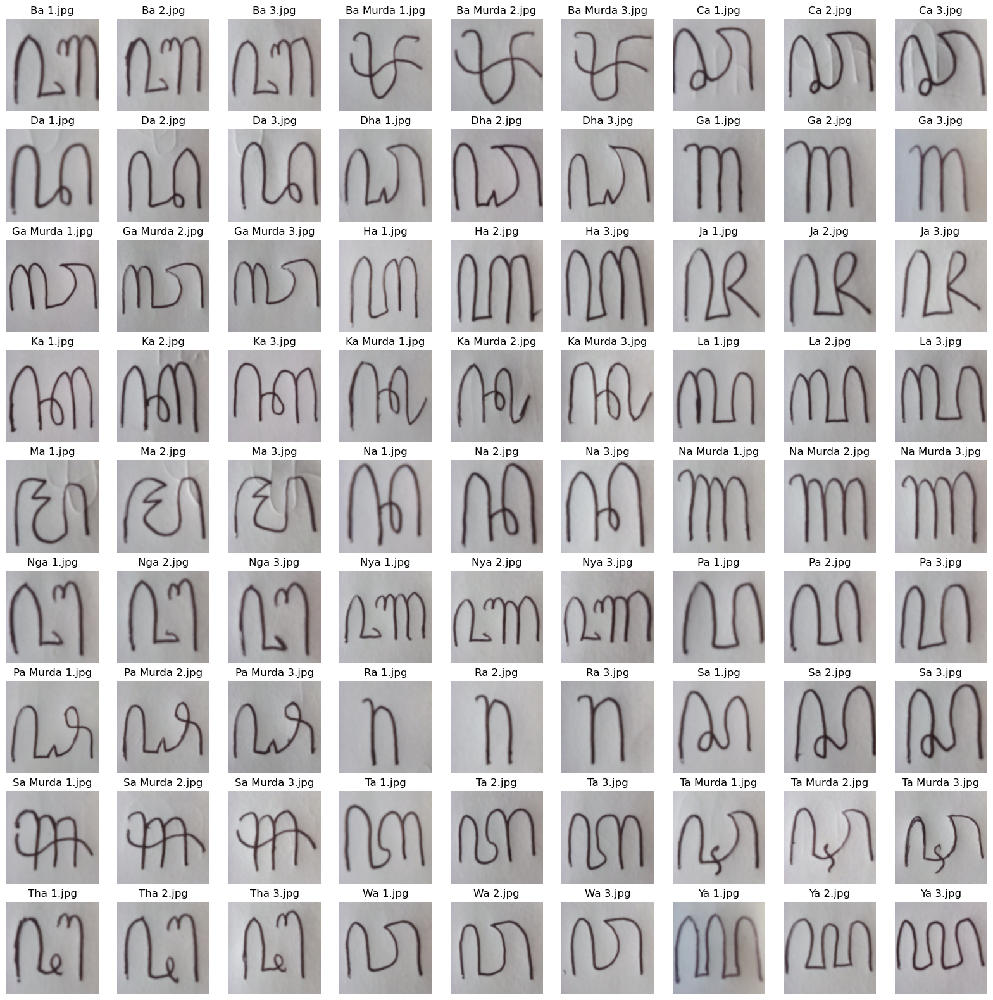

In [33]:
list_image = []
kelas_aktual_jenis = np.empty(81, dtype='object')
kelas_aktual_huruf = np.empty(81, dtype='object')
fig, axs = plt.subplots(nrows = 9, ncols = 9, figsize = (20,20))
axs = axs.flatten()

for i in range(81):
    filepath = os.path.join('Data Testing 2', os.listdir('Data Testing 2')[i])
    img = Image.open(filepath)
    list_image.append(img)
    axs [i].imshow(img)
    axs[i].axis('off')
    filename = os.listdir('Data Testing 2')[i]
    kelas_aktual_jenis[i] = filename
    kelas_aktual_huruf[i] = filename
    axs[i].set_title(filename)
plt.show()

In [34]:
for i in range(len(kelas_aktual_jenis)):
    
    if len(kelas_aktual_jenis[i]) > 9:
        kelas_aktual_jenis[i] = "Murda"
        kelas_aktual_huruf[i] = kelas_aktual_huruf[i][:8]
    elif len(kelas_aktual_jenis[i]) == 9 or len(kelas_aktual_jenis[i]) == 8:
        kelas_aktual_jenis[i] = "Ngelegena"
        if len(kelas_aktual_huruf[i]) == 8:
            kelas_aktual_huruf[i] = kelas_aktual_huruf[i][:2] 
        elif len(kelas_aktual_huruf[i]) == 9:
            kelas_aktual_huruf[i] = kelas_aktual_huruf[i][:3]
        
        
print(kelas_aktual_jenis)
print(kelas_aktual_huruf)

['Ngelegena' 'Ngelegena' 'Ngelegena' 'Murda' 'Murda' 'Murda' 'Ngelegena'
 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena'
 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Murda'
 'Murda' 'Murda' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena'
 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Murda'
 'Murda' 'Murda' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena'
 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Murda'
 'Murda' 'Murda' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena'
 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Murda'
 'Murda' 'Murda' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena'
 'Ngelegena' 'Ngelegena' 'Murda' 'Murda' 'Murda' 'Ngelegena' 'Ngelegena'
 'Ngelegena' 'Murda' 'Murda' 'Murda' 'Ngelegena' 'Ngelegena' 'Ngelegena'
 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena' 'Ngelegena']
['Ba' 'Ba' 'Ba' 'Ba Murda' 'Ba Murda' 'Ba Murda' 'Ca' 'Ca' 'Ca' 'Da' 'Da'
 'Da' 'Dha' 'Dha' 'Dha' 

#### Resize Data

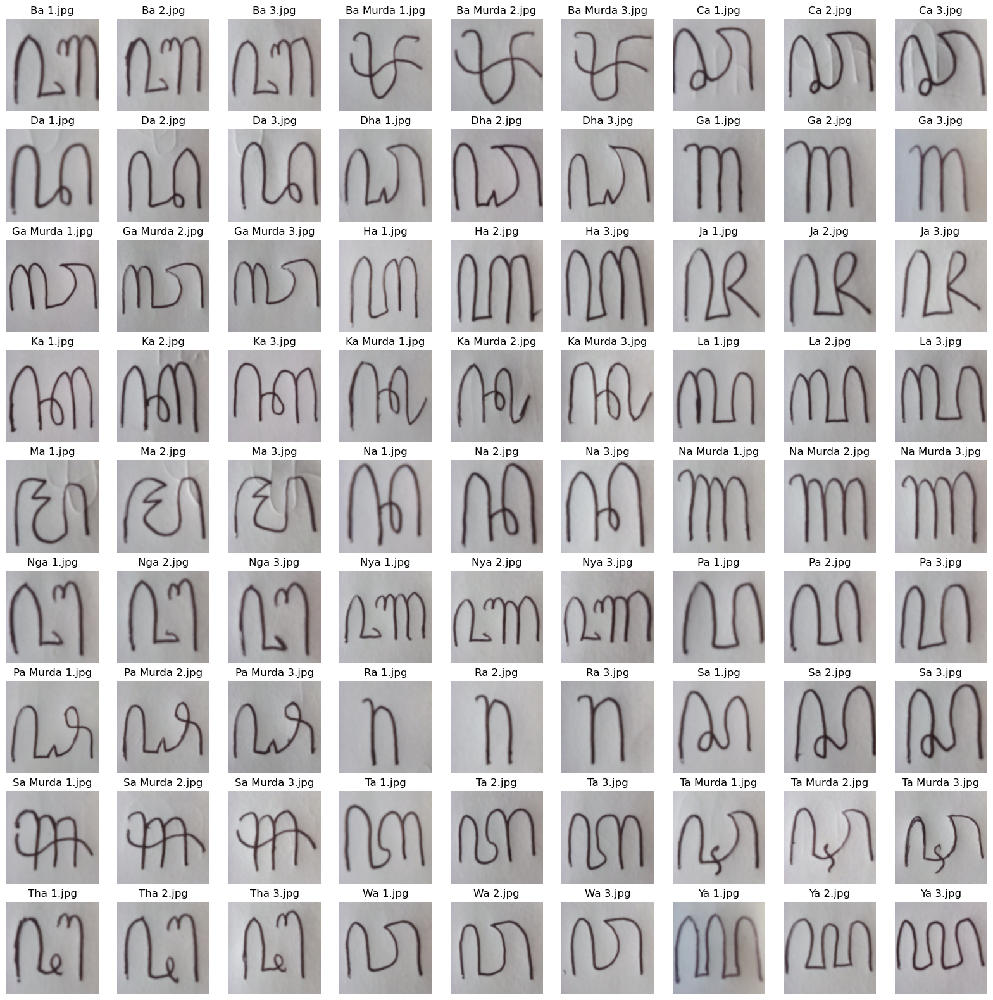

In [35]:
i = 0
resized_tests = []
fig, axs = plt.subplots(nrows = 9, ncols = 9, figsize = (20,20))
axs = axs.flatten()

for image in list_image:
    resized_test = image.resize((120, 120))
    resized_tests.append(resized_test)
    axs[i].imshow(image)
    axs[i].axis('off')
    axs[i].set_title(os.listdir('Data Testing 2')[i])
    i += 1

plt.show()

#### Grayscale Data

In [36]:
grayscale_tests = []
for image in resized_tests:
    width, height = image.size
    grayscale_test = Image.new("L", (width, height))
        
    for x in range(width):
            
        for y in range(height):
            r, g, b = image.getpixel((x, y))
            brightness = int(0.2989 * r + 0.5870 * g + 0.1140 * b)
            grayscale_test.putpixel((x, y), brightness)
            
    grayscale_tests.append(grayscale_test)

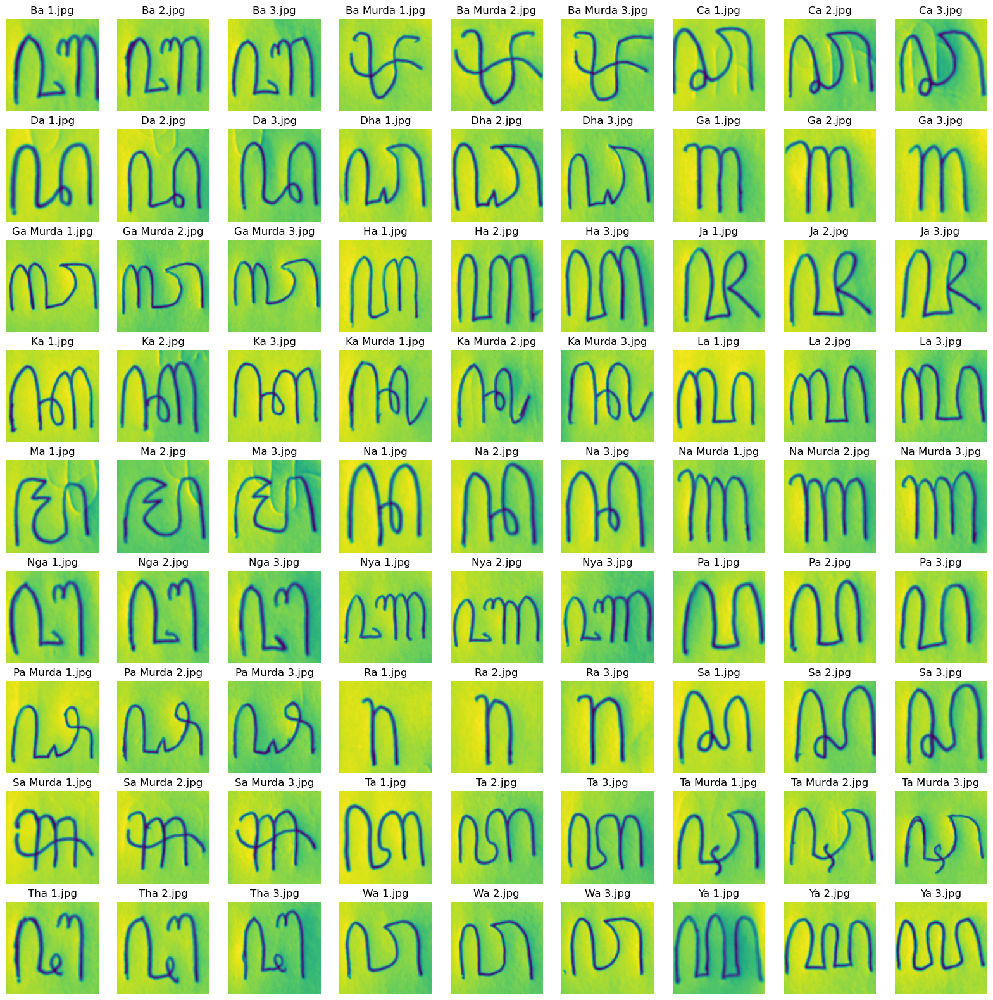

In [37]:
i = 0
fig, axs = plt.subplots(nrows = 9, ncols = 9, figsize = (20,20))
axs = axs.flatten()

for image in grayscale_tests:
    axs[i].imshow(image)
    axs[i].axis('off')
    axs[i].set_title(os.listdir('Data Testing 2')[i])
    i += 1
    
plt.show()

#### Sauvola Threshold Data

In [38]:
k = 0.2
R = 128
threshold_tests = []

for image in grayscale_tests:
    image = image.rotate(270)
    image = image.transpose(method=Image.FLIP_LEFT_RIGHT)
    img_array = np.array(image)
    width, height = image.size
    binary_img = Image.new("1", (width, height))
        
    for x in range(width):
            
        for y in range(height):
            window = img_array[max(x-15, 0):min(x+15, width), max(y-15, 0):min(y+15, height)]
            mean = np.mean(window)
            stddev = np.std(window)
            threshold = mean * (1 + k * ((stddev / R) - 1))
                
            if img_array[x, y] > threshold:
                binary_img.putpixel((x, y), 0)
            else:
                binary_img.putpixel((x, y), 255)
    
    threshold_tests.append(binary_img)

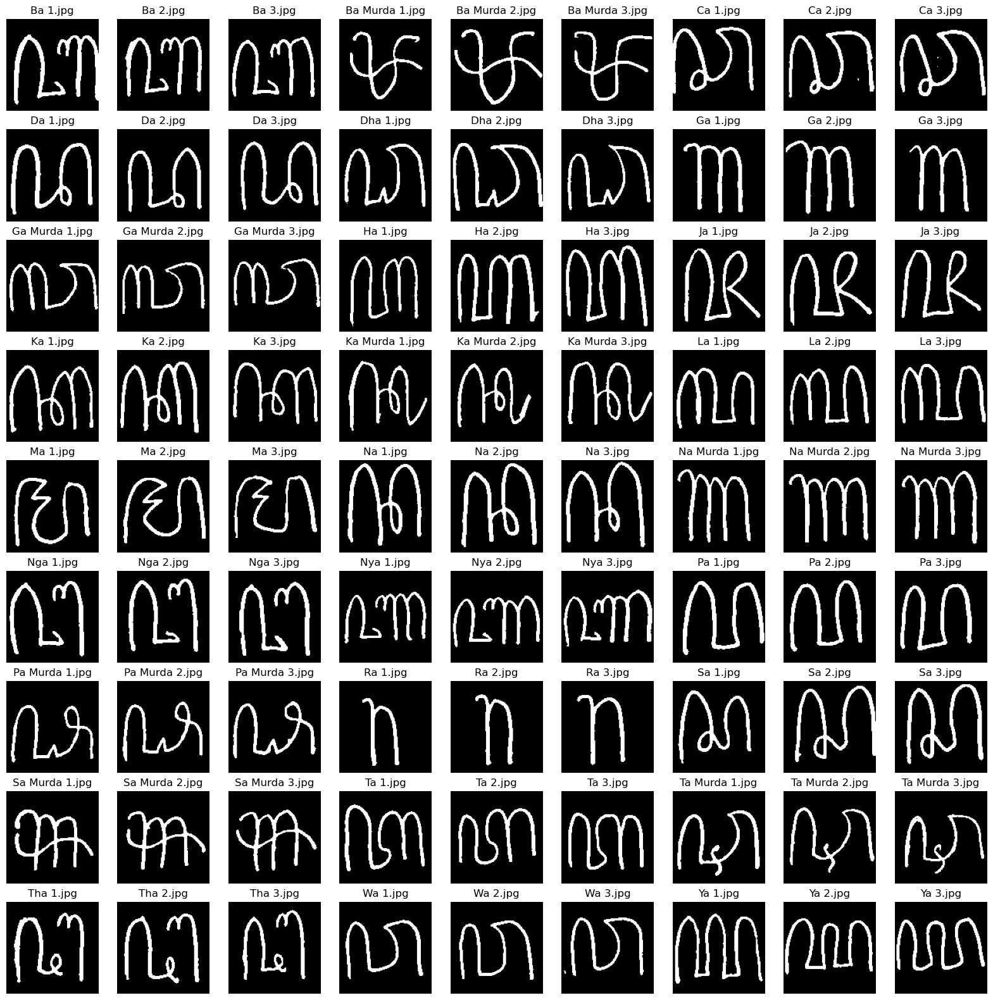

In [39]:
i = 0
fig, axs = plt.subplots(nrows = 9, ncols = 9, figsize = (20,20))
axs = axs.flatten()

for image in threshold_tests:
    axs[i].imshow(image)
    axs[i].axis('off')
    axs[i].set_title(os.listdir('Data Testing 2')[i])
    i += 1
    
plt.show()

### Ekstraksi Zoning ICZ dan ZCZ

#### Ekstraksi Zoning

In [40]:
i = 0
array_tests = np.zeros((len(threshold_tests), 12))
centroid = np.zeros((len(threshold_tests), 14))

for image in threshold_tests:
    width, height = image.size
    zone_height = height // 6
    zone1 = image.crop((0, 0, width, zone_height))
    zone2 = image.crop((0, zone_height, width, zone_height * 2))
    zone3 = image.crop((0, zone_height * 2, width, zone_height * 3))
    zone4 = image.crop((0, zone_height * 3, width, zone_height * 4))
    zone5 = image.crop((0, zone_height * 4, width, zone_height * 5))
    zone6 = image.crop((0, zone_height * 5, width, height))
    
    img_array = np.array(image)
    img_zone1 = np.array(zone1)
    img_zone2 = np.array(zone2)
    img_zone3 = np.array(zone3)
    img_zone4 = np.array(zone4)
    img_zone5 = np.array(zone5)
    img_zone6 = np.array(zone6)
    total_pixel = np.sum(img_array)
    total_zone1 = np.sum(img_zone1)
    total_zone2 = np.sum(img_zone2)
    total_zone3 = np.sum(img_zone3)
    total_zone4 = np.sum(img_zone4)
    total_zone5 = np.sum(img_zone5)
    total_zone6 = np.sum(img_zone6)
    
    kolom = 0
    baris = 0
    kolom_zone1 = 0
    kolom_zone2 = 0
    kolom_zone3 = 0
    kolom_zone4 = 0
    kolom_zone5 = 0
    kolom_zone6 = 0
    baris_zone1 = 0
    baris_zone2 = 0
    baris_zone3 = 0
    baris_zone4 = 0
    baris_zone5 = 0
    baris_zone6 = 0
    sum_kolom = 0
    sum_baris = 0
    sumkolom_zone1 = 0
    sumkolom_zone2 = 0
    sumkolom_zone3 = 0
    sumkolom_zone4 = 0
    sumkolom_zone5 = 0
    sumkolom_zone6 = 0
    sumbaris_zone1 = 0
    sumbaris_zone2 = 0
    sumbaris_zone3 = 0
    sumbaris_zone4 = 0
    sumbaris_zone5 = 0
    sumbaris_zone6 = 0
    sumiczzone1 = 0
    sumiczzone2 = 0
    sumiczzone3 = 0
    sumiczzone4 = 0
    sumiczzone5 = 0
    sumiczzone6 = 0
    sumzczzone1 = 0
    sumzczzone2 = 0
    sumzczzone3 = 0
    sumzczzone4 = 0
    sumzczzone5 = 0
    sumzczzone6 = 0
    
    for x in range(width):
    
        for y in range(height):
            kolom += img_array[y][x]
            baris += img_array[x][y]
    
        sum_kolom += kolom * (x + 1)  
        sum_baris += baris * (x + 1)
            
        kolom = 0
        baris = 0
        
    for x in range(len(img_zone1)):
            
        for y in range(len(img_zone1[x])):
            baris_zone1 += img_zone1[x][y]
            baris_zone2 += img_zone2[x][y]
            baris_zone3 += img_zone3[x][y]
            baris_zone4 += img_zone4[x][y]
            baris_zone5 += img_zone5[x][y]
            baris_zone6 += img_zone6[x][y]
            
        sumbaris_zone1 += baris_zone1 * (x + 1)
        sumbaris_zone2 += baris_zone2 * (x + 1)
        sumbaris_zone3 += baris_zone3 * (x + 1)
        sumbaris_zone4 += baris_zone4 * (x + 1)
        sumbaris_zone5 += baris_zone5 * (x + 1)
        sumbaris_zone6 += baris_zone6 * (x + 1)

        baris_zone1 = 0
        baris_zone2 = 0
        baris_zone3 = 0
        baris_zone4 = 0
        baris_zone5 = 0
        baris_zone6 = 0
            
    for x in range(len(img_zone1[0])):
            
        for y in range(len(img_zone1)):
            kolom_zone1 += img_zone1[y][x]
            kolom_zone2 += img_zone2[y][x]    
            kolom_zone3 += img_zone3[y][x]
            kolom_zone4 += img_zone4[y][x]
            kolom_zone5 += img_zone5[y][x]
            kolom_zone6 += img_zone6[y][x]
                
        sumkolom_zone1 += kolom_zone1 * (x + 1)  
        sumkolom_zone2 += kolom_zone2 * (x + 1)  
        sumkolom_zone3 += kolom_zone3 * (x + 1)
        sumkolom_zone4 += kolom_zone4 * (x + 1)
        sumkolom_zone5 += kolom_zone5 * (x + 1)
        sumkolom_zone6 += kolom_zone6 * (x + 1)
            
        kolom_zone1 = 0
        kolom_zone2 = 0
        kolom_zone3 = 0
        kolom_zone4 = 0
        kolom_zone5 = 0
        kolom_zone6 = 0
            
    centroid_x = sum_kolom / total_pixel
    centroid_y = sum_baris / total_pixel
        
    centroidx_zone1 = sumkolom_zone1 / total_zone1
    centroidx_zone2 = sumkolom_zone2 / total_zone2
    centroidx_zone3 = sumkolom_zone3 / total_zone3
    centroidx_zone4 = sumkolom_zone4 / total_zone4
    centroidx_zone5 = sumkolom_zone5 / total_zone5
    centroidx_zone6 = sumkolom_zone6 / total_zone6
    
    centroidy_zone1 = sumbaris_zone1 / total_zone1
    centroidy_zone2 = sumbaris_zone2 / total_zone2
    centroidy_zone3 = sumbaris_zone3 / total_zone3
    centroidy_zone4 = sumbaris_zone4 / total_zone4
    centroidy_zone5 = sumbaris_zone5 / total_zone5
    centroidy_zone6 = sumbaris_zone6 / total_zone6
    
    if math.isnan(centroidx_zone1) and math.isnan(centroidy_zone1):
        centroidx_zone1 = 0
        centroidy_zone1 = 0
        
    if math.isnan(centroidx_zone2) and math.isnan(centroidy_zone2):
        centroidx_zone2 = 0
        centroidy_zone2 = 0
        
    if math.isnan(centroidx_zone3) and math.isnan(centroidy_zone3):
        centroidx_zone3 = 0
        centroidy_zone3 = 0
        
    if math.isnan(centroidx_zone4) and math.isnan(centroidy_zone4):
        centroidx_zone4 = 0
        centroidy_zone4 = 0
        
    if math.isnan(centroidx_zone5) and math.isnan(centroidy_zone5):
        centroidx_zone5 = 0
        centroidy_zone5 = 0
        
    if math.isnan(centroidx_zone6) and math.isnan(centroidy_zone6):
        centroidx_zone6 = 0
        centroidy_zone6 = 0
        
    centroid[i] = [centroid_x, centroid_y, centroidx_zone1, centroidx_zone2, centroidx_zone3, centroidx_zone4, centroidx_zone5, centroidx_zone6
                   , centroidy_zone1, centroidy_zone2, centroidy_zone3, centroidy_zone4, centroidy_zone5, centroidy_zone6]    
        
    for x in range(len(img_zone1)):
            
        for y in range(len(img_zone1[0])):
            if img_zone1[x][y] == True:
                sumiczzone1 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone1 += math.sqrt(pow(((y+1) - centroidx_zone1), 2) + pow(((x+1) - centroidy_zone1), 2))
                
            if img_zone2[x][y] == True:
                sumiczzone2 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone2 += math.sqrt(pow(((y+1) - centroidx_zone2), 2) + pow(((x+1) - centroidy_zone2), 2))
                
            if img_zone3[x][y] == True:
                sumiczzone3 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone3 += math.sqrt(pow(((y+1) - centroidx_zone3), 2) + pow(((x+1) - centroidy_zone3), 2))
                
            if img_zone4[x][y] == True:
                sumiczzone4 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone4 += math.sqrt(pow(((y+1) - centroidx_zone4), 2) + pow(((x+1) - centroidy_zone4), 2))
                
            if img_zone5[x][y] == True:
                sumiczzone5 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone5 += math.sqrt(pow(((y+1) - centroidx_zone5), 2) + pow(((x+1) - centroidy_zone5), 2))
                
            if img_zone6[x][y] == True:
                sumiczzone6 += math.sqrt(pow(((y+1) - centroid_x), 2) + pow(((x+1) - centroid_y), 2))
                sumzczzone6 += math.sqrt(pow(((y+1) - centroidx_zone6), 2) + pow(((x+1) - centroidy_zone6), 2))
                    
    iczzone1 = sumiczzone1 / total_zone1
    iczzone2 = sumiczzone2 / total_zone2
    iczzone3 = sumiczzone3 / total_zone3
    iczzone4 = sumiczzone4 / total_zone4
    iczzone5 = sumiczzone5 / total_zone5
    iczzone6 = sumiczzone6 / total_zone6
        
    zczzone1 = sumzczzone1 / total_zone1
    zczzone2 = sumzczzone2 / total_zone2
    zczzone3 = sumzczzone3 / total_zone3
    zczzone4 = sumzczzone4 / total_zone4
    zczzone5 = sumzczzone5 / total_zone5
    zczzone6 = sumzczzone6 / total_zone6
    
    if math.isnan(iczzone1) and math.isnan(zczzone1):
        iczzone1 = 0
        zczzone1 = 0
        
    if math.isnan(iczzone2) and math.isnan(zczzone2):
        iczzone2 = 0
        zczzone2 = 0    
     
    if math.isnan(iczzone3) and math.isnan(zczzone3):
        iczzone3 = 0
        zczzone3 = 0
        
    if math.isnan(iczzone4) and math.isnan(zczzone4):
        iczzone4 = 0
        zczzone4 = 0 
        
    if math.isnan(iczzone5) and math.isnan(zczzone5):
        iczzone5 = 0
        zczzone5 = 0
        
    if math.isnan(iczzone6) and math.isnan(zczzone6):
        iczzone6 = 0
        zczzone6 = 0 
    
    array_tests[i] = [iczzone1, iczzone2, iczzone3, iczzone4, iczzone5, iczzone6
                    , zczzone1, zczzone2, zczzone3, zczzone4, zczzone5, zczzone6]
             
    print("Nama File : ", name[i])
    print("Centroid Citra: ({}, {})".format(centroid_x, centroid_y))
    print("Centroid Zona 1: ({}, {})".format(centroidx_zone1, centroidy_zone1))
    print("Centroid Zona 2: ({}, {})".format(centroidx_zone2, centroidy_zone2))
    print("Centroid Zona 3: ({}, {})".format(centroidx_zone3, centroidy_zone3))
    print("Centroid Zona 4: ({}, {})".format(centroidx_zone4, centroidy_zone4))
    print("Centroid Zona 5: ({}, {})".format(centroidx_zone5, centroidy_zone5))
    print("Centroid Zona 6: ({}, {})".format(centroidx_zone6, centroidy_zone6))
    print("Ekstraksi ICZ: ({}, {}, {}, {}, {}, {})".format(iczzone1, iczzone2, iczzone3, iczzone4, iczzone5, iczzone6))
    print("Ekstraksi ZCZ: ({}, {}, {}, {}, {}, {})".format(zczzone1, zczzone2, zczzone3, zczzone4, zczzone5, zczzone6))
    print("\n")
        
    i += 1
    
df = pd.DataFrame(array_tests)
df.to_excel('Tests 6 Zona(2).xlsx', index=False)

C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2908213900.py:134: RuntimeWarning: invalid value encountered in long_scalars
  centroidx_zone1 = sumkolom_zone1 / total_zone1
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2908213900.py:141: RuntimeWarning: invalid value encountered in long_scalars
  centroidy_zone1 = sumbaris_zone1 / total_zone1
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2908213900.py:202: RuntimeWarning: invalid value encountered in long_scalars
  iczzone1 = sumiczzone1 / total_zone1
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2908213900.py:209: RuntimeWarning: invalid value encountered in long_scalars
  zczzone1 = sumzczzone1 / total_zone1


Nama File :  Ha
Centroid Citra: (66.13593481989709, 62.66552315608919)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (69.55555555555556, 11.574603174603174)
Centroid Zona 3: (66.69333333333333, 9.752380952380953)
Centroid Zona 4: (65.17420814479638, 10.5)
Centroid Zona 5: (65.78536585365853, 11.821138211382113)
Centroid Zona 6: (51.083333333333336, 4.108333333333333)
Ekstraksi ICZ: (0, 60.43599213004791, 64.75842326329521, 65.33235976800016, 60.23639659501051, 73.93450407699835)
Ekstraksi ZCZ: (0, 29.761168231241292, 35.108165905238685, 37.80109843326074, 29.138692099355918, 37.56264286661146)


Nama File :  Ha
Centroid Citra: (60.167735042735046, 60.05181623931624)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (62.861480075901326, 12.51043643263757)
Centroid Zona 3: (58.083885209713024, 9.856512141280353)
Centroid Zona 4: (61.77295918367347, 10.721938775510203)
Centroid Zona 5: (58.296370967741936, 9.860887096774194)
Centroid Zona 6: (16.0, 1.25)
Ekstraksi ICZ: (0, 55.6903428653536, 61.57370502

C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2908213900.py:139: RuntimeWarning: invalid value encountered in long_scalars
  centroidx_zone6 = sumkolom_zone6 / total_zone6
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2908213900.py:146: RuntimeWarning: invalid value encountered in long_scalars
  centroidy_zone6 = sumbaris_zone6 / total_zone6
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2908213900.py:207: RuntimeWarning: invalid value encountered in long_scalars
  iczzone6 = sumiczzone6 / total_zone6
C:\Users\Ilham\AppData\Local\Temp\ipykernel_2516\2908213900.py:214: RuntimeWarning: invalid value encountered in long_scalars
  zczzone6 = sumzczzone6 / total_zone6


Nama File :  Ha
Centroid Citra: (50.65981100611451, 52.96220122290161)
Centroid Zona 1: (56.056390977443606, 16.18421052631579)
Centroid Zona 2: (49.24874371859296, 10.045226130653266)
Centroid Zona 3: (53.01764705882353, 10.397058823529411)
Centroid Zona 4: (52.705882352941174, 11.776876267748479)
Centroid Zona 5: (41.771523178807946, 7.731788079470198)
Centroid Zona 6: (0, 0)
Ekstraksi ICZ: (47.10923309261083, 55.35953814335289, 55.090398899619984, 50.96624545522807, 56.974750515860066, 0)
Ekstraksi ZCZ: (26.14975610504537, 33.3306671900071, 33.02320209984141, 27.07635376383956, 27.66568039055446, 0)


Nama File :  Ha
Centroid Citra: (61.29273620972146, 57.956854178044786)
Centroid Zona 1: (80.47321428571429, 18.973214285714285)
Centroid Zona 2: (61.91428571428571, 9.589010989010989)
Centroid Zona 3: (62.645833333333336, 10.377604166666666)
Centroid Zona 4: (62.17357512953368, 10.655440414507773)
Centroid Zona 5: (55.56404958677686, 8.62603305785124)
Centroid Zona 6: (9.5, 1.8)
Ekstr

Nama File :  Ca
Centroid Citra: (60.24961240310078, 56.02403100775194)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (63.35942028985507, 13.498550724637681)
Centroid Zona 3: (57.27877237851662, 10.250639386189258)
Centroid Zona 4: (59.01960784313726, 10.884803921568627)
Centroid Zona 5: (64.29452054794521, 3.184931506849315)
Centroid Zona 6: (0, 0)
Ekstraksi ICZ: (0, 53.72995702731522, 58.45381737757017, 57.27355690203764, 62.20787712081454, 0)
Ekstraksi ZCZ: (0, 31.323543653439643, 33.57804021834328, 32.67073066640001, 26.18796634419361, 0)


Nama File :  Ca
Centroid Citra: (57.95514511873351, 63.64313984168865)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (62.075, 11.475)
Centroid Zona 3: (58.44378698224852, 10.775147928994082)
Centroid Zona 4: (57.891364902506965, 10.41782729805014)
Centroid Zona 5: (57.79840848806366, 10.748010610079575)
Centroid Zona 6: (38.853658536585364, 3.6341463414634148)
Ekstraksi ICZ: (0, 58.23265562332407, 60.04991321971752, 60.435124430862864, 60.17665889896716, 6

Nama File :  Ra
Centroid Citra: (53.092696629213485, 62.9561797752809)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (52.10761154855643, 13.398950131233596)
Centroid Zona 3: (54.38374717832957, 10.54627539503386)
Centroid Zona 4: (51.53601694915254, 10.633474576271187)
Centroid Zona 5: (55.12658227848101, 9.848101265822784)
Centroid Zona 6: (10.5, 1.8)
Ekstraksi ICZ: (0, 57.23988693403809, 61.503435503599476, 61.14953009688236, 61.49757005609733, 74.5325874824658)
Ekstraksi ZCZ: (0, 25.623101478756, 29.358552679419955, 28.521385531786148, 27.502479379625925, 1.1990378377922535)


Nama File :  Ra
Centroid Citra: (61.82754418037782, 60.85862279098111)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (63.86351706036746, 12.564304461942257)
Centroid Zona 3: (59.13793103448276, 10.275862068965518)
Centroid Zona 4: (60.38747099767981, 10.737819025522041)
Centroid Zona 5: (64.40355329949239, 9.096446700507615)
Centroid Zona 6: (0, 0)
Ekstraksi ICZ: (0, 55.90567224066604, 59.61626029964708, 59.879198775547

Nama File :  Ka
Centroid Citra: (60.493951612903224, 63.19254032258065)
Centroid Zona 1: (80.85185185185185, 18.703703703703702)
Centroid Zona 2: (61.37126865671642, 10.369402985074627)
Centroid Zona 3: (57.11081081081081, 9.791891891891892)
Centroid Zona 4: (56.011661807580175, 10.364431486880466)
Centroid Zona 5: (62.109839816933636, 11.837528604118994)
Centroid Zona 6: (62.59836065573771, 4.077868852459017)
Ekstraksi ICZ: (52.14208609958509, 59.4302168732867, 63.21648653273603, 63.98772644869673, 59.104841625898565, 65.76193999314107)
Ekstraksi ZCZ: (11.338205720247197, 25.329391970069523, 31.202124711802263, 33.55930958190062, 26.359499672863855, 24.082460627331987)


Nama File :  Ka
Centroid Citra: (63.13656957928803, 60.353398058252424)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (70.8810975609756, 15.615853658536585)
Centroid Zona 3: (62.75541125541125, 9.83982683982684)
Centroid Zona 4: (63.74133949191686, 11.099307159353348)
Centroid Zona 5: (54.98136645962733, 6.186335403726708)

Nama File :  Ta
Centroid Citra: (66.77910447761194, 57.41194029850746)
Centroid Zona 1: (75.27710843373494, 14.751004016064257)
Centroid Zona 2: (69.63265306122449, 10.448979591836734)
Centroid Zona 3: (70.03108808290155, 10.577720207253886)
Centroid Zona 4: (66.44372294372295, 11.422077922077921)
Centroid Zona 5: (60.90833333333333, 9.7125)
Centroid Zona 6: (29.78048780487805, 2.6097560975609757)
Ekstraksi ICZ: (53.66749001089827, 57.58700856836312, 58.49049982179942, 56.45036852574181, 57.76747766707932, 67.75072159827441)
Ekstraksi ZCZ: (30.074037849764366, 31.42012542869844, 32.17238214481701, 29.880957071263648, 28.06345578952583, 15.51835403415935)


Nama File :  Ta
Centroid Citra: (63.21967357741509, 57.58138509042788)
Centroid Zona 1: (71.3967213114754, 13.731147540983606)
Centroid Zona 2: (63.65083135391924, 10.351543942992874)
Centroid Zona 3: (64.28433734939759, 10.672289156626507)
Centroid Zona 4: (61.80544747081712, 11.560311284046692)
Centroid Zona 5: (60.600725952813065,

Nama File :  Sa
Centroid Citra: (58.74322396576319, 60.09771754636234)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (60.4066852367688, 12.406685236768801)
Centroid Zona 3: (57.711048158640224, 10.597733711048159)
Centroid Zona 4: (59.66954022988506, 10.663793103448276)
Centroid Zona 5: (57.370588235294115, 8.144117647058824)
Centroid Zona 6: (14.5, 1.0)
Ekstraksi ICZ: (0, 55.93819323765861, 60.67426310224843, 60.37278573455292, 61.575953582356895, 73.82522127897761)
Ekstraksi ZCZ: (0, 26.46743403195604, 33.329120213441016, 33.115119796302565, 28.504523011220044, 0.5)


Nama File :  Sa
Centroid Citra: (57.815384615384616, 62.724542124542126)
Centroid Zona 1: (0, 0)
Centroid Zona 2: (58.88198757763975, 12.624223602484472)
Centroid Zona 3: (55.28482972136223, 10.507739938080496)
Centroid Zona 4: (58.69604863221885, 10.559270516717325)
Centroid Zona 5: (57.485488126649074, 10.686015831134565)
Centroid Zona 6: (83.58333333333333, 1.3333333333333333)
Ekstraksi ICZ: (0, 55.99362278134618, 61.5294

In [41]:
df_test = pd.read_excel("Tests 6 Zona(2).xlsx")
df_test

,0,1,2,3,4,5,6,7,8,9,10,11
0,0.000000,60.435992,64.758423,65.332360,60.236397,73.934504,0.000000,29.761168,35.108166,37.801098,29.138692,37.562643
1,0.000000,55.690343,61.573705,60.352996,57.911780,73.544750,0.000000,26.233402,33.878749,33.432374,25.727021,0.765388
2,0.000000,57.614591,63.609570,65.576035,60.894467,79.682539,0.000000,24.844732,31.018583,37.119966,27.721902,44.669762
3,47.303610,58.343771,52.307657,55.146190,49.441222,56.406323,2.958612,27.506750,24.239691,20.961384,12.680176,3.631408
4,55.495634,58.781489,55.923825,61.060079,52.641482,54.795670,35.169709,26.586215,27.297520,30.511041,18.160019,7.534505
...,...,...,...,...,...,...,...,...,...,...,...,...
76,0.000000,55.993623,61.529430,62.168805,60.601133,76.869007,0.000000,21.891342,30.708347,31.992284,27.654545,33.296300
77,0.000000,54.203254,56.203576,56.100491,58.634473,0.000000,0.000000,25.148940,31.462688,30.899794,27.417212,0.000000
78,44.819372,60.712712,60.763765,61.286700,60.255914,77.506946,7.662790,28.432649,29.184857,29.879473,29.255293,42.803570
79,0.000000,55.949914,58.692778,59.248708,62.945768,0.000000,0.000000,29.088316,30.441510,31.219804,28.924355,0.000000


### Testing SVM

#### Kernel RBF untuk Binary

In [42]:
sigma = 2.1

def kernel_rbf(array_tests):
    array_rbf = np.zeros((len(array_ekstraksi), len(array_tests)))
    for i in range (len(array_tests)):
        for j in range (len(array_ekstraksi)):
            array_rbf[j, i] = math.exp(-(pow((array_tests[i][0] - array_ekstraksi[j][0]), 2)
                                        + pow((array_tests[i][1] - array_ekstraksi[j][1]), 2)
                                        + pow((array_tests[i][2] - array_ekstraksi[j][2]), 2)
                                        + pow((array_tests[i][3] - array_ekstraksi[j][3]), 2)
                                        + pow((array_tests[i][4] - array_ekstraksi[j][4]), 2)
                                        + pow((array_tests[i][5] - array_ekstraksi[j][5]), 2)
                                        + pow((array_tests[i][6] - array_ekstraksi[j][6]), 2)
                                        + pow((array_tests[i][7] - array_ekstraksi[j][7]), 2)
                                        + pow((array_tests[i][8] - array_ekstraksi[j][8]), 2)
                                        + pow((array_tests[i][9] - array_ekstraksi[j][9]), 2)
                                        + pow((array_tests[i][10] - array_ekstraksi[j][10]), 2)
                                        + pow((array_tests[i][11] - array_ekstraksi[j][11]), 2)) / (2 * pow(sigma, 2)))
    return array_rbf

rbf_tests = kernel_rbf(array_tests)
print(rbf_tests)

[[2.64665145e-219 4.96101377e-160 1.51503305e-246 ... 7.70938628e-084
  0.00000000e+000 0.00000000e+000]
 [1.42137734e-207 3.18826780e-203 4.65635714e-222 ... 1.15364755e-058
  0.00000000e+000 0.00000000e+000]
 [2.27223763e-172 3.51248343e-194 5.88280087e-186 ... 9.76976278e-026
  0.00000000e+000 0.00000000e+000]
 ...
 [2.29350296e-226 2.83282972e-173 8.47340563e-256 ... 3.30111469e-101
  2.02671570e-312 2.31746422e-306]
 [1.00727788e-251 1.72543381e-172 4.48716849e-287 ... 2.08303591e-135
  5.95913312e-310 1.31727030e-299]
 [1.20292965e-304 3.97673681e-247 0.00000000e+000 ... 1.64862064e-147
  0.00000000e+000 0.00000000e+000]]


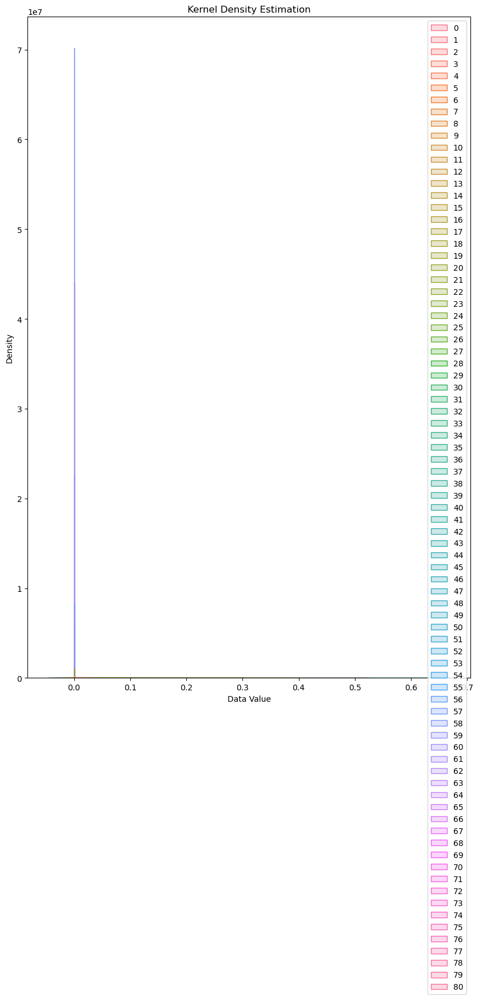

In [43]:
plt.figure(figsize=(10, 15))
sns.kdeplot(rbf_tests, fill=True)
plt.title('Kernel Density Estimation')
plt.xlabel('Data Value')
plt.ylabel('Density')
plt.show()

#### Klasifikasi Binary, Kernel RBF Multiclass dan Klasifikasi Multiclass 

In [44]:
matriks_bobot = np.zeros((len(array_ekstraksi)))
matriks_bobot_ha = np.zeros((len(array_ngelegena)))
matriks_bobot_na = np.zeros((len(array_ngelegena)))
matriks_bobot_ca = np.zeros((len(array_ngelegena)))
matriks_bobot_ra = np.zeros((len(array_ngelegena)))
matriks_bobot_ka = np.zeros((len(array_ngelegena)))
matriks_bobot_da = np.zeros((len(array_ngelegena)))
matriks_bobot_ta = np.zeros((len(array_ngelegena)))
matriks_bobot_sa = np.zeros((len(array_ngelegena)))
matriks_bobot_wa = np.zeros((len(array_ngelegena)))
matriks_bobot_la = np.zeros((len(array_ngelegena)))
matriks_bobot_pa = np.zeros((len(array_ngelegena)))
matriks_bobot_dha = np.zeros((len(array_ngelegena)))
matriks_bobot_ja = np.zeros((len(array_ngelegena)))
matriks_bobot_ya = np.zeros((len(array_ngelegena)))
matriks_bobot_nya = np.zeros((len(array_ngelegena)))
matriks_bobot_ma = np.zeros((len(array_ngelegena)))
matriks_bobot_ga = np.zeros((len(array_ngelegena)))
matriks_bobot_ba = np.zeros((len(array_ngelegena)))
matriks_bobot_tha = np.zeros((len(array_ngelegena)))
matriks_bobot_nga = np.zeros((len(array_ngelegena)))
matriks_bobot_namurda = np.zeros((len(array_murda)))
matriks_bobot_kamurda = np.zeros((len(array_murda)))
matriks_bobot_tamurda = np.zeros((len(array_murda)))
matriks_bobot_samurda = np.zeros((len(array_murda)))
matriks_bobot_pamurda = np.zeros((len(array_murda)))
matriks_bobot_gamurda = np.zeros((len(array_murda)))
matriks_bobot_bamurda = np.zeros((len(array_murda)))

In [45]:
kelas_prediksi = np.empty(81, dtype='object')
kelas_prediksi_huruf = np.empty(81, dtype='object')
array_rbf_murda = np.zeros((len(array_murda), 1))
array_rbf_ngelegena = np.zeros((len(array_ngelegena), 1))
sigma_huruf = 2
sigma_murda = 3
a = 0

for i in range(rbf_tests.shape[1]):
    for j in range(rbf_tests.shape[0]):
        matriks_bobot[j] = alpha[j] * model[j][12] * rbf_tests[j, i]
    total_bobot = np.sum(matriks_bobot)
    hasil_klasifikasi = total_bobot + bias
    if hasil_klasifikasi > 0:
        kelas_prediksi[i] = "Ngelegena"
        for k in range (1):
            for l in range (len(array_ngelegena)):
                array_rbf_ngelegena[l, k] = math.exp(-(pow((array_tests[a][0] - array_ngelegena[l][0]), 2)
                                                    + pow((array_tests[a][1] - array_ngelegena[l][1]), 2)
                                                    + pow((array_tests[a][2] - array_ngelegena[l][2]), 2)
                                                    + pow((array_tests[a][3] - array_ngelegena[l][3]), 2)
                                                    + pow((array_tests[a][4] - array_ngelegena[l][4]), 2)
                                                    + pow((array_tests[a][5] - array_ngelegena[l][5]), 2)
                                                    + pow((array_tests[a][6] - array_ngelegena[l][6]), 2)
                                                    + pow((array_tests[a][7] - array_ngelegena[l][7]), 2)
                                                    + pow((array_tests[a][8] - array_ngelegena[l][8]), 2)
                                                    + pow((array_tests[a][9] - array_ngelegena[l][9]), 2)
                                                    + pow((array_tests[a][10] - array_ngelegena[l][10]), 2)
                                                    + pow((array_tests[a][11] - array_ngelegena[l][11]), 2)) / (2 * pow(sigma_huruf, 2)))
        a += 1
        for k in range(21):
            if k == 0:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ha[m] = alpha_ha[m] * model_ha[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ha)
                hasil_klasifikasi_huruf = total_bobot + bias_ha
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ha"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 1:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_na[m] = alpha_na[m] * model_na[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_na)
                hasil_klasifikasi_huruf = total_bobot + bias_na
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Na"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 2:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ca[m] = alpha_ca[m] * model_ca[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ca)
                hasil_klasifikasi_huruf = total_bobot + bias_ca
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ca"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 3:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ra[m] = alpha_ra[m] * model_ra[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ra)
                hasil_klasifikasi_huruf = total_bobot + bias_ra
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ra"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 4:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ka[m] = alpha_ka[m] * model_ka[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ka)
                hasil_klasifikasi_huruf = total_bobot + bias_ka
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ka"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 5:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_da[m] = alpha_da[m] * model_da[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_da)
                hasil_klasifikasi_huruf = total_bobot + bias_da
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Da"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 6:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ta[m] = alpha_ta[m] * model_ta[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ta)
                hasil_klasifikasi_huruf = total_bobot + bias_ta
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ta"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 7:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_sa[m] = alpha_sa[m] * model_sa[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_sa)
                hasil_klasifikasi_huruf = total_bobot + bias_sa
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Sa"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 8:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_wa[m] = alpha_wa[m] * model_wa[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_wa)
                hasil_klasifikasi_huruf = total_bobot + bias_wa
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Wa"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 9:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_la[m] = alpha_la[m] * model_la[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_la)
                hasil_klasifikasi_huruf = total_bobot + bias_la
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "La"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 10:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_pa[m] = alpha_pa[m] * model_pa[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_pa)
                hasil_klasifikasi_huruf = total_bobot + bias_pa
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Pa"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 11:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_dha[m] = alpha_dha[m] * model_dha[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_dha)
                hasil_klasifikasi_huruf = total_bobot + bias_dha
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Dha"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 12:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ja[m] = alpha_ja[m] * model_ja[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ja)
                hasil_klasifikasi_huruf = total_bobot + bias_ja
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ja"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 13:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ya[m] = alpha_ya[m] * model_ya[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ya)
                hasil_klasifikasi_huruf = total_bobot + bias_ya
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ya"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 14:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_nya[m] = alpha_nya[m] * model_nya[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_nya)
                hasil_klasifikasi_huruf = total_bobot + bias_nya
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Nya"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 15:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ma[m] = alpha_ma[m] * model_ma[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ma)
                hasil_klasifikasi_huruf = total_bobot + bias_ma
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ma"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 16:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ga[m] = alpha_ga[m] * model_ga[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ga)
                hasil_klasifikasi_huruf = total_bobot + bias_ga
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ga"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 17:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_ba[m] = alpha_ba[m] * model_ba[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ba)
                hasil_klasifikasi_huruf = total_bobot + bias_ba
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ba"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 18:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_tha[m] = alpha_tha[m] * model_tha[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_tha)
                hasil_klasifikasi_huruf = total_bobot + bias_tha
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Tha"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 19:
                for m in range(array_rbf_ngelegena.shape[0]):
                    matriks_bobot_nga[m] = alpha_nga[m] * model_nga[m][12] * array_rbf_ngelegena[m, 0]
                total_bobot = np.sum(matriks_bobot_ha)
                hasil_klasifikasi_huruf = total_bobot + bias_nga
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Nga"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            else:
                kelas_prediksi_huruf[i] = "Tak Terdefinisi"
                print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
    else:
        kelas_prediksi[i] = "Murda"
        for k in range (1):
            for l in range (len(array_murda)):
                array_rbf_murda[l, k] = math.exp(-(pow((array_tests[a][0] - array_murda[l][0]), 2)
                                                    + pow((array_tests[a][1] - array_murda[l][1]), 2)
                                                    + pow((array_tests[a][2] - array_murda[l][2]), 2)
                                                    + pow((array_tests[a][3] - array_murda[l][3]), 2)
                                                    + pow((array_tests[a][4] - array_murda[l][4]), 2)
                                                    + pow((array_tests[a][5] - array_murda[l][5]), 2)
                                                    + pow((array_tests[a][6] - array_murda[l][6]), 2)
                                                    + pow((array_tests[a][7] - array_murda[l][7]), 2)
                                                    + pow((array_tests[a][8] - array_murda[l][8]), 2)
                                                    + pow((array_tests[a][9] - array_murda[l][9]), 2)
                                                    + pow((array_tests[a][10] - array_murda[l][10]), 2)
                                                    + pow((array_tests[a][11] - array_murda[l][11]), 2)) / (2 * pow(sigma_murda, 2)))
        a += 1
        for k in range(8):
            if k == 0:
                for m in range(array_rbf_murda.shape[0]):
                    matriks_bobot_namurda[m] = alpha_namurda[m] * model_namurda[m][12] * array_rbf_murda[m, 0]
                total_bobot = np.sum(matriks_bobot_namurda)
                hasil_klasifikasi_huruf = total_bobot + bias_namurda
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Na Murda"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 1:
                for m in range(array_rbf_murda.shape[0]):
                    matriks_bobot_kamurda[m] = alpha_kamurda[m] * model_kamurda[m][12] * array_rbf_murda[m, 0]
                total_bobot = np.sum(matriks_bobot_kamurda)
                hasil_klasifikasi_huruf = total_bobot + bias_kamurda
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ka Murda"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 2:
                for m in range(array_rbf_murda.shape[0]):
                    matriks_bobot_tamurda[m] = alpha_tamurda[m] * model_tamurda[m][12] * array_rbf_murda[m, 0]
                total_bobot = np.sum(matriks_bobot_tamurda)
                hasil_klasifikasi_huruf = total_bobot + bias_tamurda
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ta Murda"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 3:
                for m in range(array_rbf_murda.shape[0]):
                    matriks_bobot_samurda[m] = alpha_samurda[m] * model_samurda[m][12] * array_rbf_murda[m, 0]
                total_bobot = np.sum(matriks_bobot_samurda)
                hasil_klasifikasi_huruf = total_bobot + bias_samurda
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Sa Murda"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 4:
                for m in range(array_rbf_murda.shape[0]):
                    matriks_bobot_pamurda[m] = alpha_pamurda[m] * model_pamurda[m][12] * array_rbf_murda[m, 0]
                total_bobot = np.sum(matriks_bobot_pamurda)
                hasil_klasifikasi_huruf = total_bobot + bias_pamurda
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Pa Murda"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 5:
                for m in range(array_rbf_murda.shape[0]):
                    matriks_bobot_gamurda[m] = alpha_gamurda[m] * model_gamurda[m][12] * array_rbf_murda[m, 0]
                total_bobot = np.sum(matriks_bobot_gamurda)
                hasil_klasifikasi_huruf = total_bobot + bias_gamurda
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ga Murda"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            elif k == 6:
                for m in range(array_rbf_murda.shape[0]):
                    matriks_bobot_bamurda[m] = alpha_bamurda[m] * model_bamurda[m][12] * array_rbf_murda[m, 0]
                total_bobot = np.sum(matriks_bobot_bamurda)
                hasil_klasifikasi_huruf = total_bobot + bias_bamurda
                if hasil_klasifikasi_huruf > 0:
                    kelas_prediksi_huruf[i] = "Ba Murda"
                    print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])
                    break
            else:
                kelas_prediksi_huruf[i] = "Tak Terdefinisi"
                print(i, kelas_prediksi[i], kelas_prediksi_huruf[i])

0 Ngelegena Tak Terdefinisi
1 Ngelegena Tak Terdefinisi
2 Ngelegena Tak Terdefinisi
3 Ngelegena Tak Terdefinisi
4 Ngelegena Tak Terdefinisi
5 Ngelegena Tak Terdefinisi
6 Ngelegena Tak Terdefinisi
7 Ngelegena Tak Terdefinisi
8 Ngelegena Tak Terdefinisi
9 Ngelegena Tak Terdefinisi
10 Ngelegena Tak Terdefinisi
11 Ngelegena Tak Terdefinisi
12 Ngelegena Tak Terdefinisi
13 Ngelegena Tak Terdefinisi
14 Ngelegena Tak Terdefinisi
15 Ngelegena Tak Terdefinisi
16 Ngelegena Tak Terdefinisi
17 Ngelegena Tak Terdefinisi
18 Ngelegena Tak Terdefinisi
19 Murda Ga Murda
20 Ngelegena Tak Terdefinisi
21 Ngelegena Tak Terdefinisi
22 Ngelegena Tak Terdefinisi
23 Ngelegena Tak Terdefinisi
24 Ngelegena Tak Terdefinisi
25 Ngelegena Tak Terdefinisi
26 Ngelegena Tak Terdefinisi
27 Ngelegena Tak Terdefinisi
28 Ngelegena Tak Terdefinisi
29 Ngelegena Tak Terdefinisi
30 Ngelegena Tak Terdefinisi
31 Ngelegena Tak Terdefinisi
32 Ngelegena Tak Terdefinisi
33 Ngelegena Tak Terdefinisi
34 Ngelegena Ta
35 Ngelegena Tak Te

In [46]:
for i in range(81):
    if kelas_prediksi[i] == "Ngelegena":
        kelas_prediksi[i] = 1
    elif kelas_prediksi[i] == "Murda":
        kelas_prediksi[i] = 2
        
for i in range(81):
    if kelas_aktual_jenis[i] == "Ngelegena":
        kelas_aktual_jenis[i] = 1
    elif kelas_aktual_jenis[i] == "Murda":
        kelas_aktual_jenis[i] = 2

In [47]:
for i in range(len(kelas_prediksi_huruf)):
    if kelas_prediksi_huruf[i] == "Ha":
        kelas_prediksi_huruf[i] = 1
    elif kelas_prediksi_huruf[i] == "Na":
        kelas_prediksi_huruf[i] = 2
    elif kelas_prediksi_huruf[i] == "Ca":
        kelas_prediksi_huruf[i] = 3
    elif kelas_prediksi_huruf[i] == "Ra":
        kelas_prediksi_huruf[i] = 4
    elif kelas_prediksi_huruf[i] == "Ka":
        kelas_prediksi_huruf[i] = 5
    elif kelas_prediksi_huruf[i] == "Da":
        kelas_prediksi_huruf[i] = 6
    elif kelas_prediksi_huruf[i] == "Ta":
        kelas_prediksi_huruf[i] = 7
    elif kelas_prediksi_huruf[i] == "Sa":
        kelas_prediksi_huruf[i] = 8
    elif kelas_prediksi_huruf[i] == "Wa":
        kelas_prediksi_huruf[i] = 9
    elif kelas_prediksi_huruf[i] == "La":
        kelas_prediksi_huruf[i] = 10
    elif kelas_prediksi_huruf[i] == "Pa":
        kelas_prediksi_huruf[i] = 11
    elif kelas_prediksi_huruf[i] == "Dha":
        kelas_prediksi_huruf[i] = 12
    elif kelas_prediksi_huruf[i] == "Ja":
        kelas_prediksi_huruf[i] = 13
    elif kelas_prediksi_huruf[i] == "Ya":
        kelas_prediksi_huruf[i] = 14
    elif kelas_prediksi_huruf[i] == "Nya":
        kelas_prediksi_huruf[i] = 15
    elif kelas_prediksi_huruf[i] == "Ma":
        kelas_prediksi_huruf[i] = 16
    elif kelas_prediksi_huruf[i] == "Ga":
        kelas_prediksi_huruf[i] = 17
    elif kelas_prediksi_huruf[i] == "Ba":
        kelas_prediksi_huruf[i] = 18
    elif kelas_prediksi_huruf[i] == "Tha":
        kelas_prediksi_huruf[i] = 19
    elif kelas_prediksi_huruf[i] == "Nga":
        kelas_prediksi_huruf[i] = 20
    elif kelas_prediksi_huruf[i] == "Na Murda":
        kelas_prediksi_huruf[i] = 21
    elif kelas_prediksi_huruf[i] == "Ka Murda":
        kelas_prediksi_huruf[i] = 22
    elif kelas_prediksi_huruf[i] == "Ta Murda":
        kelas_prediksi_huruf[i] = 23
    elif kelas_prediksi_huruf[i] == "Sa Murda":
        kelas_prediksi_huruf[i] = 24
    elif kelas_prediksi_huruf[i] == "Pa Murda":
        kelas_prediksi_huruf[i] = 25
    elif kelas_prediksi_huruf[i] == "Ga Murda":
        kelas_prediksi_huruf[i] = 26
    elif kelas_prediksi_huruf[i] == "Ba Murda":
        kelas_prediksi_huruf[i] = 27
    elif kelas_prediksi_huruf[i] == "Tak Terdefinisi":
        kelas_prediksi_huruf[i] = 28

In [48]:
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == "Ha":
        kelas_aktual_huruf[i] = 1
    elif kelas_aktual_huruf[i] == "Na":
        kelas_aktual_huruf[i] = 2
    elif kelas_aktual_huruf[i] == "Ca":
        kelas_aktual_huruf[i] = 3
    elif kelas_aktual_huruf[i] == "Ra":
        kelas_aktual_huruf[i] = 4
    elif kelas_aktual_huruf[i] == "Ka":
        kelas_aktual_huruf[i] = 5
    elif kelas_aktual_huruf[i] == "Da":
        kelas_aktual_huruf[i] = 6
    elif kelas_aktual_huruf[i] == "Ta":
        kelas_aktual_huruf[i] = 7
    elif kelas_aktual_huruf[i] == "Sa":
        kelas_aktual_huruf[i] = 8
    elif kelas_aktual_huruf[i] == "Wa":
        kelas_aktual_huruf[i] = 9
    elif kelas_aktual_huruf[i] == "La":
        kelas_aktual_huruf[i] = 10
    elif kelas_aktual_huruf[i] == "Pa":
        kelas_aktual_huruf[i] = 11
    elif kelas_aktual_huruf[i] == "Dha":
        kelas_aktual_huruf[i] = 12
    elif kelas_aktual_huruf[i] == "Ja":
        kelas_aktual_huruf[i] = 13
    elif kelas_aktual_huruf[i] == "Ya":
        kelas_aktual_huruf[i] = 14
    elif kelas_aktual_huruf[i] == "Nya":
        kelas_aktual_huruf[i] = 15
    elif kelas_aktual_huruf[i] == "Ma":
        kelas_aktual_huruf[i] = 16
    elif kelas_aktual_huruf[i] == "Ga":
        kelas_aktual_huruf[i] = 17
    elif kelas_aktual_huruf[i] == "Ba":
        kelas_aktual_huruf[i] = 18
    elif kelas_aktual_huruf[i] == "Tha":
        kelas_aktual_huruf[i] = 19
    elif kelas_aktual_huruf[i] == "Nga":
        kelas_aktual_huruf[i] = 20
    elif kelas_aktual_huruf[i] == "Na Murda":
        kelas_aktual_huruf[i] = 21
    elif kelas_aktual_huruf[i] == "Ka Murda":
        kelas_aktual_huruf[i] = 22
    elif kelas_aktual_huruf[i] == "Ta Murda":
        kelas_aktual_huruf[i] = 23
    elif kelas_aktual_huruf[i] == "Sa Murda":
        kelas_aktual_huruf[i] = 24
    elif kelas_aktual_huruf[i] == "Pa Murda":
        kelas_aktual_huruf[i] = 25
    elif kelas_aktual_huruf[i] == "Ga Murda":
        kelas_aktual_huruf[i] = 26
    elif kelas_aktual_huruf[i] == "Ba Murda":
        kelas_aktual_huruf[i] = 27

In [49]:
print("No", "KA", "KP", "KAH", "KPH", "  NF")
for i in range(81):
    filename = os.listdir('Data Testing 2')[i]
    print(i, kelas_aktual_jenis[i], " ", kelas_prediksi[i], " ", kelas_aktual_huruf[i], " ", kelas_prediksi_huruf[i], " ", filename)

No KA KP KAH KPH   NF
0 1   1   18   28   Ba 1.jpg
1 1   1   18   28   Ba 2.jpg
2 1   1   18   28   Ba 3.jpg
3 2   1   27   28   Ba Murda 1.jpg
4 2   1   27   28   Ba Murda 2.jpg
5 2   1   27   28   Ba Murda 3.jpg
6 1   1   3   28   Ca 1.jpg
7 1   1   3   28   Ca 2.jpg
8 1   1   3   28   Ca 3.jpg
9 1   1   6   28   Da 1.jpg
10 1   1   6   28   Da 2.jpg
11 1   1   6   28   Da 3.jpg
12 1   1   12   28   Dha 1.jpg
13 1   1   12   28   Dha 2.jpg
14 1   1   12   28   Dha 3.jpg
15 1   1   17   28   Ga 1.jpg
16 1   1   17   28   Ga 2.jpg
17 1   1   17   28   Ga 3.jpg
18 2   1   26   28   Ga Murda 1.jpg
19 2   2   26   26   Ga Murda 2.jpg
20 2   1   26   28   Ga Murda 3.jpg
21 1   1   1   28   Ha 1.jpg
22 1   1   1   28   Ha 2.jpg
23 1   1   1   28   Ha 3.jpg
24 1   1   13   28   Ja 1.jpg
25 1   1   13   28   Ja 2.jpg
26 1   1   13   28   Ja 3.jpg
27 1   1   5   28   Ka 1.jpg
28 1   1   5   28   Ka 2.jpg
29 1   1   5   28   Ka 3.jpg
30 2   1   22   28   Ka Murda 1.jpg
31 2   1   22   28   Ka M

### Confusion Matriks

#### Mencari TP, TN, FP dan FN

In [50]:
confussion_matriks = [[0,0],[0,0]]

confussion_matriks_ha = [[0,0],[0,0]]
confussion_matriks_na = [[0,0],[0,0]]
confussion_matriks_ca = [[0,0],[0,0]]
confussion_matriks_ra = [[0,0],[0,0]]
confussion_matriks_ka = [[0,0],[0,0]]
confussion_matriks_da = [[0,0],[0,0]]
confussion_matriks_ta = [[0,0],[0,0]]
confussion_matriks_sa = [[0,0],[0,0]]
confussion_matriks_wa = [[0,0],[0,0]]
confussion_matriks_la = [[0,0],[0,0]]
confussion_matriks_pa = [[0,0],[0,0]]
confussion_matriks_dha = [[0,0],[0,0]]
confussion_matriks_ja = [[0,0],[0,0]]
confussion_matriks_ya = [[0,0],[0,0]]
confussion_matriks_nya = [[0,0],[0,0]]
confussion_matriks_ma = [[0,0],[0,0]]
confussion_matriks_ga = [[0,0],[0,0]]
confussion_matriks_ba = [[0,0],[0,0]]
confussion_matriks_tha = [[0,0],[0,0]]
confussion_matriks_nga = [[0,0],[0,0]]

confussion_matriks_namurda = [[0,0],[0,0]]
confussion_matriks_kamurda = [[0,0],[0,0]]
confussion_matriks_tamurda = [[0,0],[0,0]]
confussion_matriks_samurda = [[0,0],[0,0]]
confussion_matriks_pamurda = [[0,0],[0,0]]
confussion_matriks_gamurda = [[0,0],[0,0]]
confussion_matriks_bamurda = [[0,0],[0,0]]

for i in range(len(kelas_aktual_jenis)):
    if kelas_aktual_jenis[i] == 1 and kelas_prediksi[i] == 1:
        confussion_matriks[1][1] += 1
    elif kelas_aktual_jenis[i] == 1 and kelas_prediksi[i] == 2:
        confussion_matriks[1][0] += 1
    elif kelas_aktual_jenis[i] == 2 and kelas_prediksi[i] == 1:
        confussion_matriks[0][1] += 1
    elif kelas_aktual_jenis[i] == 2 and kelas_prediksi[i] == 2:
        confussion_matriks[0][0] += 1

In [51]:
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 1 and kelas_prediksi_huruf[i] == 1:
        confussion_matriks_ha[1][1] += 1
    elif kelas_aktual_huruf[i] == 1 and kelas_prediksi_huruf[i] != 1:
        confussion_matriks_ha[1][0] += 1
    elif kelas_aktual_huruf[i] != 1 and kelas_prediksi_huruf[i] == 1:
        confussion_matriks_ha[0][1] += 1
    elif kelas_aktual_huruf[i] != 1 and kelas_prediksi_huruf[i] != 1:
        confussion_matriks_ha[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 2 and kelas_prediksi_huruf[i] == 2:
        confussion_matriks_na[1][1] += 1
    elif kelas_aktual_huruf[i] == 2 and kelas_prediksi_huruf[i] != 2:
        confussion_matriks_na[1][0] += 1
    elif kelas_aktual_huruf[i] != 2 and kelas_prediksi_huruf[i] == 2:
        confussion_matriks_na[0][1] += 1
    elif kelas_aktual_huruf[i] != 2 and kelas_prediksi_huruf[i] != 2:
        confussion_matriks_na[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 3 and kelas_prediksi_huruf[i] == 3:
        confussion_matriks_ca[1][1] += 1
    elif kelas_aktual_huruf[i] == 3 and kelas_prediksi_huruf[i] != 3:
        confussion_matriks_ca[1][0] += 1
    elif kelas_aktual_huruf[i] != 3 and kelas_prediksi_huruf[i] == 3:
        confussion_matriks_ca[0][1] += 1
    elif kelas_aktual_huruf[i] != 3 and kelas_prediksi_huruf[i] != 3:
        confussion_matriks_ca[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 4 and kelas_prediksi_huruf[i] == 4:
        confussion_matriks_ra[1][1] += 1
    elif kelas_aktual_huruf[i] == 4 and kelas_prediksi_huruf[i] != 4:
        confussion_matriks_ra[1][0] += 1
    elif kelas_aktual_huruf[i] != 4 and kelas_prediksi_huruf[i] == 4:
        confussion_matriks_ra[0][1] += 1
    elif kelas_aktual_huruf[i] != 4 and kelas_prediksi_huruf[i] != 4:
        confussion_matriks_ra[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 5 and kelas_prediksi_huruf[i] == 5:
        confussion_matriks_ka[1][1] += 1
    elif kelas_aktual_huruf[i] == 5 and kelas_prediksi_huruf[i] != 5:
        confussion_matriks_ka[1][0] += 1
    elif kelas_aktual_huruf[i] != 5 and kelas_prediksi_huruf[i] == 5:
        confussion_matriks_ka[0][1] += 1
    elif kelas_aktual_huruf[i] != 5 and kelas_prediksi_huruf[i] != 5:
        confussion_matriks_ka[0][0] += 1
    
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 6 and kelas_prediksi_huruf[i] == 6:
        confussion_matriks_da[1][1] += 1
    elif kelas_aktual_huruf[i] == 6 and kelas_prediksi_huruf[i] != 6:
        confussion_matriks_da[1][0] += 1
    elif kelas_aktual_huruf[i] != 6 and kelas_prediksi_huruf[i] == 6:
        confussion_matriks_da[0][1] += 1
    elif kelas_aktual_huruf[i] != 6 and kelas_prediksi_huruf[i] != 6:
        confussion_matriks_da[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 7 and kelas_prediksi_huruf[i] == 7:
        confussion_matriks_ta[1][1] += 1
    elif kelas_aktual_huruf[i] == 7 and kelas_prediksi_huruf[i] != 7:
        confussion_matriks_ta[1][0] += 1
    elif kelas_aktual_huruf[i] != 7 and kelas_prediksi_huruf[i] == 7:
        confussion_matriks_ta[0][1] += 1
    elif kelas_aktual_huruf[i] != 7 and kelas_prediksi_huruf[i] != 7:
        confussion_matriks_ta[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 8 and kelas_prediksi_huruf[i] == 8:
        confussion_matriks_sa[1][1] += 1
    elif kelas_aktual_huruf[i] == 8 and kelas_prediksi_huruf[i] != 8:
        confussion_matriks_sa[1][0] += 1
    elif kelas_aktual_huruf[i] != 8 and kelas_prediksi_huruf[i] == 8:
        confussion_matriks_sa[0][1] += 1
    elif kelas_aktual_huruf[i] != 8 and kelas_prediksi_huruf[i] != 8:
        confussion_matriks_sa[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 9 and kelas_prediksi_huruf[i] == 9:
        confussion_matriks_wa[1][1] += 1
    elif kelas_aktual_huruf[i] == 9 and kelas_prediksi_huruf[i] != 9:
        confussion_matriks_wa[1][0] += 1
    elif kelas_aktual_huruf[i] != 9 and kelas_prediksi_huruf[i] == 9:
        confussion_matriks_wa[0][1] += 1
    elif kelas_aktual_huruf[i] != 9 and kelas_prediksi_huruf[i] != 9:
        confussion_matriks_wa[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 10 and kelas_prediksi_huruf[i] == 10:
        confussion_matriks_la[1][1] += 1
    elif kelas_aktual_huruf[i] == 10 and kelas_prediksi_huruf[i] != 10:
        confussion_matriks_la[1][0] += 1
    elif kelas_aktual_huruf[i] != 10 and kelas_prediksi_huruf[i] == 10:
        confussion_matriks_la[0][1] += 1
    elif kelas_aktual_huruf[i] != 10 and kelas_prediksi_huruf[i] != 10:
        confussion_matriks_la[0][0] += 1

In [52]:
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 11 and kelas_prediksi_huruf[i] == 11:
        confussion_matriks_pa[1][1] += 1
    elif kelas_aktual_huruf[i] == 11 and kelas_prediksi_huruf[i] != 11:
        confussion_matriks_pa[1][0] += 1
    elif kelas_aktual_huruf[i] != 11 and kelas_prediksi_huruf[i] == 11:
        confussion_matriks_pa[0][1] += 1
    elif kelas_aktual_huruf[i] != 11 and kelas_prediksi_huruf[i] != 11:
        confussion_matriks_pa[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 12 and kelas_prediksi_huruf[i] == 12:
        confussion_matriks_dha[1][1] += 1
    elif kelas_aktual_huruf[i] == 12 and kelas_prediksi_huruf[i] != 12:
        confussion_matriks_dha[1][0] += 1
    elif kelas_aktual_huruf[i] != 12 and kelas_prediksi_huruf[i] == 12:
        confussion_matriks_dha[0][1] += 1
    elif kelas_aktual_huruf[i] != 12 and kelas_prediksi_huruf[i] != 12:
        confussion_matriks_dha[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 13 and kelas_prediksi_huruf[i] == 13:
        confussion_matriks_ja[1][1] += 1
    elif kelas_aktual_huruf[i] == 13 and kelas_prediksi_huruf[i] != 13:
        confussion_matriks_ja[1][0] += 1
    elif kelas_aktual_huruf[i] != 13 and kelas_prediksi_huruf[i] == 13:
        confussion_matriks_ja[0][1] += 1
    elif kelas_aktual_huruf[i] != 13 and kelas_prediksi_huruf[i] != 13:
        confussion_matriks_ja[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 14 and kelas_prediksi_huruf[i] == 14:
        confussion_matriks_ya[1][1] += 1
    elif kelas_aktual_huruf[i] == 14 and kelas_prediksi_huruf[i] != 14:
        confussion_matriks_ya[1][0] += 1
    elif kelas_aktual_huruf[i] != 14 and kelas_prediksi_huruf[i] == 14:
        confussion_matriks_ya[0][1] += 1
    elif kelas_aktual_huruf[i] != 14 and kelas_prediksi_huruf[i] != 14:
        confussion_matriks_ya[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 15 and kelas_prediksi_huruf[i] == 15:
        confussion_matriks_nya[1][1] += 1
    elif kelas_aktual_huruf[i] == 15 and kelas_prediksi_huruf[i] != 15:
        confussion_matriks_nya[1][0] += 1
    elif kelas_aktual_huruf[i] != 15 and kelas_prediksi_huruf[i] == 15:
        confussion_matriks_nya[0][1] += 1
    elif kelas_aktual_huruf[i] != 15 and kelas_prediksi_huruf[i] != 15:
        confussion_matriks_nya[0][0] += 1
    
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 16 and kelas_prediksi_huruf[i] == 16:
        confussion_matriks_ma[1][1] += 1
    elif kelas_aktual_huruf[i] == 16 and kelas_prediksi_huruf[i] != 16:
        confussion_matriks_ma[1][0] += 1
    elif kelas_aktual_huruf[i] != 16 and kelas_prediksi_huruf[i] == 16:
        confussion_matriks_ma[0][1] += 1
    elif kelas_aktual_huruf[i] != 16 and kelas_prediksi_huruf[i] != 16:
        confussion_matriks_ma[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 17 and kelas_prediksi_huruf[i] == 17:
        confussion_matriks_ga[1][1] += 1
    elif kelas_aktual_huruf[i] == 17 and kelas_prediksi_huruf[i] != 17:
        confussion_matriks_ga[1][0] += 1
    elif kelas_aktual_huruf[i] != 17 and kelas_prediksi_huruf[i] == 17:
        confussion_matriks_ga[0][1] += 1
    elif kelas_aktual_huruf[i] != 17 and kelas_prediksi_huruf[i] != 17:
        confussion_matriks_ga[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 18 and kelas_prediksi_huruf[i] == 18:
        confussion_matriks_ba[1][1] += 1
    elif kelas_aktual_huruf[i] == 18 and kelas_prediksi_huruf[i] != 18:
        confussion_matriks_ba[1][0] += 1
    elif kelas_aktual_huruf[i] != 18 and kelas_prediksi_huruf[i] == 18:
        confussion_matriks_ba[0][1] += 1
    elif kelas_aktual_huruf[i] != 18 and kelas_prediksi_huruf[i] != 18:
        confussion_matriks_ba[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 19 and kelas_prediksi_huruf[i] == 19:
        confussion_matriks_tha[1][1] += 1
    elif kelas_aktual_huruf[i] == 19 and kelas_prediksi_huruf[i] != 19:
        confussion_matriks_tha[1][0] += 1
    elif kelas_aktual_huruf[i] != 19 and kelas_prediksi_huruf[i] == 19:
        confussion_matriks_tha[0][1] += 1
    elif kelas_aktual_huruf[i] != 19 and kelas_prediksi_huruf[i] != 19:
        confussion_matriks_tha[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 20 and kelas_prediksi_huruf[i] == 20:
        confussion_matriks_nga[1][1] += 1
    elif kelas_aktual_huruf[i] == 20 and kelas_prediksi_huruf[i] != 20:
        confussion_matriks_nga[1][0] += 1
    elif kelas_aktual_huruf[i] != 20 and kelas_prediksi_huruf[i] == 20:
        confussion_matriks_nga[0][1] += 1
    elif kelas_aktual_huruf[i] != 20 and kelas_prediksi_huruf[i] != 20:
        confussion_matriks_nga[0][0] += 1

In [53]:
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 21 and kelas_prediksi_huruf[i] == 21:
        confussion_matriks_namurda[1][1] += 1
    elif kelas_aktual_huruf[i] == 21 and kelas_prediksi_huruf[i] != 21:
        confussion_matriks_namurda[1][0] += 1
    elif kelas_aktual_huruf[i] != 21 and kelas_prediksi_huruf[i] == 21:
        confussion_matriks_namurda[0][1] += 1
    elif kelas_aktual_huruf[i] != 21 and kelas_prediksi_huruf[i] != 21:
        confussion_matriks_namurda[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 22 and kelas_prediksi_huruf[i] == 22:
        confussion_matriks_kamurda[1][1] += 1
    elif kelas_aktual_huruf[i] == 22 and kelas_prediksi_huruf[i] != 22:
        confussion_matriks_kamurda[1][0] += 1
    elif kelas_aktual_huruf[i] != 22 and kelas_prediksi_huruf[i] == 22:
        confussion_matriks_kamurda[0][1] += 1
    elif kelas_aktual_huruf[i] != 22 and kelas_prediksi_huruf[i] != 22:
        confussion_matriks_kamurda[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 23 and kelas_prediksi_huruf[i] == 23:
        confussion_matriks_tamurda[1][1] += 1
    elif kelas_aktual_huruf[i] == 23 and kelas_prediksi_huruf[i] != 23:
        confussion_matriks_tamurda[1][0] += 1
    elif kelas_aktual_huruf[i] != 23 and kelas_prediksi_huruf[i] == 23:
        confussion_matriks_tamurda[0][1] += 1
    elif kelas_aktual_huruf[i] != 23 and kelas_prediksi_huruf[i] != 23:
        confussion_matriks_tamurda[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 24 and kelas_prediksi_huruf[i] == 24:
        confussion_matriks_samurda[1][1] += 1
    elif kelas_aktual_huruf[i] == 24 and kelas_prediksi_huruf[i] != 24:
        confussion_matriks_samurda[1][0] += 1
    elif kelas_aktual_huruf[i] != 24 and kelas_prediksi_huruf[i] == 24:
        confussion_matriks_samurda[0][1] += 1
    elif kelas_aktual_huruf[i] != 24 and kelas_prediksi_huruf[i] != 24:
        confussion_matriks_samurda[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 25 and kelas_prediksi_huruf[i] == 25:
        confussion_matriks_pamurda[1][1] += 1
    elif kelas_aktual_huruf[i] == 25 and kelas_prediksi_huruf[i] != 25:
        confussion_matriks_pamurda[1][0] += 1
    elif kelas_aktual_huruf[i] != 25 and kelas_prediksi_huruf[i] == 25:
        confussion_matriks_pamurda[0][1] += 1
    elif kelas_aktual_huruf[i] != 25 and kelas_prediksi_huruf[i] != 25:
        confussion_matriks_pamurda[0][0] += 1

for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 26 and kelas_prediksi_huruf[i] == 26:
        confussion_matriks_gamurda[1][1] += 1
    elif kelas_aktual_huruf[i] == 26 and kelas_prediksi_huruf[i] != 26:
        confussion_matriks_gamurda[1][0] += 1
    elif kelas_aktual_huruf[i] != 26 and kelas_prediksi_huruf[i] == 26:
        confussion_matriks_gamurda[0][1] += 1
    elif kelas_aktual_huruf[i] != 26 and kelas_prediksi_huruf[i] != 26:
        confussion_matriks_gamurda[0][0] += 1
        
for i in range(len(kelas_aktual_huruf)):
    if kelas_aktual_huruf[i] == 27 and kelas_prediksi_huruf[i] == 27:
        confussion_matriks_bamurda[1][1] += 1
    elif kelas_aktual_huruf[i] == 27 and kelas_prediksi_huruf[i] != 27:
        confussion_matriks_bamurda[1][0] += 1
    elif kelas_aktual_huruf[i] != 27 and kelas_prediksi_huruf[i] == 27:
        confussion_matriks_bamurda[0][1] += 1
    elif kelas_aktual_huruf[i] != 27 and kelas_prediksi_huruf[i] != 27:
        confussion_matriks_bamurda[0][0] += 1

In [54]:
tn = confussion_matriks[0][0]
fn = confussion_matriks[1][0]
fp = confussion_matriks[0][1]
tp = confussion_matriks[1][1]

print(tn, fn, fp, tp)

1 0 20 60


In [55]:
tn_ha = confussion_matriks_ha[0][0]
fn_ha = confussion_matriks_ha[1][0]
fp_ha = confussion_matriks_ha[0][1]
tp_ha = confussion_matriks_ha[1][1]

tn_na = confussion_matriks_na[0][0]
fn_na = confussion_matriks_na[1][0]
fp_na = confussion_matriks_na[0][1]
tp_na = confussion_matriks_na[1][1]

tn_ca = confussion_matriks_ca[0][0]
fn_ca = confussion_matriks_ca[1][0]
fp_ca = confussion_matriks_ca[0][1]
tp_ca = confussion_matriks_ca[1][1]

tn_ra = confussion_matriks_ra[0][0]
fn_ra = confussion_matriks_ra[1][0]
fp_ra = confussion_matriks_ra[0][1]
tp_ra = confussion_matriks_ra[1][1]

tn_ka = confussion_matriks_ka[0][0]
fn_ka = confussion_matriks_ka[1][0]
fp_ka = confussion_matriks_ka[0][1]
tp_ka = confussion_matriks_ka[1][1]

tn_da = confussion_matriks_da[0][0]
fn_da = confussion_matriks_da[1][0]
fp_da = confussion_matriks_da[0][1]
tp_da = confussion_matriks_da[1][1]

tn_ta = confussion_matriks_ta[0][0]
fn_ta = confussion_matriks_ta[1][0]
fp_ta = confussion_matriks_ta[0][1]
tp_ta = confussion_matriks_ta[1][1]

tn_sa = confussion_matriks_sa[0][0]
fn_sa = confussion_matriks_sa[1][0]
fp_sa = confussion_matriks_sa[0][1]
tp_sa = confussion_matriks_sa[1][1]

tn_wa = confussion_matriks_wa[0][0]
fn_wa = confussion_matriks_wa[1][0]
fp_wa = confussion_matriks_wa[0][1]
tp_wa = confussion_matriks_wa[1][1]

tn_la = confussion_matriks_la[0][0]
fn_la = confussion_matriks_la[1][0]
fp_la = confussion_matriks_la[0][1]
tp_la = confussion_matriks_la[1][1]

print("Ha : ", tn_ha, fn_ha, fp_ha, tp_ha)
print("Na : ", tn_na, fn_na, fp_na, tp_na)
print("Ca : ", tn_ca, fn_ca, fp_ca, tp_ca)
print("Ra : ", tn_ra, fn_ra, fp_ra, tp_ra)
print("Ka : ", tn_ka, fn_ka, fp_ka, tp_ka)
print("Da : ", tn_da, fn_da, fp_da, tp_da)
print("Ta : ", tn_ta, fn_ta, fp_ta, tp_ta)
print("Sa : ", tn_sa, fn_sa, fp_sa, tp_sa)
print("Wa : ", tn_wa, fn_wa, fp_wa, tp_wa)
print("La : ", tn_la, fn_la, fp_la, tp_la)

Ha :  78 3 0 0
Na :  78 3 0 0
Ca :  78 3 0 0
Ra :  78 3 0 0
Ka :  78 3 0 0
Da :  78 3 0 0
Ta :  77 3 1 0
Sa :  78 3 0 0
Wa :  78 3 0 0
La :  78 3 0 0


In [56]:
tn_pa = confussion_matriks_pa[0][0]
fn_pa = confussion_matriks_pa[1][0]
fp_pa = confussion_matriks_pa[0][1]
tp_pa = confussion_matriks_pa[1][1]

tn_dha = confussion_matriks_dha[0][0]
fn_dha = confussion_matriks_dha[1][0]
fp_dha = confussion_matriks_dha[0][1]
tp_dha = confussion_matriks_dha[1][1]

tn_ja = confussion_matriks_ja[0][0]
fn_ja = confussion_matriks_ja[1][0]
fp_ja = confussion_matriks_ja[0][1]
tp_ja = confussion_matriks_ja[1][1]

tn_ya = confussion_matriks_ya[0][0]
fn_ya = confussion_matriks_ya[1][0]
fp_ya = confussion_matriks_ya[0][1]
tp_ya = confussion_matriks_ya[1][1]

tn_nya = confussion_matriks_nya[0][0]
fn_nya = confussion_matriks_nya[1][0]
fp_nya = confussion_matriks_nya[0][1]
tp_nya = confussion_matriks_nya[1][1]

tn_ma = confussion_matriks_ma[0][0]
fn_ma = confussion_matriks_ma[1][0]
fp_ma = confussion_matriks_ma[0][1]
tp_ma = confussion_matriks_ma[1][1]

tn_ga = confussion_matriks_ga[0][0]
fn_ga = confussion_matriks_ga[1][0]
fp_ga = confussion_matriks_ga[0][1]
tp_ga = confussion_matriks_ga[1][1]

tn_ba = confussion_matriks_ba[0][0]
fn_ba = confussion_matriks_ba[1][0]
fp_ba = confussion_matriks_ba[0][1]
tp_ba = confussion_matriks_ba[1][1]

tn_tha = confussion_matriks_tha[0][0]
fn_tha = confussion_matriks_tha[1][0]
fp_tha = confussion_matriks_tha[0][1]
tp_tha = confussion_matriks_tha[1][1]

tn_nga = confussion_matriks_nga[0][0]
fn_nga = confussion_matriks_nga[1][0]
fp_nga = confussion_matriks_nga[0][1]
tp_nga = confussion_matriks_nga[1][1]

print("Pa : ", tn_pa, fn_pa, fp_pa, tp_pa)
print("Dha : ", tn_dha, fn_dha, fp_dha, tp_dha)
print("Ja : ", tn_ja, fn_ja, fp_ja, tp_ja)
print("Ya : ", tn_ya, fn_ya, fp_ya, tp_ya)
print("Nya : ", tn_nya, fn_nya, fp_nya, tp_nya)
print("Ma : ", tn_ma, fn_ma, fp_ma, tp_ma)
print("Ga : ", tn_ga, fn_ga, fp_ga, tp_ga)
print("Ba : ", tn_ba, fn_ba, fp_ba, tp_ba)
print("Tha : ", tn_tha, fn_tha, fp_tha, tp_tha)
print("Nga : ", tn_nga, fn_nga, fp_nga, tp_nga)

Pa :  78 3 0 0
Dha :  78 3 0 0
Ja :  78 3 0 0
Ya :  78 3 0 0
Nya :  78 3 0 0
Ma :  78 3 0 0
Ga :  78 3 0 0
Ba :  78 3 0 0
Tha :  78 3 0 0
Nga :  78 3 0 0


In [57]:
tn_namurda = confussion_matriks_namurda[0][0]
fn_namurda = confussion_matriks_namurda[1][0]
fp_namurda = confussion_matriks_namurda[0][1]
tp_namurda = confussion_matriks_namurda[1][1]

tn_kamurda = confussion_matriks_kamurda[0][0]
fn_kamurda = confussion_matriks_kamurda[1][0]
fp_kamurda = confussion_matriks_kamurda[0][1]
tp_kamurda = confussion_matriks_kamurda[1][1]

tn_tamurda = confussion_matriks_tamurda[0][0]
fn_tamurda = confussion_matriks_tamurda[1][0]
fp_tamurda = confussion_matriks_tamurda[0][1]
tp_tamurda = confussion_matriks_tamurda[1][1]

tn_samurda = confussion_matriks_samurda[0][0]
fn_samurda = confussion_matriks_samurda[1][0]
fp_samurda = confussion_matriks_samurda[0][1]
tp_samurda = confussion_matriks_samurda[1][1]

tn_pamurda = confussion_matriks_pamurda[0][0]
fn_pamurda = confussion_matriks_pamurda[1][0]
fp_pamurda = confussion_matriks_pamurda[0][1]
tp_pamurda = confussion_matriks_pamurda[1][1]

tn_gamurda = confussion_matriks_gamurda[0][0]
fn_gamurda = confussion_matriks_gamurda[1][0]
fp_gamurda = confussion_matriks_gamurda[0][1]
tp_gamurda = confussion_matriks_gamurda[1][1]

tn_bamurda = confussion_matriks_bamurda[0][0]
fn_bamurda = confussion_matriks_bamurda[1][0]
fp_bamurda = confussion_matriks_bamurda[0][1]
tp_bamurda = confussion_matriks_bamurda[1][1]

print("Na Murda : ", tn_namurda, fn_namurda, fp_namurda, tp_namurda)
print("Ka Murda : ", tn_kamurda, fn_kamurda, fp_kamurda, tp_kamurda)
print("Ta Murda : ", tn_tamurda, fn_tamurda, fp_tamurda, tp_tamurda)
print("Sa Murda : ", tn_samurda, fn_samurda, fp_samurda, tp_samurda)
print("Pa Murda : ", tn_pamurda, fn_pamurda, fp_pamurda, tp_pamurda)
print("Ga Murda : ", tn_gamurda, fn_gamurda, fp_gamurda, tp_gamurda)
print("Ba Murda : ", tn_bamurda, fn_bamurda, fp_bamurda, tp_bamurda)

Na Murda :  78 3 0 0
Ka Murda :  78 3 0 0
Ta Murda :  78 3 0 0
Sa Murda :  78 3 0 0
Pa Murda :  78 3 0 0
Ga Murda :  78 2 0 1
Ba Murda :  78 3 0 0


In [58]:
accuracy_ha = (tp_ha + tn_ha) / (tp_ha + fp_ha + fn_ha + tn_ha) * 100
misclassification_rate_ha = (fp_ha + fn_ha) / (tp_ha + fp_ha + fn_ha + tn_ha) * 100
if tp_ha != 0:
    precision_ha = tp_ha / (tp_ha + fp_ha) * 100
    recall_ha = tp_ha / (tp_ha + fn_ha) * 100
    f1_score_ha = (2 * precision_ha * recall_ha) / (precision_ha + recall_ha)
else:
    precision_ha = 0
    recall_ha = 0
    f1_score_ha = 0

accuracy_na = (tp_na + tn_na) / (tp_na + fp_na + fn_na + tn_na) * 100
misclassification_rate_na = (fp_na + fn_na) / (tp_na + fp_na + fn_na + tn_na) * 100
if tp_na != 0:
    precision_na = tp_na / (tp_na + fp_na) * 100
    recall_na = tp_na / (tp_na + fn_na) * 100
    f1_score_na = (2 * precision_na * recall_na) / (precision_na + recall_na)
else:
    precision_na = 0
    recall_na = 0
    f1_score_na = 0
    
accuracy_ca = (tp_ca + tn_ca) / (tp_ca + fp_ca + fn_ca + tn_ca) * 100
misclassification_rate_ca = (fp_ca + fn_ca) / (tp_ca + fp_ca + fn_ca + tn_ca) * 100
if tp_ca != 0:
    precision_ca = tp_ca / (tp_ca + fp_ca) * 100
    recall_ca = tp_ca / (tp_ca + fn_ca) * 100
    f1_score_ca = (2 * precision_ca * recall_ca) / (precision_ca + recall_ca)
else:
    precision_ca = 0
    recall_ca = 0
    f1_score_ca = 0

accuracy_ra = (tp_ra + tn_ra) / (tp_ra + fp_ra + fn_ra + tn_ra) * 100
misclassification_rate_ra = (fp_ra + fn_ra) / (tp_ra + fp_ra + fn_ra + tn_ra) * 100
if tp_ra != 0:
    precision_ra = tp_ra / (tp_ra + fp_ra) * 100
    recall_ra = tp_ra / (tp_ra + fn_ra) * 100
    f1_score_ra = (2 * precision_ra * recall_ra) / (precision_ra + recall_ra)
else:
    precision_ra = 0
    recall_ra = 0
    f1_score_ra = 0

accuracy_ka = (tp_ka + tn_ka) / (tp_ka + fp_ka + fn_ka + tn_ka) * 100
misclassification_rate_ka = (fp_ka + fn_ka) / (tp_ka + fp_ka + fn_ka + tn_ka) * 100
if tp_ka != 0:
    precision_ka = tp_ka / (tp_ka + fp_ka) * 100
    recall_ka = tp_ka / (tp_ka + fn_ka) * 100
    f1_score_ka = (2 * precision_ka * recall_ka) / (precision_ka + recall_ka)
else:
    precision_ka = 0
    recall_ka = 0
    f1_score_ka = 0

accuracy_da = (tp_da + tn_da) / (tp_da + fp_da + fn_da + tn_da) * 100
misclassification_rate_da = (fp_da + fn_da) / (tp_da + fp_da + fn_da + tn_da) * 100
if tp_da != 0:
    precision_da = tp_da / (tp_da + fp_da) * 100
    recall_da = tp_da / (tp_da + fn_da) * 100
    f1_score_da = (2 * precision_da * recall_da) / (precision_da + recall_da)
else:
    precision_da = 0
    recall_da = 0
    f1_score_da = 0

accuracy_ta = (tp_ta + tn_ta) / (tp_ta + fp_ta + fn_ta + tn_ta) * 100
misclassification_rate_ta = (fp_ta + fn_ta) / (tp_ta + fp_ta + fn_ta + tn_ta) * 100
if tp_ta != 0:
    precision_ta = tp_ta / (tp_ta + fp_ta) * 100
    recall_ta = tp_ta / (tp_ta + fn_ta) * 100
    f1_score_ta = (2 * precision_ta * recall_ta) / (precision_ta + recall_ta)
else:
    precision_ta = 0
    recall_ta = 0
    f1_score_ta = 0

accuracy_sa = (tp_sa + tn_sa) / (tp_sa + fp_sa + fn_sa + tn_sa) * 100
misclassification_rate_sa = (fp_sa + fn_sa) / (tp_sa + fp_sa + fn_sa + tn_sa) * 100
if tp_sa != 0:
    precision_sa = tp_sa / (tp_sa + fp_sa) * 100
    recall_sa = tp_sa / (tp_sa + fn_sa) * 100
    f1_score_sa = (2 * precision_sa * recall_sa) / (precision_sa + recall_sa)
else:
    precision_sa = 0
    recall_sa = 0
    f1_score_sa = 0

accuracy_wa = (tp_wa + tn_wa) / (tp_wa + fp_wa + fn_wa + tn_wa) * 100
misclassification_rate_wa = (fp_wa + fn_wa) / (tp_wa + fp_wa + fn_wa + tn_wa) * 100
if tp_wa != 0:
    precision_wa = tp_wa / (tp_wa + fp_wa) * 100
    recall_wa = tp_wa / (tp_wa + fn_wa) * 100
    f1_score_wa = (2 * precision_wa * recall_wa) / (precision_wa + recall_wa)
else:
    precision_wa = 0
    recall_wa = 0
    f1_score_wa = 0

accuracy_la = (tp_la + tn_la) / (tp_la + fp_la + fn_la + tn_la) * 100
misclassification_rate_la = (fp_la + fn_la) / (tp_la + fp_la + fn_la + tn_la) * 100
if tp_la != 0:
    precision_la = tp_la / (tp_la + fp_la) * 100
    recall_la = tp_la / (tp_la + fn_la) * 100
    f1_score_la = (2 * precision_la * recall_la) / (precision_la + recall_la)
else:
    precision_la = 0
    recall_la = 0
    f1_score_la = 0

print("Ha : ", accuracy_ha, misclassification_rate_ha, precision_ha, recall_ha, f1_score_ha)
print("Na : ", accuracy_na, misclassification_rate_na, precision_na, recall_na, f1_score_na)
print("Ca : ", accuracy_ca, misclassification_rate_ca, precision_ca, recall_ca, f1_score_ca)
print("Ra : ", accuracy_ra, misclassification_rate_ra, precision_ra, recall_ra, f1_score_ra)
print("Ka : ", accuracy_ka, misclassification_rate_ka, precision_ka, recall_ka, f1_score_ka)
print("Da : ", accuracy_da, misclassification_rate_da, precision_da, recall_da, f1_score_da)
print("Ta : ", accuracy_ta, misclassification_rate_ta, precision_ta, recall_ta, f1_score_ta)
print("Sa : ", accuracy_sa, misclassification_rate_sa, precision_sa, recall_sa, f1_score_sa)
print("Wa : ", accuracy_wa, misclassification_rate_wa, precision_wa, recall_wa, f1_score_wa)
print("La : ", accuracy_la, misclassification_rate_la, precision_la, recall_la, f1_score_la)

Ha :  96.29629629629629 3.7037037037037033 0 0 0
Na :  96.29629629629629 3.7037037037037033 0 0 0
Ca :  96.29629629629629 3.7037037037037033 0 0 0
Ra :  96.29629629629629 3.7037037037037033 0 0 0
Ka :  96.29629629629629 3.7037037037037033 0 0 0
Da :  96.29629629629629 3.7037037037037033 0 0 0
Ta :  95.06172839506173 4.938271604938271 0 0 0
Sa :  96.29629629629629 3.7037037037037033 0 0 0
Wa :  96.29629629629629 3.7037037037037033 0 0 0
La :  96.29629629629629 3.7037037037037033 0 0 0


In [59]:
accuracy_pa = (tp_pa + tn_pa) / (tp_pa + fp_pa + fn_na + tn_pa) * 100
misclassification_rate_pa = (fp_pa + fn_pa) / (tp_pa + fp_pa + fn_pa + tn_pa) * 100
if tp_pa != 0:
    precision_pa = tp_pa / (tp_pa + fp_pa) * 100
    recall_pa = tp_pa / (tp_pa + fn_pa) * 100
    f1_score_pa = (2 * precision_pa * recall_pa) / (precision_pa + recall_pa)
else:
    precision_pa = 0
    recall_pa = 0
    f1_score_pa = 0

accuracy_dha = (tp_dha + tn_dha) / (tp_dha + fp_dha + fn_dha + tn_dha) * 100
misclassification_rate_dha = (fp_dha + fn_dha) / (tp_dha + fp_dha + fn_dha + tn_dha) * 100
if tp_dha != 0:
    precision_dha = tp_dha / (tp_dha + fp_dha) * 100
    recall_dha = tp_dha / (tp_dha + fn_dha) * 100
    f1_score_dha = (2 * precision_dha * recall_dha) / (precision_dha + recall_dha)
else:
    precision_dha = 0
    recall_dha = 0
    f1_score_dha = 0

accuracy_ja = (tp_ja + tn_ja) / (tp_ja + fp_ja + fn_ja + tn_ja) * 100
misclassification_rate_ja = (fp_ja + fn_ja) / (tp_ja + fp_ja + fn_ja + tn_ja) * 100
if tp_ja != 0:
    precision_ja = tp_ja / (tp_ja + fp_ja) * 100
    recall_ja = tp_ja / (tp_ja + fn_ja) * 100
    f1_score_ja = (2 * precision_ja * recall_ja) / (precision_ja + recall_ja)
else:
    precision_ja = 0
    recall_ja = 0
    f1_score_ja = 0

accuracy_ya = (tp_ya + tn_ya) / (tp_ya + fp_ya + fn_ya + tn_ya) * 100
misclassification_rate_ya = (fp_ya + fn_ya) / (tp_ya + fp_ya + fn_ya + tn_ya) * 100
if tp_ya != 0:
    precision_ya = tp_ya / (tp_ya + fp_ya) * 100
    recall_ya = tp_ya / (tp_ya + fn_ya) * 100
    f1_score_ya = (2 * precision_ya * recall_ya) / (precision_ya + recall_ya)
else:
    precision_ya = 0
    recall_ya = 0
    f1_score_ya = 0

accuracy_nya = (tp_nya + tn_nya) / (tp_nya + fp_nya + fn_nya + tn_nya) * 100
misclassification_rate_nya = (fp_nya + fn_nya) / (tp_sa + fp_nya + fn_nya + tn_nya) * 100
if tp_nya != 0:
    precision_nya = tp_nya / (tp_nya + fp_nya) * 100
    recall_nya = tp_nya / (tp_nya + fn_nya) * 100
    f1_score_nya = (2 * precision_nya * recall_nya) / (precision_nya + recall_nya)
else:
    precision_nya = 0
    recall_nya = 0
    f1_score_nya = 0

accuracy_ma = (tp_ma + tn_ma) / (tp_ma + fp_ma + fn_ma + tn_ma) * 100
misclassification_rate_ma = (fp_ma + fn_ma) / (tp_ma + fp_ma + fn_ma + tn_ma) * 100
if tp_ma != 0:
    precision_ma = tp_ma / (tp_ma + fp_ma) * 100
    recall_ma = tp_ma / (tp_ma + fn_ma) * 100
    f1_score_ma = (2 * precision_ma * recall_ma) / (precision_ma + recall_ma)
else:
    precision_ma = 0
    recall_ma = 0
    f1_score_ma = 0

accuracy_ga = (tp_ga + tn_ga) / (tp_ga + fp_ga + fn_ga + tn_ga) * 100
misclassification_rate_ga = (fp_ga + fn_ga) / (tp_ga + fp_ga + fn_ga + tn_ga) * 100
if tp_ga != 0:
    precision_ga = tp_ga / (tp_ga + fp_ga) * 100
    recall_ga = tp_ga / (tp_ga + fn_ga) * 100
    f1_score_ga = (2 * precision_ga * recall_ga) / (precision_ga + recall_ga)
else:
    precision_ga = 0
    recall_ga = 0
    f1_score_ga = 0

accuracy_ba = (tp_ba + tn_ba) / (tp_ba + fp_ba + fn_ba + tn_ba) * 100
misclassification_rate_ba = (fp_ba + fn_ba) / (tp_ba + fp_ba + fn_ba + tn_ba) * 100
if tp_ba != 0:
    precision_ba = tp_ba / (tp_ba + fp_ba) * 100
    recall_ba = tp_ba / (tp_ba + fn_ba) * 100
    f1_score_ba = (2 * precision_ba * recall_ba) / (precision_ba + recall_ba)
else:
    precision_ba = 0
    recall_ba = 0
    f1_score_ba = 0

accuracy_tha = (tp_tha + tn_tha) / (tp_tha + fp_tha + fn_tha + tn_tha) * 100
misclassification_rate_tha = (fp_tha + fn_tha) / (tp_tha + fp_tha + fn_tha + tn_tha) * 100
if tp_tha != 0:
    precision_tha = tp_tha / (tp_tha + fp_tha) * 100
    recall_tha = tp_tha / (tp_tha + fn_tha) * 100
    f1_score_tha = (2 * precision_tha * recall_tha) / (precision_tha + recall_tha)
else:
    precision_tha = 0
    recall_tha = 0
    f1_score_tha = 0

accuracy_nga = (tp_nga + tn_nga) / (tp_nga + fp_nga + fn_nga + tn_nga) * 100
misclassification_rate_nga = (fp_nga + fn_nga) / (tp_nga + fp_nga + fn_nga + tn_nga) * 100
if tp_nga != 0:
    precision_nga = tp_nga / (tp_nga + fp_nga) * 100
    recall_nga = tp_nga / (tp_nga + fn_nga) * 100
    f1_score_nga = (2 * precision_nga * recall_nga) / (precision_nga + recall_nga)
else:
    precision_nga = 0
    recall_nga = 0
    f1_score_nga = 0
    
print("Pa : ", accuracy_pa, misclassification_rate_pa, precision_pa, recall_pa, f1_score_pa)
print("Dha : ", accuracy_dha, misclassification_rate_dha, precision_dha, recall_dha, f1_score_dha)
print("Ja : ", accuracy_ja, misclassification_rate_ja, precision_ja, recall_ja, f1_score_ja)
print("Ya : ", accuracy_ya, misclassification_rate_ya, precision_ya, recall_ya, f1_score_ya)
print("Nya : ", accuracy_nya, misclassification_rate_nya, precision_nya, recall_nya, f1_score_nya)
print("Ma : ", accuracy_ma, misclassification_rate_ma, precision_ma, recall_ma, f1_score_ma)
print("Ga : ", accuracy_ga, misclassification_rate_ga, precision_ga, recall_ga, f1_score_ga)
print("Ba : ", accuracy_ba, misclassification_rate_ba, precision_ba, recall_ba, f1_score_ba)
print("Tha : ", accuracy_tha, misclassification_rate_tha, precision_tha, recall_tha, f1_score_tha)
print("Nga : ", accuracy_nga, misclassification_rate_nga, precision_nga, recall_nga, f1_score_nga)

Pa :  96.29629629629629 3.7037037037037033 0 0 0
Dha :  96.29629629629629 3.7037037037037033 0 0 0
Ja :  96.29629629629629 3.7037037037037033 0 0 0
Ya :  96.29629629629629 3.7037037037037033 0 0 0
Nya :  96.29629629629629 3.7037037037037033 0 0 0
Ma :  96.29629629629629 3.7037037037037033 0 0 0
Ga :  96.29629629629629 3.7037037037037033 0 0 0
Ba :  96.29629629629629 3.7037037037037033 0 0 0
Tha :  96.29629629629629 3.7037037037037033 0 0 0
Nga :  96.29629629629629 3.7037037037037033 0 0 0


In [60]:
accuracy_namurda = (tp_namurda + tn_namurda) / (tp_namurda + fp_namurda + fn_namurda + tn_namurda) * 100
misclassification_rate_namurda = (fp_namurda + fn_namurda) / (tp_namurda + fp_namurda + fn_namurda + tn_namurda) * 100
if tp_namurda != 0:
    precision_namurda = tp_namurda / (tp_namurda + fp_namurda) * 100
    recall_namurda = tp_namurda / (tp_namurda + fn_namurda) * 100
    f1_score_namurda = 2 * (precision_namurda * recall_namurda) / (precision_namurda + recall_namurda)
else:
    precision_namurda = 0
    recall_namurda = 0
    f1_score_namurda = 0
    
accuracy_kamurda = (tp_kamurda + tn_kamurda) / (tp_kamurda + fp_kamurda + fn_kamurda + tn_kamurda) * 100
misclassification_rate_kamurda = (fp_kamurda + fn_kamurda) / (tp_kamurda + fp_kamurda + fn_kamurda + tn_kamurda) * 100
if tp_kamurda != 0:
    precision_kamurda = tp_kamurda / (tp_kamurda + fp_kamurda) * 100
    recall_kamurda = tp_kamurda / (tp_kamurda + fn_kamurda) * 100
    f1_score_kamurda = 2 * (precision_kamurda * recall_kamurda) / (precision_kamurda + recall_kamurda)
else:
    precision_kamurda = 0
    recall_kamurda = 0
    f1_score_kamurda = 0

accuracy_tamurda = (tp_tamurda + tn_tamurda) / (tp_tamurda + fp_tamurda + fn_tamurda + tn_tamurda) * 100
misclassification_rate_tamurda = (fp_tamurda + fn_tamurda) / (tp_tamurda + fp_tamurda + fn_tamurda + tn_tamurda) * 100
if tp_tamurda != 0:
    precision_tamurda = tp_tamurda / (tp_tamurda + fp_tamurda) * 100
    recall_tamurda = tp_tamurda / (tp_tamurda + fn_tamurda) * 100
    f1_score_tamurda = 2 * (precision_tamurda * recall_tamurda) / (precision_tamurda + recall_tamurda)
else:
    precision_tamurda = 0
    recall_tamurda = 0
    f1_score_tamurda = 0

accuracy_samurda = (tp_samurda + tn_samurda) / (tp_samurda + fp_samurda + fn_samurda + tn_samurda) * 100
misclassification_rate_samurda = (fp_samurda + fn_samurda) / (tp_samurda + fp_samurda + fn_samurda + tn_samurda) * 100
if tp_samurda != 0:
    precision_samurda = tp_samurda / (tp_samurda + fp_samurda) * 100
    recall_samurda = tp_samurda / (tp_samurda + fn_samurda) * 100
    f1_score_samurda = 2 * (precision_samurda * recall_samurda) / (precision_samurda + recall_samurda)
else:
    precision_samurda = 0
    recall_samurda = 0
    f1_score_samurda = 0

accuracy_pamurda = (tp_pamurda + tn_pamurda) / (tp_pamurda + fp_pamurda + fn_pamurda + tn_pamurda) * 100
misclassification_rate_pamurda = (fp_pamurda + fn_pamurda) / (tp_pamurda + fp_pamurda + fn_pamurda + tn_pamurda) * 100
if tp_pamurda != 0:
    precision_pamurda = tp_pamurda / (tp_pamurda + fp_pamurda) * 100
    recall_pamurda = tp_pamurda / (tp_pamurda + fn_pamurda) * 100
    f1_score_pamurda = 2 * (precision_pamurda * recall_pamurda) / (precision_pamurda + recall_pamurda)
else:
    precision_pamurda = 0
    recall_pamurda = 0
    f1_score_pamurda = 0

accuracy_gamurda = (tp_gamurda + tn_gamurda) / (tp_gamurda + fp_gamurda + fn_gamurda + tn_gamurda) * 100
misclassification_rate_gamurda = (fp_gamurda + fn_gamurda) / (tp_gamurda + fp_gamurda + fn_gamurda + tn_gamurda) * 100
if tp_gamurda != 0:
    precision_gamurda = tp_gamurda / (tp_gamurda + fp_gamurda) * 100
    recall_gamurda = tp_gamurda / (tp_gamurda + fn_gamurda) * 100
    f1_score_gamurda = 2 * (precision_gamurda * recall_gamurda) / (precision_gamurda + recall_gamurda)
else:
    precision_gamurda = 0
    recall_gamurda = 0
    f1_score_gamurda = 0

accuracy_bamurda = (tp_bamurda + tn_bamurda) / (tp_bamurda + fp_bamurda + fn_bamurda + tn_bamurda) * 100
misclassification_rate_bamurda = (fp_bamurda + fn_bamurda) / (tp_bamurda + fp_bamurda + fn_bamurda + tn_bamurda) * 100
if tp_bamurda != 0:
    precision_bamurda = tp_bamurda / (tp_bamurda + fp_bamurda) * 100
    recall_bamurda = tp_bamurda / (tp_bamurda + fn_bamurda) * 100
    f1_score_bamurda = 2 * (precision_bamurda * recall_bamurda) / (precision_bamurda + recall_bamurda)
else:
    precision_bamurda = 0
    recall_bamurda = 0
    f1_score_bamurda = 0

print("Na Murda : ", accuracy_namurda, misclassification_rate_namurda, precision_namurda, recall_namurda, f1_score_namurda)
print("Ka Murda : ", accuracy_kamurda, misclassification_rate_kamurda, precision_kamurda, recall_kamurda, f1_score_kamurda)
print("Ta Murda : ", accuracy_tamurda, misclassification_rate_tamurda, precision_tamurda, recall_tamurda, f1_score_tamurda)
print("Sa Murda : ", accuracy_samurda, misclassification_rate_samurda, precision_samurda, recall_samurda, f1_score_samurda)
print("Pa Murda : ", accuracy_pamurda, misclassification_rate_pamurda, precision_pamurda, recall_pamurda, f1_score_pamurda)
print("Ga Murda : ", accuracy_gamurda, misclassification_rate_gamurda, precision_gamurda, recall_gamurda, f1_score_gamurda)
print("Ba Murda : ", accuracy_bamurda, misclassification_rate_bamurda, precision_bamurda, recall_bamurda, f1_score_bamurda)

Na Murda :  96.29629629629629 3.7037037037037033 0 0 0
Ka Murda :  96.29629629629629 3.7037037037037033 0 0 0
Ta Murda :  96.29629629629629 3.7037037037037033 0 0 0
Sa Murda :  96.29629629629629 3.7037037037037033 0 0 0
Pa Murda :  96.29629629629629 3.7037037037037033 0 0 0
Ga Murda :  97.53086419753086 2.4691358024691357 100.0 33.33333333333333 50.0
Ba Murda :  96.29629629629629 3.7037037037037033 0 0 0


In [61]:
accuracy = (tp + tn) / (tp + fp + fn + tn) * 100
misclassification_rate = (fp + fn) / (tp + fp + fn + tn) * 100
precision = tp / (tp + fp) * 100
recall = tp / (tp + fn) * 100
f1_score = 2 * (precision * recall) / (precision + recall)

print(accuracy, "%")
print(misclassification_rate, "%")
print(precision, "%")
print(recall, "%")
print(f1_score, "%")

75.30864197530865 %
24.691358024691358 %
75.0 %
100.0 %
85.71428571428571 %


In [62]:
total_accuracy_ngelegena = (accuracy_ha + accuracy_na + accuracy_ca + accuracy_ra + accuracy_ka
                            + accuracy_da + accuracy_ta + accuracy_sa + accuracy_wa + accuracy_la
                            + accuracy_pa + accuracy_dha + accuracy_ja + accuracy_ya + accuracy_nya 
                            + accuracy_ma + accuracy_ga + accuracy_ba + accuracy_tha + accuracy_nga) / 20

total_misclassification_rate_ngelegena = (misclassification_rate_ha + misclassification_rate_na + misclassification_rate_ca
                                        + misclassification_rate_ra + misclassification_rate_ka + misclassification_rate_da
                                        + misclassification_rate_ta + misclassification_rate_sa + misclassification_rate_wa
                                        + misclassification_rate_la + misclassification_rate_pa + misclassification_rate_dha
                                        + misclassification_rate_ja + misclassification_rate_ya + misclassification_rate_nya
                                        + misclassification_rate_ma + misclassification_rate_ga + misclassification_rate_ba
                                        + misclassification_rate_tha + misclassification_rate_nga) / 20

total_precision_ngelegena = (precision_ha + precision_na + precision_ca + precision_ra + precision_ka
                           + precision_da + precision_ta + precision_sa + precision_wa + precision_la
                           + precision_pa + precision_dha + precision_ja + precision_ya + precision_nya
                           + precision_ma + precision_ga + precision_ba + precision_tha + precision_nga) / 20

total_recall_ngelegena = (recall_ha + recall_na + recall_ca + recall_ra + recall_ka
                        + recall_da + recall_ta + recall_sa + recall_wa + recall_la
                        + recall_pa + recall_dha + recall_ja + recall_ya + recall_nya
                        + recall_ma + recall_ga + recall_ba + recall_tha + recall_nga) / 20

total_f1_score_ngelegena = (f1_score_ha + f1_score_na + f1_score_ca + f1_score_ra + f1_score_ka
                          + f1_score_da + f1_score_ta + f1_score_sa + f1_score_wa + f1_score_la
                          + f1_score_pa + f1_score_dha + f1_score_ja + f1_score_ya + f1_score_nya
                          + f1_score_ma + f1_score_ga + f1_score_ba + f1_score_tha + f1_score_nga) / 20

print(total_accuracy_ngelegena, "%")
print(total_misclassification_rate_ngelegena, "%")
print(total_precision_ngelegena, "%")
print(total_recall_ngelegena, "%")
print(total_f1_score_ngelegena, "%")

96.23456790123457 %
3.7654320987654324 %
0.0 %
0.0 %
0.0 %


In [63]:
total_accuracy_murda = (accuracy_namurda + accuracy_kamurda + accuracy_tamurda + accuracy_samurda + accuracy_pamurda 
                        + accuracy_gamurda + accuracy_bamurda) / 7

total_misclassification_rate_murda = (misclassification_rate_namurda + misclassification_rate_kamurda + misclassification_rate_tamurda
                                    + misclassification_rate_samurda + misclassification_rate_pamurda + misclassification_rate_gamurda
                                    + misclassification_rate_bamurda) / 7

total_precision_murda = (precision_namurda + precision_kamurda + precision_tamurda + precision_samurda + precision_pamurda
                        + precision_gamurda + precision_bamurda) / 7

total_recall_murda = (recall_namurda + recall_kamurda + recall_tamurda + recall_samurda + recall_pamurda
                    + recall_gamurda + recall_bamurda) / 7

total_f1_score_murda = (f1_score_namurda + f1_score_kamurda + f1_score_tamurda + f1_score_samurda + f1_score_pamurda
                      + f1_score_gamurda + f1_score_bamurda) / 7

print(total_accuracy_murda, "%")
print(total_misclassification_rate_murda, "%")
print(total_precision_murda, "%")
print(total_recall_murda, "%")
print(total_f1_score_murda, "%")

96.47266313932981 %
3.5273368606701934 %
14.285714285714286 %
4.761904761904761 %
7.142857142857143 %
